In [1]:
%load_ext autoreload
%autoreload 2

import time
import numpy as np

# Constants

In [2]:
sample_rate = 44100
hop_size = 441*2
hidden_mod = 3
maximum = 32
width = 4
ds_path = './datasets/VN/ds.pkl'
model_path = './models/VN/model07_'

# Data Class

In [3]:
import os
import re
import json
import math
import cv2
import subprocess as sp
from osr2mp4.EEnum.EReplay import Replays
from osr2mp4.osr2mp4 import Osr2mp4
import torch
import torchvision.io as vision
import torchvision.transforms as transforms

In [4]:
class OSR():
    def __init__(self, beatmap_dir, beatmap, sample_rate=44100, hop_size=441, hidden=False,
                 width=4,
                 tmp='./tmp', vtmp='./vid', atmp='./wav'):
        self.beatmap = beatmap
        self.beatmap_dir = beatmap_dir
        self.beatmap_path = os.path.join(self.beatmap_dir, self.beatmap)
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.rate = int(sample_rate / hop_size)
        self.fps = self.rate
        self.tmp = tmp
        self.vtmp = vtmp
        self.atmp = atmp
        self.width = 4
        self.hidden = hidden
        self.data_json = os.path.join(self.tmp, self.beatmap + '.json')
        hdn = 'hdn' if hidden else ''
        self.video_path = os.path.join(self.vtmp, self.beatmap + hdn + '.avi')
        
        self.replay_info = None
        self.osr2mp4 = None
        self.video = None
        self.hitobjects = None
        self.cursorstream = None
        self.timestamp = None
                
    def run_osr2mp4(self):
        d = json.load(open('data.json', 'r'))
        f = open(self.data_json, 'w')
        d['Beatmap path'] = self.beatmap_path
        if self.hidden is False:
            d['Skin path'] = './skin'
        else:
            d['Skin path'] = './skin_hidden'
        d['FPS'] = self.fps
        d['Output path'] = self.video_path
        json.dump(d, f)
        f.close()
                 
        self.osr2mp4 = Osr2mp4(filedata=self.data_json, filesettings='settings.json', filepp='ppsettings.json', 
                               filestrain='strainsettings.json', logtofile=True)
        while True:
            if self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_X] == 0 and self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_Y] == 0:
                self.osr2mp4.replay_info.play_data = self.osr2mp4.replay_info.play_data[0:-1]
            else:
                break
        
    def create_vid(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        cmd = ['python', 'create_vid.py', self.data_json]
        proc = sp.Popen(cmd)
        proc.wait()
        
    def parse_timings(self):
        if self.video is None:
            self.get_video()
        self.beat_len = []
        self.timestamp = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'BeatDivisor.*', l):
                self.BeatDivisor = int(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[TimingPoints\]', l):
                break
        for l in f:
            if l == "\n":
                break
            a = l.split(',')
            if float(a[1]) < 0:
                continue
            self.beat_len.append(float(a[1]))
            self.timestamp.append(float(a[0]))
        self.timestamp.append(int(self.video[1].shape[1] / self.video[2]['audio_fps'] * 1000))
        f.close()
    
    def parse_hitobjects(self):
        self.hitobjects = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'ApproachRate.*', l):
                AR = float(l.split(':')[1])
                if AR < 5.0:
                    preempt = 1200 + 600 * (5 - AR) / 5
                    fadein = 800 + 400 * (5 - AR) / 5
                else:
                    preempt = 1200 - 750 * (AR - 5) / 5
                    fadein = 800 - 500 * (AR - 5) / 5
                self.preempt = preempt - fadein*0.1
                break
        f.seek(0)
        for l in f:
            if re.match(r'SliderMultiplier.*', l):
                self.sliderMultiplier = float(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[HitObjects\]', l):
                break
        for l in f:
            self.hitobjects.append(l.split(','))
        f.close()
    
    def parse_beatmap(self):
        self.parse_timings()
        self.parse_hitobjects()
        
    def create_cursor_peak(self, y, i):
        alen = len(y)
        w = self.width/2/2
        
        def func(x):
            return math.exp(-j**2/w**2)
        
        j = 0 
        while i+j > 0 and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j += 1
    
    def process_beatobjects(self):
        pass
    
    def process_hitobjects(self):
        if self.hitobjects is None:
               self.parse_beatmap()
        self.hitobjStream = [None] * math.ceil(self.timestamp[-1] * 0.001 * self.rate)
    
    def process_clicks(self):
        pass
    
    def process_cursor(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        n = math.ceil((self.osr2mp4.replay_info.play_data[-1][Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)
        self.cursorstream = [None] * n
        #self.cursorstream = np.zeros((n, 3))
        
        for j in range(len(self.osr2mp4.replay_info.play_data) - 1):
            a = self.osr2mp4.replay_info.play_data[j]
            b = self.osr2mp4.replay_info.play_data[j+1]
            delta = (b[Replays.TIMES] - a[Replays.TIMES]) * 0.001 * self.fps
            xdist = b[Replays.CURSOR_X] - a[Replays.CURSOR_X]
            ydist = b[Replays.CURSOR_Y] - a[Replays.CURSOR_Y]
            stime = (a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps
            x = a[Replays.CURSOR_X]
            y = a[Replays.CURSOR_Y]
            
            e = np.array([0.0, 0.0, 0])
            if self.hidden is False:
                for t in range(math.ceil(delta)):
                    e[Replays.CURSOR_X] = x + xdist/delta*t
                    e[Replays.CURSOR_Y] = y + ydist/delta*t
                    self.cursorstream[int(stime + t)] = torch.tensor(e, dtype=torch.float)
            else:
                def f(x, dist):
                    if dist == 0:
                        return x
                    c = 20
                    o = dist/2
                    return o*2 * 1 / (1 + math.exp(-1 * c * (x - o) / o))
                for t in range(math.ceil(delta)):
                    e[Replays.CURSOR_X] = x + f(xdist/delta*t, xdist)
                    e[Replays.CURSOR_Y] = y + f(ydist/delta*t, ydist)
                    self.cursorstream[int(stime + t)] = torch.tensor(e, dtype=torch.float)
                
            e[Replays.KEYS_PRESSED] = a[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = a[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = a[Replays.CURSOR_Y]
            self.cursorstream[int((a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
            e[Replays.KEYS_PRESSED] = b[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = b[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = b[Replays.CURSOR_Y]
            self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
        
    def process_events(self):
        self.process_clicks()
        self.process_cursor()
        
    def read_video(self, scale=1):
        if not os.path.exists(self.video_path):
            self.create_vid()
        #self.video = vision.read_video(self.video_path)
        transform = transforms.ToTensor()
        frames = []
        vc = cv2.VideoCapture(self.video_path)
        while True:
            r, f = vc.read()
            f = cv2.resize(f, (0,0), fx=scale, fy=scale)
            frames.append(transform(f))
            if r is False:
                break
        return torch.stack(frames)
        
    def queue_vid(self):
        if not os.path.exists(self.video_path):
            self.create_vid()   
        return self.video_path
    
    def get_offset(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        return self.osr2mp4.replay_info.play_data[0][Replays.TIMES]
    
    def get_beatobjects(self):
        if self.beatobjStream is None:
            self.process_beatobjects()
        stream = [None] * len(self.beatobjStream)
        for i in range(len(self.beatobjStream)):
            if self.beatobjStream[i] == [] or self.beatobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.beatobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
        
    def get_hitobjects(self):
        if self.hitobjStream is None:
            self.process_hitobjects()
        stream = [None] * len(self.hitobjStream)
        for i in range(len(self.hitobjStream)):
            if self.hitobjStream[i] == [] or self.hitobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.hitobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
    
    def get_cursor(self):
        if self.cursorstream is None:
            self.process_events()
        return torch.stack(self.cursorstream)
        
    def get_video(self, scale=1):
        if self.video is None:
            self.read_video(scale=1)
        return self.video

# Dataset

In [5]:
import glob
import copy
import traceback
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset
import cv2
import matplotlib.pyplot as plt

In [6]:
class OSR_Dataset(Dataset):
    def __init__(self, beatmap_dir, sample_rate=44100, hop_size=441, seq_dur=10, scale=1, hidden_mod=0, maximum=100):
        self.beatmap_dir = beatmap_dir
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.seq_len = int(seq_dur * sample_rate / hop_size)
        self.hidden_mod = hidden_mod
        self.maximum = maximum
        self.scale = scale
        
        self.osrs = []
        
        if beatmap_dir is None:
            self.v = []
            self.c = []
            return
        
        j = 0
        def parse_beatmaps(j):
            for r, dirs, _ in os.walk(beatmap_dir):
                for dir in dirs:
                    for root, _, files in os.walk(os.path.join(r, dir)):
                        for f in files:
                            if re.match(r'.*osu$', f):
                                if self.hidden_mod == 0 or j % self.hidden_mod != 0:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size))
                                else:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size, hidden=True))
                                if j == self.maximum:
                                    return j
                                j += 1
            return j
        j = parse_beatmaps(j)
        
        self.v = [None] * j
        self.c = [None] * j
        
        def process(i):
            m = self.osrs[i]
            self.osrs[i] = None;
            try:
                print(str(i) + '/' + str(j-1), m.beatmap)
                self.v[i] = copy.deepcopy(m.queue_vid())
                self.c[i] = copy.deepcopy(m.get_cursor())
            except Exception as e:
                traceback.print_exc()
                print("pruning:", m.beatmap)
                self.v[i] = None
                self.c[i] = None
            del m
        
        list(map(process, range(j)))
        
        self.v = list(filter(lambda x: x is not None, self.v))
        self.c = list(filter(lambda x: x is not None, self.c))
        
    def take(self, ds, i, j):
        self.v = ds.v[i:j]
        self.c = ds.c[i:j]

    def __len__(self):
        return len(self.v)

    def __getitem__(self, i):
        if self.seq_len == 0:
            return None
        
        transform = transforms.ToTensor()
        j = np.random.randint(0, self.c[i].shape[0] - self.seq_len)
        vc = cv2.VideoCapture(self.v[i])
        vc.set(cv2.CAP_PROP_POS_FRAMES, j)
        #for k in range(j):
        #    _, _ = vc.read()
        
        f = [None] * self.seq_len
        for k in range(self.seq_len):
            frame = vc.read()[1]
            frame = cv2.resize(frame, (0,0), fx=self.scale, fy=self.scale)
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            f[k] = transform(frame)
        
        c = self.c[i][j: j+self.seq_len]
        cy = torch.div(c[:,Replays.CURSOR_Y], 384) #, dtype=c.type())
        c[:,1] = torch.div(c[:,Replays.CURSOR_X], 512) #, dtype=c.type())
        c[:,0] = cy
        
        return (torch.stack(f), c) #self.c[i][j: j+self.seq_len])256

# Testing

In [7]:
ds = OSR_Dataset('../ex/beatmaps', sample_rate=44100, hop_size=441*2, hidden_mod=0, maximum=1)

0/0 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu


(600, 1024, 3)
tensor(0.5409) tensor(0.5290)
(263, 158)


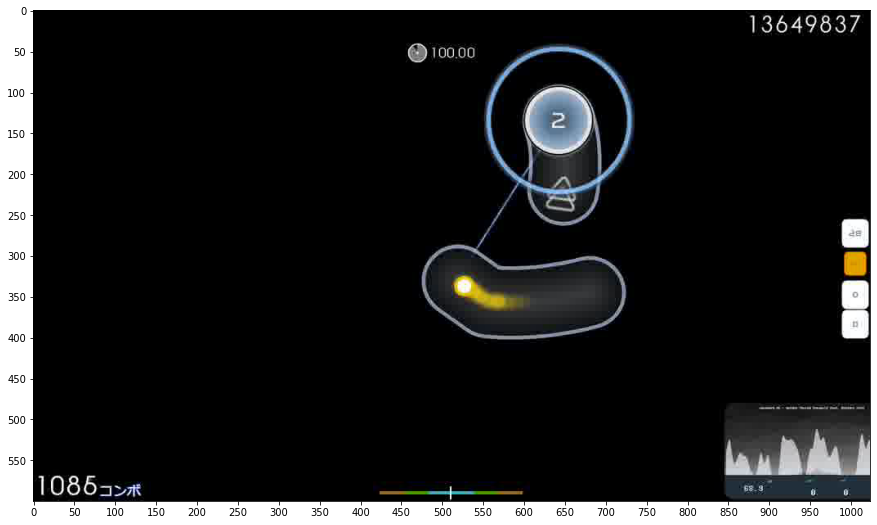

In [19]:
import matplotlib.pyplot as plt

import op

op.h = 600 / 2
op.w = 1024 / 2
op.calratio()

e = s[0]
print(e[0][0].permute(1, 2, 0).numpy().shape)

plt.rcParams["figure.figsize"] = (15, 15)

plt.xticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[1], 50))
plt.yticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[0], 50))

plt.imshow(cv2.cvtColor(e[0][0].permute(1, 2, 0).numpy(), cv2.COLOR_BGR2RGB))
print(e[1][0][1], e[1][0][0])
print(op.cor(e[1][0][1] * 512, e[1][0][0] * 384))
#print(op.cor(e[1][0][1], e[1][0][0]))
#for x in e[1][0:10]:
    #print(op.cor(x[0], x[1]))

# Process Data

In [7]:
import time

In [7]:
ds = OSR_Dataset('../beatmaps', sample_rate=sample_rate, hop_size=hop_size, hidden_mod=1, maximum=256)

0/255 Chata - Engage (Lasse) [Insane].osu
1/255 Mimi - Surrealism (feat. ZAT) (-Tatsuo) [no mania].osu
2/255 sana - kanojo wa tabi ni deru (Firika) [Insane].osu
3/255 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
4/255 StylipS - Prism Sympathy(Asterisk Remix) (iMage--) [Kaleid Liner].osu
5/255 Cranky - Chandelier - King (Mao) [Gero's Insane].osu
6/255 senya - Akatsuki no Suiheisen ni (Satellite) [Zweib's Insane].osu
7/255 Tadokoro Azusa - 1HOPE SNIPER (Sotarks) [NiNo's Insane].osu
8/255 fripSide - future gazer (TV Size) (alacat) [Insane].osu
9/255 cYsmix - bells! (Gero) [normal!].osu
10/255 Yazawa Nico (CV.Tokui Sora) - Nicopuri Joshidou (yf_bmp) [z1085684963's Insane].osu
11/255 Hamburgaga - Watame Internet Connection Race (CE6A) [Insane].osu
12/255 xi - Parousia -LAST JUDGMENT- (Zapy) [Retribution].osu
13/255 Shiena Nishizawa - Meaning (Taeyang) [xChippy's Insane].osu
14/255 namirin - Hitokoto no Kyori (sahuang) [Linadeft's Insane].osu
15/255 Narushi

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 7482 in argument 0, but got NoneType


pruning: Fujijo Seitokai Shikkou-bu - Best FriendS (sahuang) [N a s y a's Insane].osu
60/255 Omoi - Chiisana Koi no Uta (Synth Rock Cover) (val0108) [Marianna's Insane].osu
61/255 Natsumi Kiyoura - Tabi no Tochuu (Weinmagier) [Normal].osu
62/255 Nico Nico Douga - U.Nknown Goose (Borokuzu) [Insane].osu
63/255 Hatsune Miku - Moon (Saten ruiko) [Insane].osu
64/255 fripSide - black bullet (TV Size) (Chloe) [Insane].osu
65/255 Hatsune Miku - the last effect (Holoaz) [ringloid].osu
66/255 Gojou Kai - Touhou Youkai Komachi (James) [Normal].osu
67/255 REOL - Hibikase (Gero) [NiNo's Insane].osu
68/255 Kuba Oms - My Love (W h i t e) [Insane].osu
69/255 Yasuo - P - Electric Angel (- Ruby Rose -) [Insane].osu
70/255 Shimotsuki Haruka, Suzuyu - Fairy Wreath (ImpurePug) [Angraecum].osu
71/255 ClariS - Connect (TV Size) (browiec) [Mathew's Insane].osu
72/255 DIVELA feat. Hatsune Miku - BEAT SYNCER (Log Off Now) [Insane].osu
73/255 The Quick Brown Fox - The Big Black (Blue Dragon) [WHO'S AFRAID OF THE

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 6527 in argument 0, but got NoneType


75/255 toby fox - Nyeh Heh Heh! & Bonetrousle (DaxMasterix) [NORMAL].osu
76/255 ryo (supercell) - ODDS&ENDS (Short Ver.) (Betsuto) [Insane].osu
77/255 TRakker - Trail of Dust (Amamiya Yuko) [Trail of Star].osu
78/255 Police Piccadilly feat. Hatsune Miku - Kire Carry On (Sinnoh) [negusver's Insane].osu
79/255 MOSAIC.WAV - Zen Sekai Teki Touch Panel (Laurier) [CrystLer].osu
80/255 Aiobahn & Yunomi - Makuramoto ni Ghost (feat. Nicamoq) (Swan) [Swan's Melanzana].osu
81/255 Camellia - Routing (Shiirn) [pishi's Advanced].osu
82/255 seleP feat. Lily - Chloe-Five Decades Ago- (Duftende Pizza) [V].osu
83/255 dj TAKA - quaver (Monstrata) [Haru's Insane].osu
84/255 Silver Forest Feat. Aki & Sakura Mayuko - Summer time Heaven -after (RVMathew) [Ojou].osu
85/255 Van Darkholme - GachiMuchi circulation (Kr0n0s23) [Thank you, sir!].osu
86/255 Ariabl'eyeS - Senkou no Furea (Kibbleru) [Redemption].osu
87/255 ATeens - Gimme! Gimme! Gimme! (Nightcore Mix) (ShadowSoul) [Gimme!].osu
88/255 Tomoe Tamiyasu - 

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 512 in argument 0, but got NoneType


pruning: Tomoe Tamiyasu - Yamato Nadeshiko Hanakotoba (Lasse) [Insane].osu
89/255 Masayoshi Minoshima ft. nomico - Bad Apple!! (Ephemeral) [Normal].osu
90/255 solfa feat. Shimotsuki Haruka - Natsuiro Ramune (Lasse) [Bariton's Insane].osu
91/255 Nakagawa Shouko - Sorairo Days (Rizen) [Fizz's Insane].osu
92/255 LeaF - Calamity Fortune (Arphimigon) [BOOM].osu
93/255 cillia - Fairytale, (SkinnyJommy) [Pho's Insane].osu
94/255 Lindsey Stirling - Senbonzakura (MrSergio) [Insane].osu
95/255 Hatsune Miku - Senkouhanabi Aika (val0108) [Insane].osu
96/255 Hatsune Miku - Himitsu Keisatsu (Lalarun) [Insane].osu
97/255 MISATO - Necro Fantasia (WORSTPOLACKEU) [Cheesecake's Insane].osu
98/255 a_hisa - Cheshire,s dance (Muya) [Normal].osu
99/255 Roselia - The Everlasting Guilty Crown (Underdogs) [Insane].osu
100/255 40meter-P - Mousou sketch (Noways) [Insane!].osu
101/255 sasakure.UK x DECO27 - 39 (Finshie) [Insane].osu
102/255 Chata - len (Cami) [xiqingwa's Lunatic].osu
103/255 Fractal Dreamers - Fat

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


121/255 Sawai Miku - Colorful. (Asterisk DnB Remix) (Asfand) [Vibrant].osu
122/255 Yunomi & nicamoq - Indoor Kei Nara Trackmaker (dipperbee) [TrAcK MaKeR].osu
123/255 GTA feat. Sam Bruno - Red Lips (Mendus Remix) (Euny) [Natsu's Insane].osu
124/255 TrySail - Utsuroi (Short Ver.) (Log Off Now) [Nexus' Insane].osu
125/255 ZAQ - Seven Doors (eINess) [wkyik's Insane].osu
126/255 M2U - Stellar (Ultima Fox) [defiance's Insane].osu
127/255 SawanoHiroyuki[nZk]mizuki - aLIEz (jonathanlfj) [Trust's Normal].osu
128/255 YOASOBI - Yoru ni Kakeru (Petal) [Keirelia's Insane].osu
129/255 Usada Pekora - Discommunication Alien (Yugu) [XLT's Insane].osu
130/255 EastNewSound - Sadistic Paranoia (TicClick) [Vass-RJ's Hard].osu
131/255 Sound Souler - Paradise (kwk) [Mir's Insane].osu
132/255 Hatsune Miku - Subarashii Sekai (val0108) [Insane].osu
133/255 AAAA - carnation (Veridian) [noffy's normal].osu
134/255 Kamogawa rokkaazu (CVKubota Kaoru) - STONES (Pata-Mon) [GDInsane [placeholder]].osu
135/255 UNISON 

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


175/255 petit milady - Koi wa Milk Tea (Okoratu) [Normal].osu
176/255 Dark PHOENiX - Taketori Hishou (KanbeKotori) [Extra].osu
177/255 Mili - Origin (TV Size) (Ryuusei Aika) [kanor's Insane].osu
178/255 Hanataba - Night of Knights (v2b) [Normal].osu
179/255 Sagara Kokoro - Hoshizora no Ima (Star Stream) [Insane].osu
180/255 Hanatan - Uta ni Katachi wa Nai keredo (Asahina Momoko) [Recollection].osu
181/255 PinocchioP - SLoWMoTIoN (Short Ver.)feat.Hatsune Miku (lllmtklll) [Insane].osu
pruning: PinocchioP - SLoWMoTIoN (Short Ver.)feat.Hatsune Miku (lllmtklll) [Insane].osu
182/255 Yoko Takahashi - Zankoku Na Tenshi No These (TV. Size Version) (moph) [Ambient's Insane].osu
183/255 Noboru ft. Hatsune Miku - Shiroi Yuki No Princess Wa (Hokichi) [ShiraHoki's Light Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


184/255 Chitose Sara - Arcadia (Short ver.) (Riven) [-Tochi's Insane].osu
185/255 eyemedia - Bloody Purity (tsuka) [Normal].osu
pruning: eyemedia - Bloody Purity (tsuka) [Normal].osu
186/255 Atoguru - Itoshi Kimi wo Mitsuke ni (Pizza Kun) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


187/255 Hanasaka Yui(CV M.A.O) - Harumachi Clover (Naotoshi) [Light Insane].osu
188/255 Hatsune Miku - Ephemeral (Wishkey) [Fade Away].osu
189/255 emon - shake it! (kosiga) [Normal].osu
190/255 Suzuki Konomi - This game (TV Size) (Sekai-nyan) [Nyquill's Insane Game].osu
191/255 Warak - REANIMATE (iyasine) [xsrs's Extra].osu
192/255 Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


pruning: Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu
193/255 Kuroneko Dungeon - Ryoushi no Umi no Lindwurm (Crystal) [ak74's Insane].osu
194/255 Feint - Reprise (Secretpipe) [Sieg's Light Insane].osu
195/255 Umetora - Ifuudoudou (Nymph) [Insane].osu
196/255 Hana - Kuukirikigaku Shoujo to Shounen no Uta (Soleily Remix) (Koiyuki) [Yuki].osu
197/255 wowaka - Unknown Mother-Goose feat. Hatsune Miku (tutuhaha) [Insane].osu
198/255 Megurine Luka - LukaLuka Night Fever (samipale) [Normal+].osu
199/255 paraoka feat. harunya & amane - Trickstar (lahphnya) [Insane].osu
200/255 Silver Forest - PORUTA ~ gaisuto no himatsubushi (Eirene) [Normal].osu
201/255 rerulili - Noushou Sakuretsu Girl (NatsumeRin) [dksslqj Style].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


pruning: rerulili - Noushou Sakuretsu Girl (NatsumeRin) [dksslqj Style].osu
202/255 Yooh - MariannE (Yogurtt) [Extra].osu
203/255 Various Artists - IIDX collection (N a s y a) [V3].osu
204/255 CHiCO with HoneyWorks - Heart no Shuchou (Sotarks) [Yuitarks' Insane].osu
205/255 Demetori - Fall of Fall ~ The Door Into Summer (jonathanlfj) [Extra Stage].osu
206/255 u's - Baby Maybe Koi no Button (Asterisk DnB Remix) (jeydude) [Love Live!].osu
207/255 ALTIMA - Burst The Gravity (TV Size) (bes_joker) [Insane].osu
pruning: ALTIMA - Burst The Gravity (TV Size) (bes_joker) [Insane].osu
208/255 Chiyoko - Baby Fantastic! -Short ver.- (Zweib) [iMage's Insane].osu
209/255 Apocalyptica - Rage of Poseidon (pishifat) [Extreme].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


210/255 fripSide - snow blind -after- (Mordred) [Tears Like Snowflakes].osu
211/255 ryo (supercell) feat.Hatsune Miku - Tsumi no Namae (Monstrata) [Blooming].osu
212/255 Uehara Rena - Todokanai Koi '13 (TV EDIT) (Sellenite) [Rewrite].osu
213/255 Giga-P - LUVORATORRRRRY! (Selisi) [Insane].osu
214/255 Barbarian On The Groove feat. Takizawa Ichiru - Yoi ni Kanawazu (Shurelia) [Hard].osu
215/255 livetune feat.Hatsune Miku - Last Night, Good Night (Autumn) [Oyasumi].osu
216/255 MiddleIsland - Achromat (zxhzxhz) [Insane].osu
217/255 Tamura Yukari - MERRY MERRY MERRY MENU... Ne! (moonlightleaf) [wkyik's Insane].osu
218/255 Dreamcatcher - YOU AND I (Natsu) [Insane].osu
219/255 M2U - Dual Fractal (Hailie) [Insane].osu
220/255 EGOIST - Namae no Nai Kaibutsu (LunarSakuya) [lfj's Insane].osu
221/255 ginkiha - dawn(ginkiha hardcore remix) (Aka) [Kyubey's Insane].osu
222/255 seleP - Remember me (Avishay) [A's Extra].osu
223/255 Kano - Stella-rium (Kowari) [Insane].osu
224/255 IOSYS - Hakurei Jinja (

In [8]:
start = time.time()

torch.save(ds, ds_path)

end = time.time()
print(end - start, 'secs')

0.0817873477935791 secs


# Load Daaset

In [9]:
ds = torch.load(ds_path)

# Model

In [8]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as nnF

from attention.attention import SpatialAttn, ProjectorBlock

In [9]:
class VN(nn.Module):
    def __init__(self, dim_in, device):
        super(VN, self).__init__()
        
        self.device = device
        self.lstmA_size = 256
        self.lstmA_layers = 2
        self.dim_out = 2
        
        #self.convA1 = nn.Conv3d(1, 1, (3, 1, 1), stride=1, padding=0)
        self.convB1 = nn.Conv2d(1, 4, 3, stride=1, padding=1) 
        self.maxPB1 = nn.MaxPool2d(3, stride=2, padding=1)

        self.convC1 = nn.Conv2d(4, 8, 3, stride=1, padding=1) 
        self.maxPC1 = nn.MaxPool2d(3, stride=2, padding=1)
        
        #self.linear1 = nn.Linear(19456, 1024)
       
        self.lstmA = nn.LSTM(19456, hidden_size=self.lstmA_size, num_layers=self.lstmA_layers,
                             batch_first=True, bidirectional=False)
        self.linearA = nn.Linear(self.lstmA_size, self.lstmA_size)
        self.normA = nn.LayerNorm(self.lstmA_size)
        self.linearB = nn.Linear(self.lstmA_size, 32)
        self.normB = nn.LayerNorm(32)
        self.linearC = nn.Linear(32, self.dim_out)
        
        self.hiddenA = None
        
    def _make_layer(self, in_features, out_features, blocks, pool=False):
        layers = []
        for i in range(blocks):
            conv2d = nn.Conv2d(in_channels=in_features, out_channels=out_features, kernel_size=3, padding=1, bias=False)
            layers += [conv2d, nn.BatchNorm2d(out_features), nn.ReLU(inplace=True)]
            in_features = out_features
            if pool:
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        return nn.Sequential(*layers)
        
    def init_hidden(self, batch_size):
        h = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        c = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        self.hiddenA = (h, c)
 
    def forward(self, x):
        s = x.shape
        x = torch.reshape(x, (s[0] * s[1], s[2], s[3], s[4]))
        
        #x = x.unsqueeze(1)
        #x = self.convA1(x)
        #x = nnF.relu(x)
        #x = x.squeeze(1)
        x = self.convB1(x)
        x = nnF.relu(x)
        x = self.maxPB1(x)
        x = self.convC1(x)
        x = nnF.relu(x)
        x = self.maxPC1(x)
        
        x = torch.flatten(x, start_dim=1)
        x = torch.reshape(x, (s[0], s[1], x.shape[-1]))
        
        #x = self.linear1(x)
        
        x, self.hiddenA = self.lstmA(x, self.hiddenA)
        x = self.linearA(x)
        x = self.normA(x)
        x = nnF.relu(x)
        x = self.linearB(x)
        x = self.normB(x)
        x = nnF.relu(x)
        x = self.linearC(x)
        
        return x

# Training

In [10]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt
import op

In [11]:
batch_size = 1
scale = 1/4
dim_in = (int(600 * scale), int(1024 * scale))
seq_dur = 2

In [12]:
device = torch.device('cuda')

In [25]:
epoch_cum = 0
best_loss = 9999
best_weights = None
val_hist = []
train_hist = []
vn = VN(dim_in=dim_in, device=device)
vn.to(device)

VN(
  (convB1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convC1): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPC1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (lstmA): LSTM(19456, 256, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=256, out_features=256, bias=True)
  (normA): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (linearB): Linear(in_features=256, out_features=32, bias=True)
  (normB): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
  (linearC): Linear(in_features=32, out_features=2, bias=True)
)

In [26]:
vn.init_hidden(1)
summary(vn, input_size=(1, 1, 1, dim_in[0], dim_in[1]), col_width=16,
           col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
VN                                       --               --               --               --               --
├─Conv2d: 1-1                            [1, 1, 150, 256] [1, 4, 150, 256] 40               [1, 4, 3, 3]     1,536,000
├─MaxPool2d: 1-2                         [1, 4, 150, 256] [1, 4, 75, 128]  --               --               --
├─Conv2d: 1-3                            [1, 4, 75, 128]  [1, 8, 75, 128]  296              [4, 8, 3, 3]     2,841,600
├─MaxPool2d: 1-4                         [1, 8, 75, 128]  [1, 8, 38, 64]   --               --               --
├─LSTM: 1-5                              [1, 1, 19456]    [1, 1, 256]      20,713,472       --               20,713,472
├─Linear: 1-6                            [1, 1, 256]      [1, 1, 256]      65,792           [256, 256]       65,792
├─LayerNorm: 1-7                         [1, 1, 256]      [1, 1, 256]  

In [17]:
train_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)
val_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)

In [18]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(vn.parameters(), lr=0.001)

In [19]:
op.h = dim_in[0]
op.w = dim_in[1]
op.calratio()

def trainVN():
    global epoch_cum
    global best_loss, best_weights
    global v, c, PV, pv, g, gt, MP, MC
    
    print(1, 'of', epochs+epoch_cum)    
    for epoch in range(epochs):
        vn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for v, c in info:
        #for v, c in train_ldr:
            V, C = v.to(device), c.to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)

            loss = criterion(PV, C[:,:,:2])
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        vn.eval()
        torch.no_grad()
        val_loss = 0
        for i, (v, c) in enumerate(val_ldr):
            V, C = v.to(device), c.to(device)

            vn.init_hidden(v.shape[0])
            PV = vn(V)
            
            loss = criterion(PV, C[:,:,:2])
            val_loss += loss.item()
            print("\r                                                           ", end="\r")
            print("\rval:", str(i) + '/' + str(len(val_ds)), "loss:", f'{loss.item():.4f}', end="\r")
        print('')

        plt.rcParams["figure.figsize"] = (15, 5)
        plt.figure()
        _, p = plt.subplots(1, 3)
        
        e = v[0][-32].permute(1, 2, 0).numpy()
        g = c[0][10][:2]
        print('pred:', float(PV[0][0][1]), float(PV[0][0][0]))
        print('gt:', float(g[1]), float(g[0]))
        print(op.cor(g[1] * 512, g[0] * 384))
        p[0].imshow(cv2.cvtColor(e, cv2.COLOR_BGR2RGB))
        
        pv = PV[0].cpu().detach().numpy().transpose(1, 0)
        p[1].plot(pv[1] * 512, pv[0] * 384)
        gt = c[0].permute(1, 0).numpy()
        p[1].plot(gt[1] * 512, gt[0] * 384)
        p[1].set_xlim([0, 512])
        p[1].set_ylim([-128, 384])
        p[1].invert_yaxis()
        
        train_loss = train_loss/len(train_ldr)
        val_loss = val_loss/len(val_ldr)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        p[2].plot(train_hist)
        p[2].plot(val_hist)
        plt.show()
        
        print("\n", epoch+epoch_cum+1, 'of', epochs+epoch_cum)

        if val_loss < best_loss:
            best_loss = val_loss
            best_weights = vn.state_dict().copy()

    epoch_cum += epochs

In [20]:
def trainVNRecurse():
    global epoch_cum
    global best_loss, best_weights
    global v, c, PV, pv, g, gt, MP, MC

    loss_avg = 1
    print(1, 'of', epochs+epoch_cum)
    for epoch in range(epochs):
        vn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        rv = []
        rc = []
        tloss = []
        for v, c in info:
        #for v, c in train_ldr:
            V, C = v.to(device), c.to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)

            loss = criterion(PV, C[:,:,:2])
            loss.backward()
            optimizer.step()
            
            tloss.append(loss.item())
            if loss.item() > loss_avg+loss_thresh:
                if torch.max(c[:,:2]) > 0:
                    rv.append(v)
                    rc.append(c)
            
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})    
        loss_avg = train_loss/len(train_ldr)
        print('avg:', loss_avg)
        
        i = 0
        print('outliers:', len(rc))
        while len(rc) > rnum_min:
            if i >= len(rc):
                i = 0
            V, C = rv[i].to(device), rc[i].to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)

            loss = criterion(PV, C[:,:,:2])
            loss.backward()
            optimizer.step()
            
            if loss.item() < loss_avg+loss_thresh:
                del rc[i]
                del rv[i]
            else:
                i += 1
            print("\r                           ", end="\r")
            print("\rretrain:", len(rc), end='')
        print('')

        vn.eval()
        torch.no_grad()
        val_loss = 0
        for i, (v, c) in enumerate(val_ldr):
            V, C = v.to(device), c.to(device)

            vn.init_hidden(v.shape[0])
            PV = vn(V)
            
            loss = criterion(PV, C[:,:,:2])
            val_loss += loss.item()
            print("\r                                                           ", end="\r")
            print("\rval:", str(i+1) + '/' + str(len(val_ds)), "loss:", f'{loss.item():.4f}', end="\r")
        print('')

        plt.rcParams["figure.figsize"] = (15, 5)
        plt.figure()
        _, p = plt.subplots(1, 4)
        
        e = v[0][-32].permute(1, 2, 0).numpy()
        g = c[0][10][:2]
        print('pred:', float(PV[0][0][1]), float(PV[0][0][0]))
        print('gt:', float(g[1]), float(g[0]))
        print(op.cor(g[1] * 512, g[0] * 384))
        p[0].imshow(cv2.cvtColor(e, cv2.COLOR_BGR2RGB))
        
        pv = PV[0].cpu().detach().numpy().transpose(1, 0)
        p[1].plot(pv[1] * 512, pv[0] * 384)
        gt = c[0].permute(1, 0).numpy()
        p[1].plot(gt[1] * 512, gt[0] * 384)
        p[1].set_xlim([0, 512])
        p[1].set_ylim([-128, 384])
        p[1].invert_yaxis()
        
        train_loss = train_loss/len(train_ldr)
        val_loss = val_loss/len(val_ldr)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        p[2].plot(train_hist)
        p[2].plot(val_hist)
        p[3].plot(tloss)
        plt.show()
        
        print("\n", epoch+epoch_cum+1, 'of', epochs+epoch_cum)
        
        if val_loss < best_loss:
            best_loss = val_loss
            best_weights = vn.state_dict().copy()
    epoch_cum += epochs

1 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.70it/s  0.0223                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0578                                    
pred: 0.3279969394207001 0.42076966166496277
gt: 0.51953125 0.1744791716337204
(128, 38)


<Figure size 1080x360 with 0 Axes>

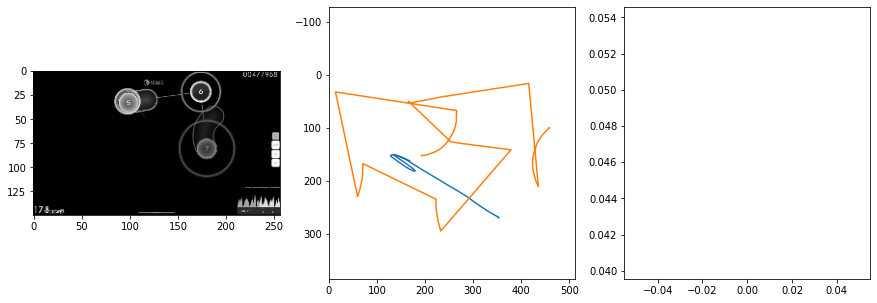


 1 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0055                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0364                                    
pred: 0.5187888145446777 0.6459579467773438
gt: 0.36857834458351135 0.5625
(105, 83)


<Figure size 1080x360 with 0 Axes>

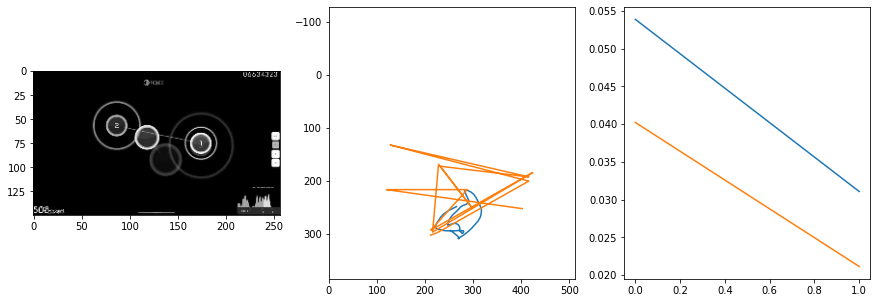


 2 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.90it/s  0.0089                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0122                                    
pred: 0.504168689250946 0.4503370523452759
gt: 0.5053123831748962 0.3699844777584076
(126, 61)


<Figure size 1080x360 with 0 Axes>

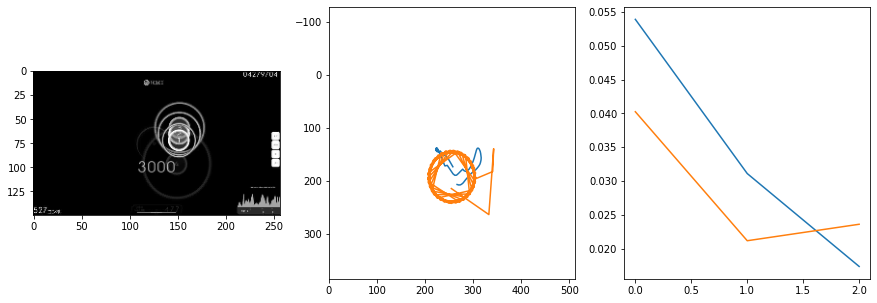


 3 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0100                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0073                                    
pred: 0.5118829607963562 0.20621436834335327
gt: 0.537200927734375 0.15366138517856598
(131, 35)


<Figure size 1080x360 with 0 Axes>

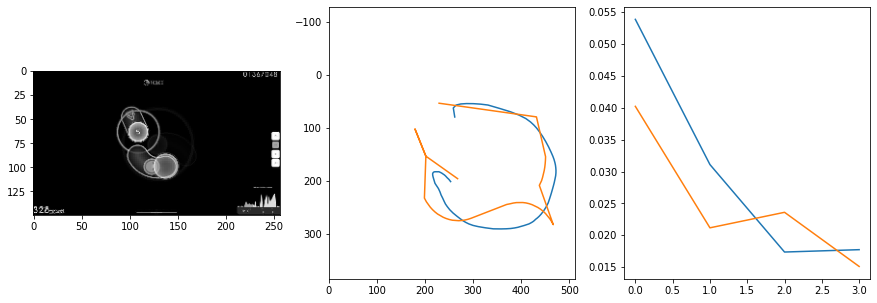


 4 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.90it/s  0.0138                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0174                                    
pred: 0.5571154952049255 0.3811296820640564
gt: 0.28125542402267456 0.2916690707206726
(91, 51)


<Figure size 1080x360 with 0 Axes>

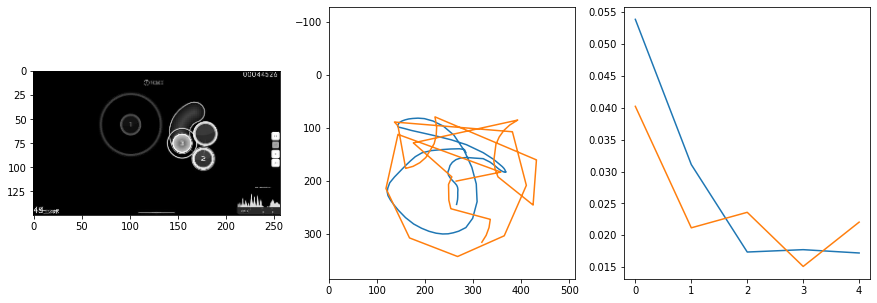


 5 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.42it/s  0.0203                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0091                                    
pred: 0.2907785177230835 0.3957185745239258
gt: 0.2384614497423172 0.2604169547557831
(84, 48)


<Figure size 1080x360 with 0 Axes>

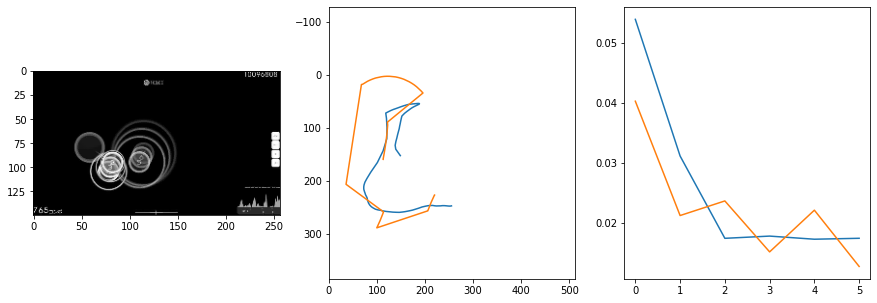


 6 of 6
190.69676685333252 secs


In [21]:
start = time.time()

epochs = 6
trainVN()

end = time.time()
print(end - start, 'secs')

In [22]:
train_hist = []
val_hist = []

1 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.74it/s  0.0101                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.015450097090084752
outliers: 0

val: 50/50 loss: 0.0070                                    
pred: 0.4784608483314514 0.5664252638816833
gt: 0.4605770409107208 0.42523089051246643
(119, 67)


<Figure size 1080x360 with 0 Axes>

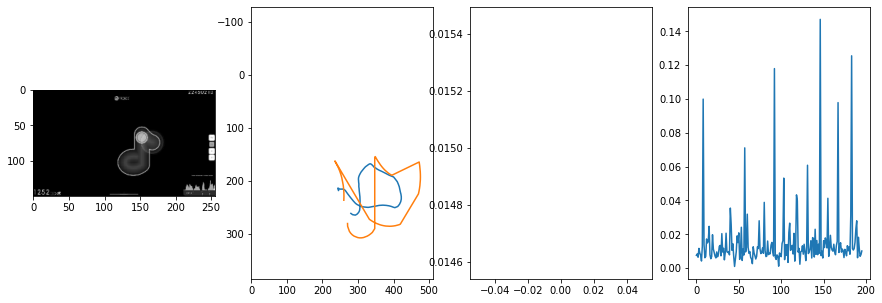


 7 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.63it/s  0.0194                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012869713555341966
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0148                                    
pred: 0.3920099139213562 0.3218874931335449
gt: 0.5322664380073547 0.3001113533973694
(130, 52)


<Figure size 1080x360 with 0 Axes>

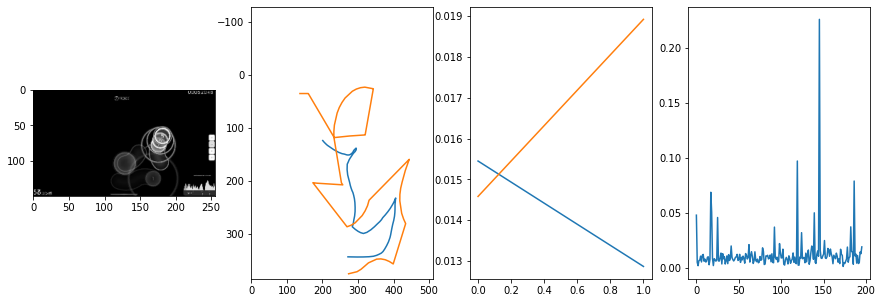


 8 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.55it/s  0.0237                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012704229374488635
outliers: 52
retrain: 8                 
val: 50/50 loss: 0.0099                                    
pred: 0.1466626226902008 0.4806045889854431
gt: 0.14117176830768585 0.45204952359199524
(69, 70)


<Figure size 1080x360 with 0 Axes>

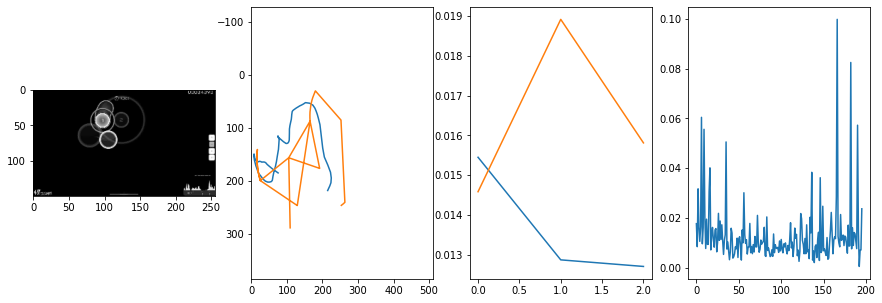


 9 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.66it/s  0.0225                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.015385505504554555
outliers: 63
retrain: 8                 
val: 50/50 loss: 0.0103                                    
pred: 0.5628735423088074 0.46947866678237915
gt: 0.7272274494171143 0.29547014832496643
(160, 52)


<Figure size 1080x360 with 0 Axes>

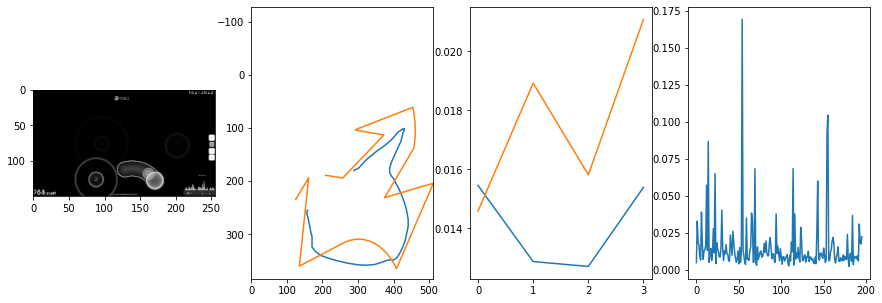


 10 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.60it/s  0.0543                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.014107739672240592
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0046                                    
pred: 0.5135822296142578 0.41920986771583557
gt: 0.5234367251396179 0.26822757720947266
(129, 49)


<Figure size 1080x360 with 0 Axes>

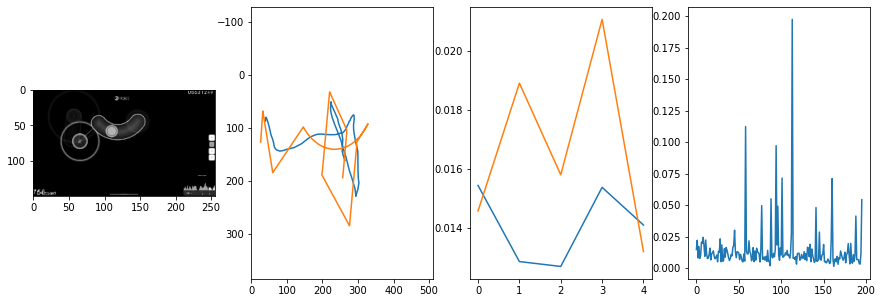


 11 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.54it/s  0.0022                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009429046808152782
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0088                                    
pred: 0.8925785422325134 0.3993479609489441
gt: 0.9235130548477173 0.44101107120513916
(191, 69)


<Figure size 1080x360 with 0 Axes>

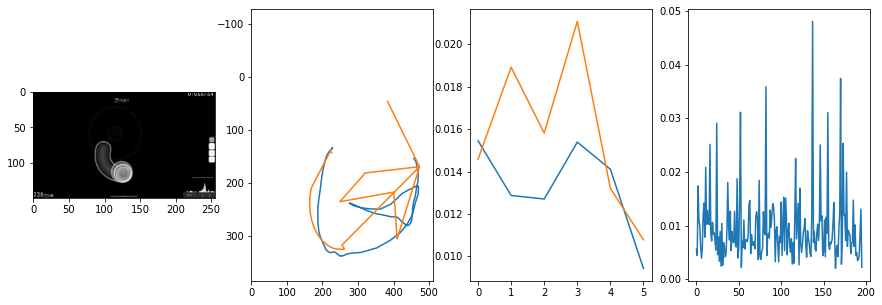


 12 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.65it/s  0.0109                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011766608999281818
outliers: 59
retrain: 8                 
val: 50/50 loss: 0.0138                                    
pred: 0.24157926440238953 0.5035982728004456
gt: 0.19726572930812836 0.5598957538604736
(78, 83)


<Figure size 1080x360 with 0 Axes>

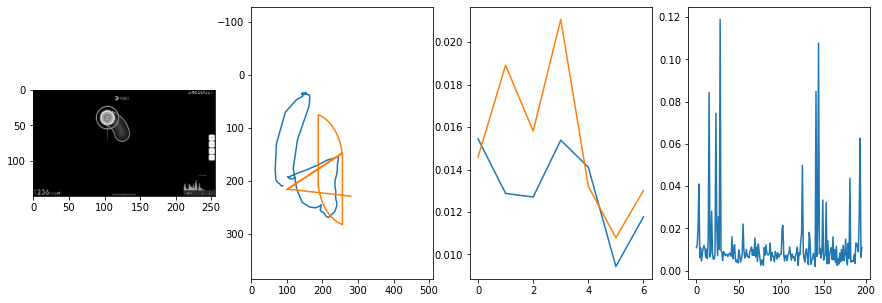


 13 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.61it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011356883219025117
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.1098                                    
pred: 0.504111111164093 0.5469518899917603
gt: 0.16180871427059174 0.2130710631608963
(73, 42)


<Figure size 1080x360 with 0 Axes>

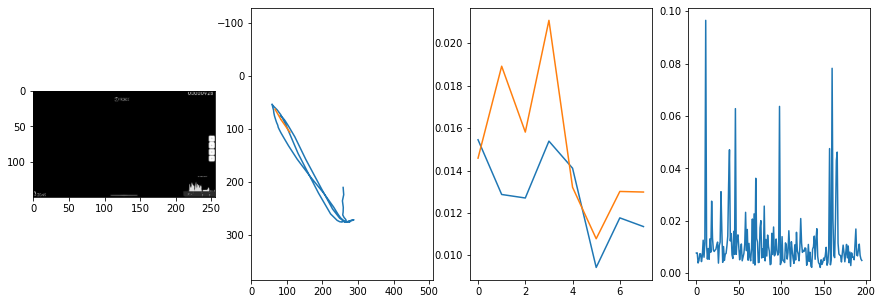


 14 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.66it/s  0.0050                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009938711692800042
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.5695539712905884 0.7914950251579285
gt: 0.7557870745658875 0.8021268844604492
(165, 111)


<Figure size 1080x360 with 0 Axes>

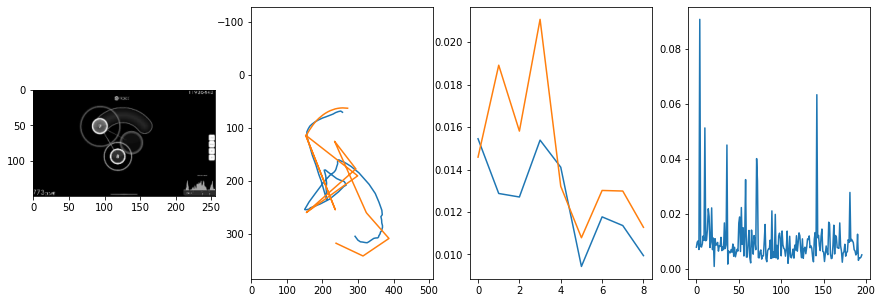


 15 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.60it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011781672687550095
outliers: 47
retrain: 8                 
val: 50/50 loss: 0.0095                                    
pred: 0.3084009885787964 0.45563411712646484
gt: 6.412744551198557e-05 0.24478988349437714
(48, 46)


<Figure size 1080x360 with 0 Axes>

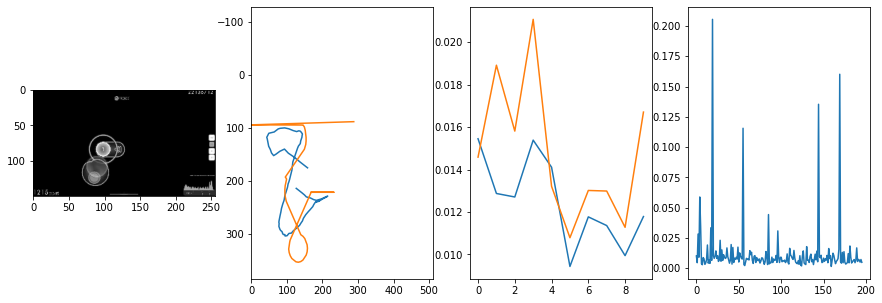


 16 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.63it/s  0.0057                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.013142101552779312
outliers: 48
retrain: 8                 
val: 50/50 loss: 0.0060                                    
pred: 0.4015354812145233 0.7158021330833435
gt: 0.42188340425491333 0.8958196640014648
(113, 122)


<Figure size 1080x360 with 0 Axes>

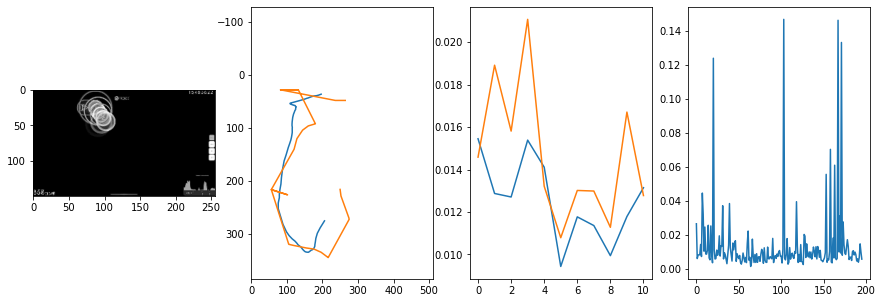


 17 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.69it/s  0.0096                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012239838638509224
outliers: 47
retrain: 8                 
val: 50/50 loss: 0.0064                                    
pred: 0.5068249106407166 0.5296661853790283
gt: 0.43603643774986267 0.5983906388282776
(115, 87)


<Figure size 1080x360 with 0 Axes>

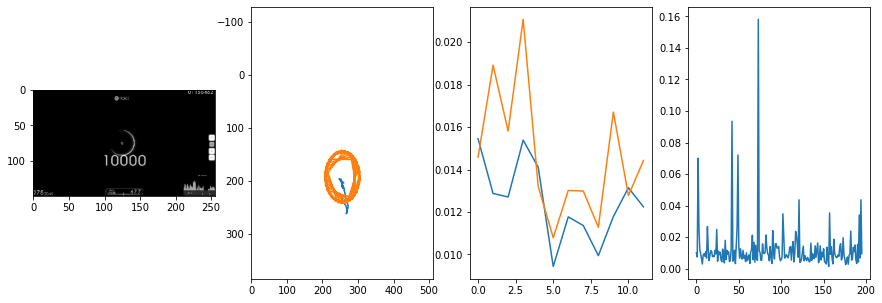


 18 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.64it/s  0.0148                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011530100575253862
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0162                                    
pred: 0.6974008679389954 0.7435228824615479
gt: 0.2438488006591797 0.5828235745429993
(85, 85)


<Figure size 1080x360 with 0 Axes>

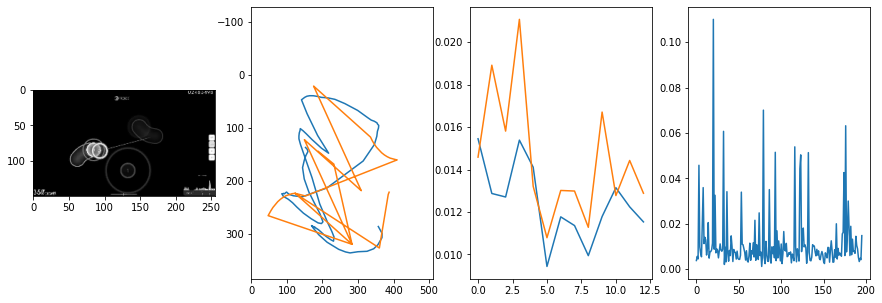


 19 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.66it/s  0.0212                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010773035476687459
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.535476803779602 0.9122703075408936
gt: 0.20724841952323914 0.8650999069213867
(80, 118)


<Figure size 1080x360 with 0 Axes>

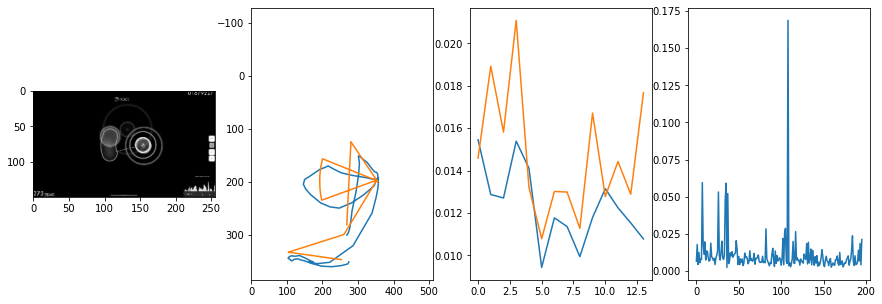


 20 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.63it/s  0.0162                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011426537206196892
outliers: 46
retrain: 8                 
val: 50/50 loss: 0.0102                                    
pred: 0.7168022990226746 0.5178738236427307
gt: 0.6687836050987244 0.5042338967323303
(151, 76)


<Figure size 1080x360 with 0 Axes>

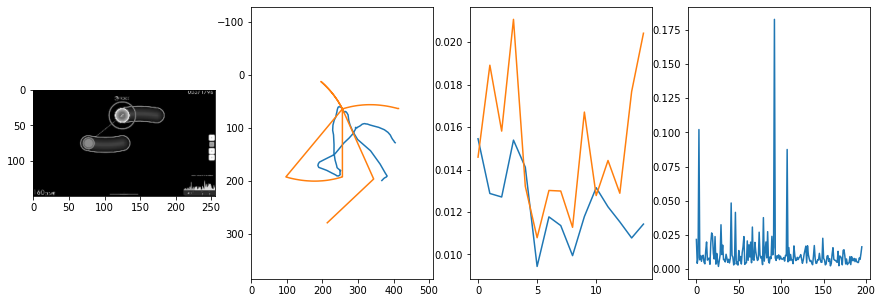


 21 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.57it/s  0.0074                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009849184432675188
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0126                                    
pred: 0.7878093123435974 0.21936531364917755
gt: 0.6505998373031616 0.16198477149009705
(148, 36)


<Figure size 1080x360 with 0 Axes>

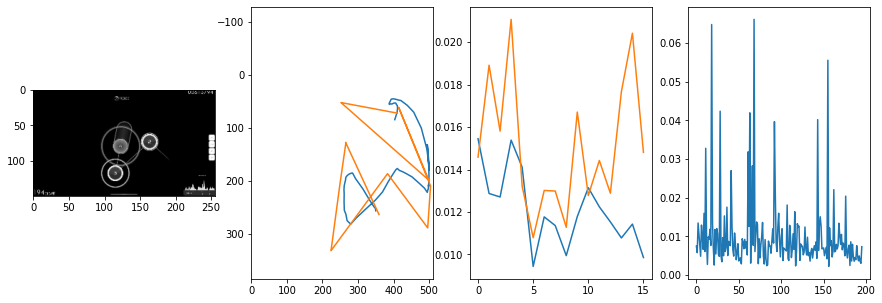


 22 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.67it/s  0.0315                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010165951337679575
outliers: 46
retrain: 8                 
val: 50/50 loss: 0.2311                                    
pred: 0.45451316237449646 0.4342885911464691
gt: 0.8535115718841553 0.9348917603492737
(180, 126)


<Figure size 1080x360 with 0 Axes>

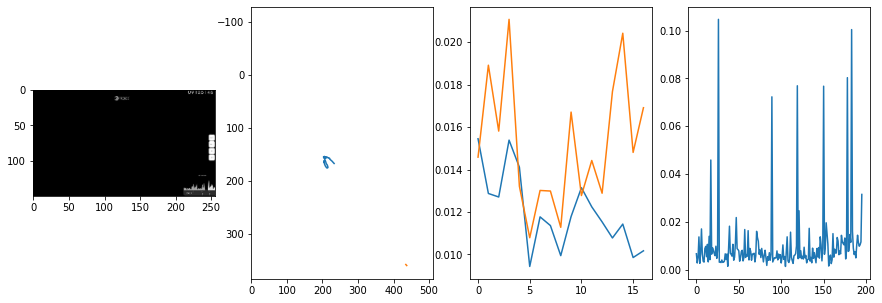


 23 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.64it/s  0.0044                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009545765065811384
outliers: 47
retrain: 8                 
val: 50/50 loss: 0.0049                                    
pred: 0.625784158706665 0.6271518468856812
gt: 0.7952659726142883 0.29554489254951477
(171, 52)


<Figure size 1080x360 with 0 Axes>

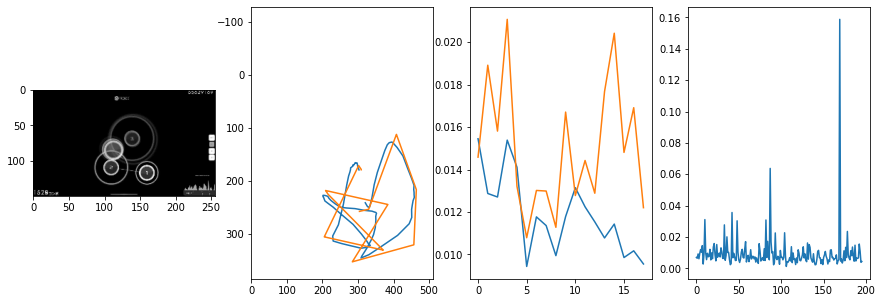


 24 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.56it/s  0.0095                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009613301048746655
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.5513998866081238 0.452497661113739
gt: 0.8658087849617004 0.45119723677635193
(182, 70)


<Figure size 1080x360 with 0 Axes>

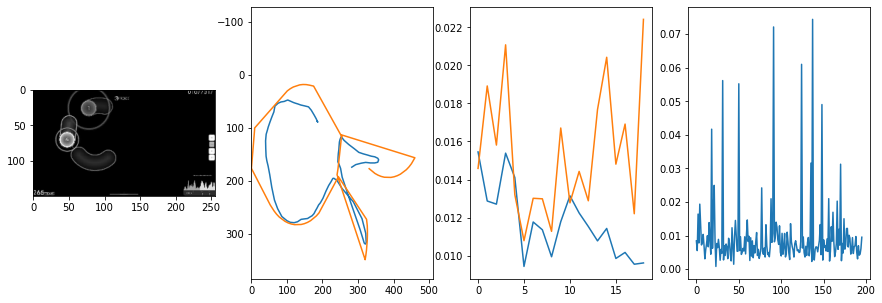


 25 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.57it/s  0.0337                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009238811335122516
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0091                                    
pred: 0.5723537802696228 0.4902319610118866
gt: 0.41173025965690613 0.4442993104457855
(111, 69)


<Figure size 1080x360 with 0 Axes>

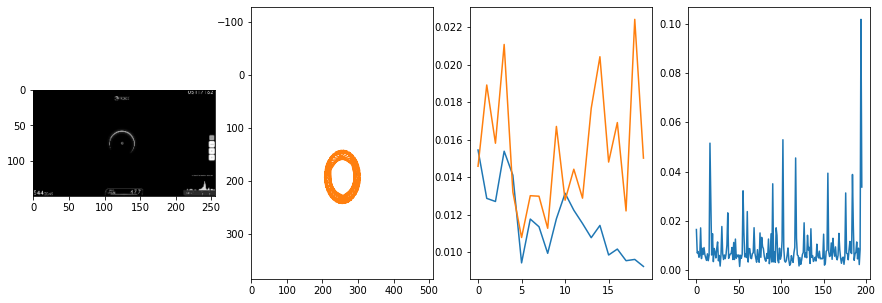


 26 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.63it/s  0.0029                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008851583152581766
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.725373387336731 0.8253351449966431
gt: 0.7644404172897339 0.8903066515922546
(166, 121)


<Figure size 1080x360 with 0 Axes>

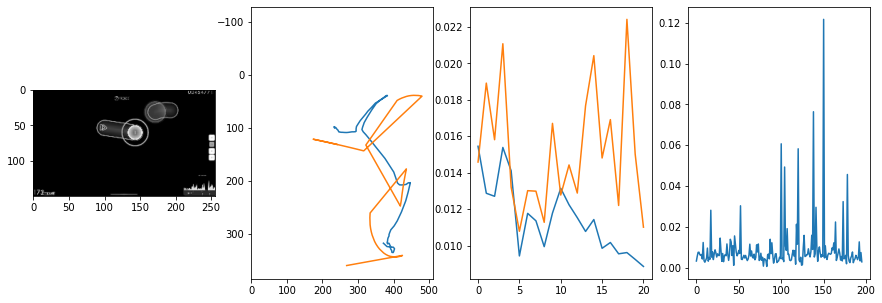


 27 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.62it/s  0.0077                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008732176603207707
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0076                                    
pred: 0.38678789138793945 0.53783118724823
gt: 0.4746094048023224 0.4973958432674408
(121, 75)


<Figure size 1080x360 with 0 Axes>

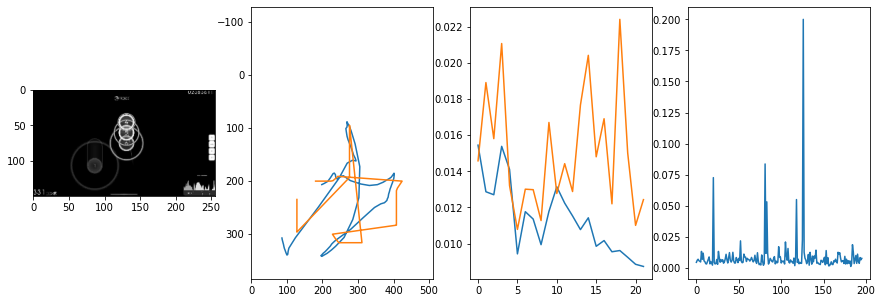


 28 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.62it/s  0.0051                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011763891883489048
outliers: 61
retrain: 8                 
val: 50/50 loss: 0.0117                                    
pred: 0.6802120804786682 0.4553399384021759
gt: 0.7327691316604614 0.3622671663761139
(161, 60)


<Figure size 1080x360 with 0 Axes>

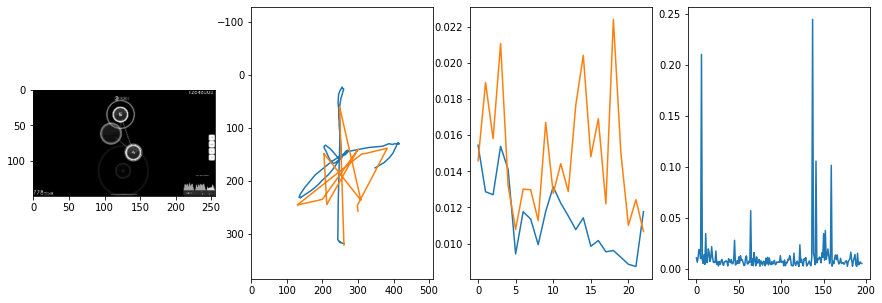


 29 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.51it/s  0.0058                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009842607720721779
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0038                                    
pred: 0.8568070530891418 0.645803689956665
gt: 0.8828125 0.4270833432674408
(184, 67)


<Figure size 1080x360 with 0 Axes>

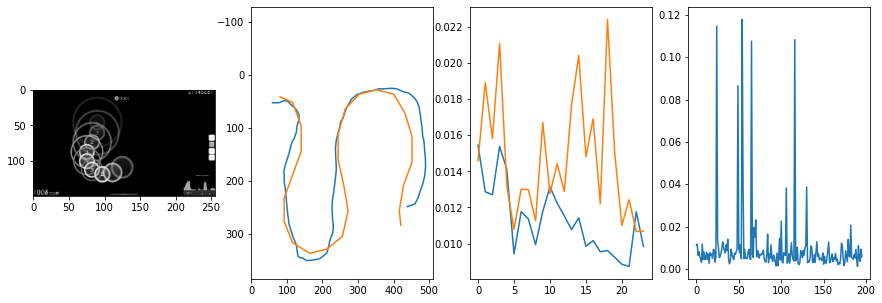


 30 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.55it/s  0.0038                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010337910382671053
outliers: 39
retrain: 8                 
val: 50/50 loss: 0.0051                                    
pred: 0.3492887616157532 0.6180964708328247
gt: 0.2578125 0.6666666865348816
(87, 95)


<Figure size 1080x360 with 0 Axes>

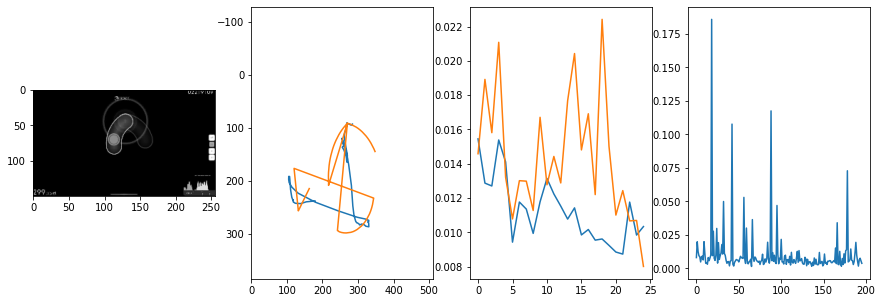


 31 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.63it/s  0.0103                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011146953447047164
outliers: 39
retrain: 8                 
val: 50/50 loss: 0.0081                                    
pred: 0.22246153652668 0.5731639266014099
gt: 0.37572717666625977 0.2405529022216797
(106, 45)


<Figure size 1080x360 with 0 Axes>

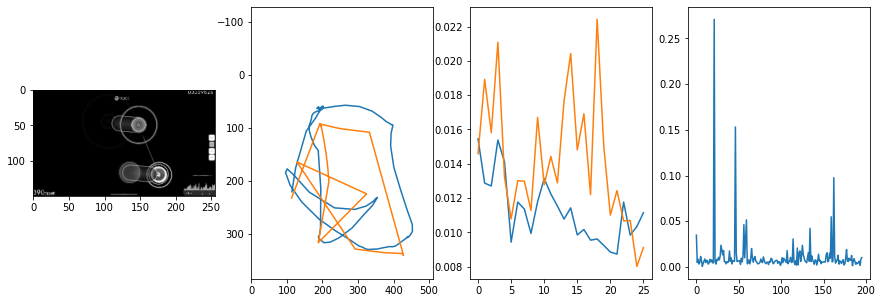


 32 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.63it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010242424598818987
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0049                                    
pred: 0.5118704438209534 0.34151315689086914
gt: 0.5152990221977234 0.6367247700691223
(127, 92)


<Figure size 1080x360 with 0 Axes>

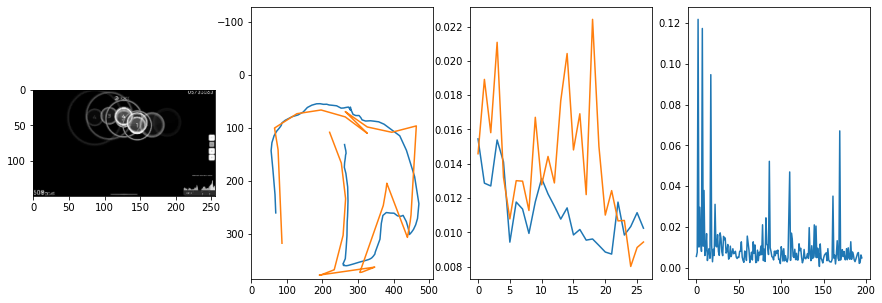


 33 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0028                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009819455564197875
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0207                                    
pred: 0.4067651033401489 0.571088969707489
gt: 0.4873415529727936 0.6182746291160583
(123, 89)


<Figure size 1080x360 with 0 Axes>

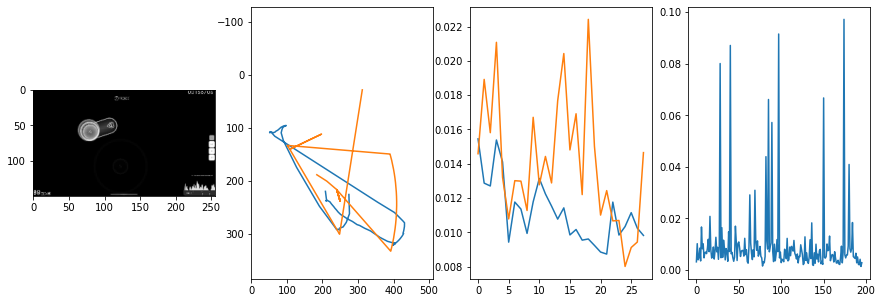


 34 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0096                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012007247953561648
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0169                                    
pred: 0.6538073420524597 0.3871726393699646
gt: 0.5574813485145569 0.3388536870479584
(134, 57)


<Figure size 1080x360 with 0 Axes>

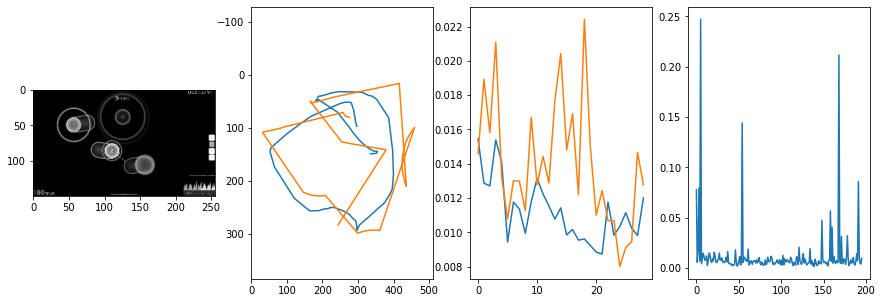


 35 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.78it/s  0.0069                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00976688248563881
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0245                                    
pred: 0.4383980333805084 0.3378954827785492
gt: 0.3841746151447296 0.26071861386299133
(107, 48)


<Figure size 1080x360 with 0 Axes>

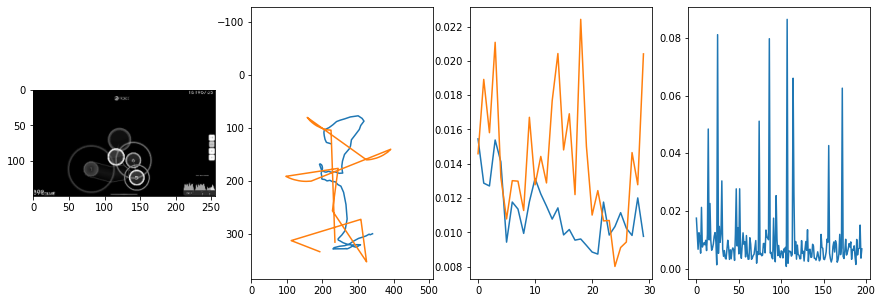


 36 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0075                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.017528607318182572
outliers: 107
retrain: 8                 
val: 50/50 loss: 0.0114                                    
pred: 0.25426778197288513 0.41230520606040955
gt: 0.27734097838401794 0.12240055203437805
(91, 32)


<Figure size 1080x360 with 0 Axes>

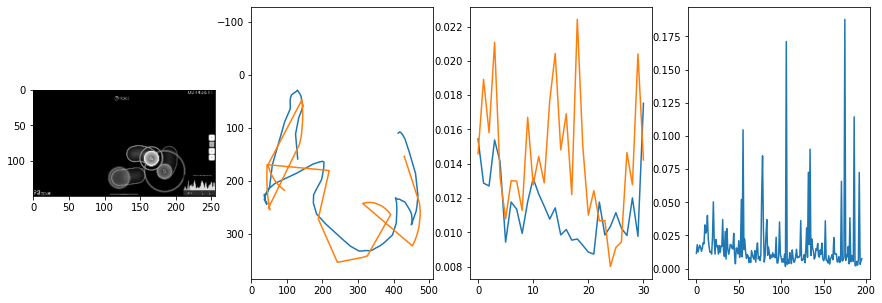


 37 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.78it/s  0.0048                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011279807125493807
outliers: 12
retrain: 8                 
val: 50/50 loss: 0.0162                                    
pred: 0.5966987609863281 0.4551403224468231
gt: 0.6127785444259644 0.7224628329277039
(143, 102)


<Figure size 1080x360 with 0 Axes>

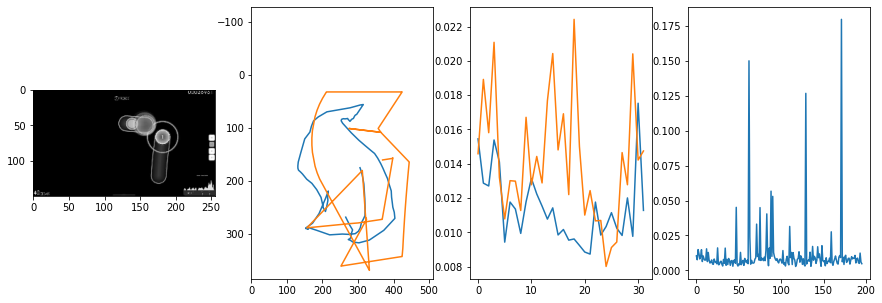


 38 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.77it/s  0.0115                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012890676369092293
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0106                                    
pred: 0.8501372933387756 0.3498750329017639
gt: 0.7419549226760864 0.24345235526561737
(163, 46)


<Figure size 1080x360 with 0 Axes>

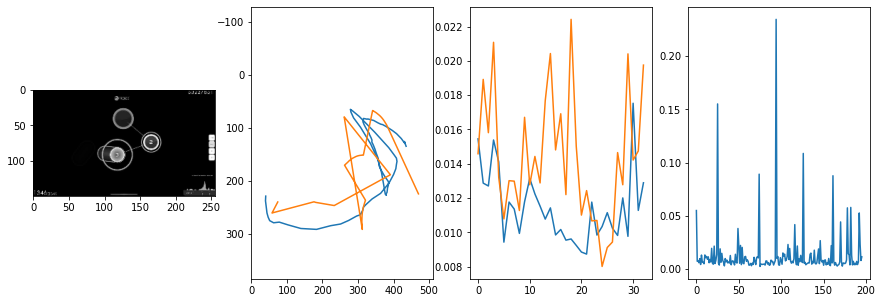


 39 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.78it/s  0.0109                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.013289049640773055
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0175                                    
pred: 0.11033300310373306 0.5711463093757629
gt: 0.1090804859995842 0.8016054630279541
(64, 111)


<Figure size 1080x360 with 0 Axes>

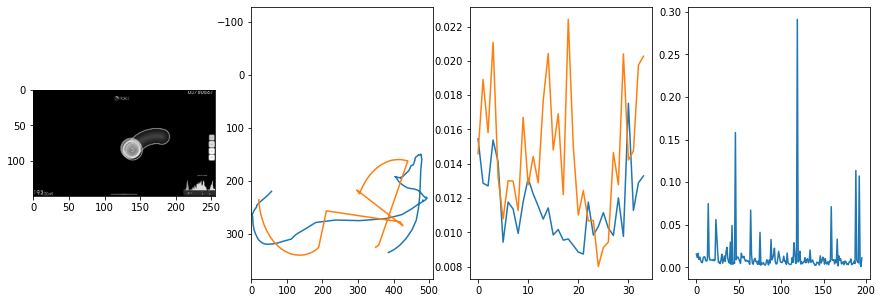


 40 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.71it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011980644562067844
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0228                                    
pred: 0.15526434779167175 0.36077427864074707
gt: 0.19144579768180847 0.22459204494953156
(77, 44)


<Figure size 1080x360 with 0 Axes>

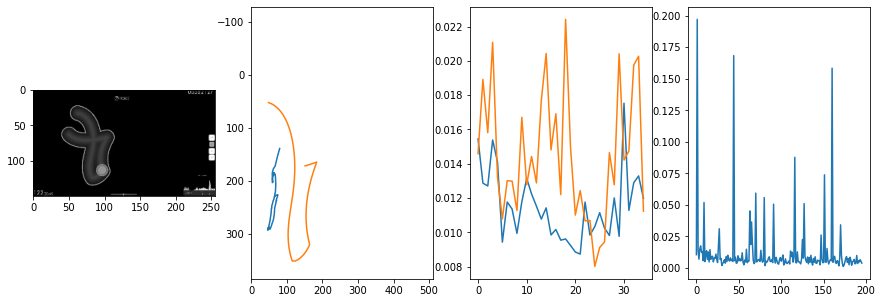


 41 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.74it/s  0.0068                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008287199414145125
outliers: 20
retrain: 8                 
val: 50/50 loss: 0.0040                                    
pred: 0.2891877293586731 0.3715108335018158
gt: 0.3054220378398895 0.11609554290771484
(95, 31)


<Figure size 1080x360 with 0 Axes>

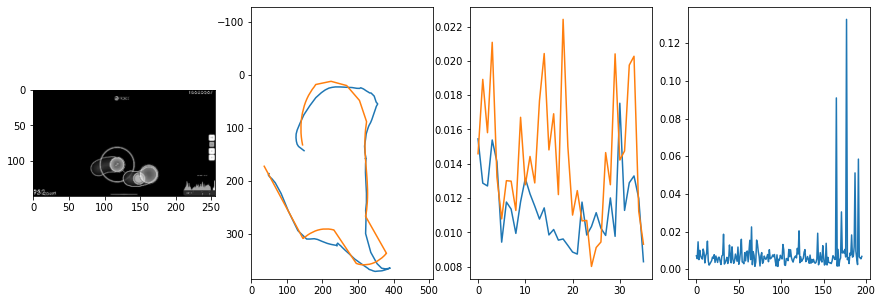


 42 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0052                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0075709023109009985
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0042                                    
pred: 0.26759058237075806 0.6192255616188049
gt: 0.2550707757472992 0.5067610144615173
(87, 76)


<Figure size 1080x360 with 0 Axes>

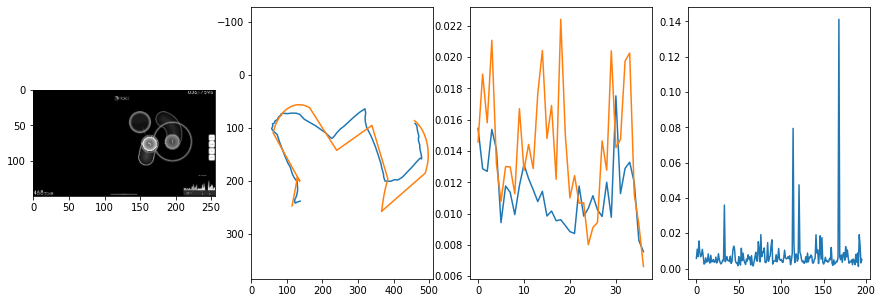


 43 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.75it/s  0.0028                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008820891202123341
outliers: 47
retrain: 8                 
val: 50/50 loss: 0.0048                                    
pred: 0.5754739046096802 0.19092567265033722
gt: 0.599609375 0.041666653007268906
(140, 22)


<Figure size 1080x360 with 0 Axes>

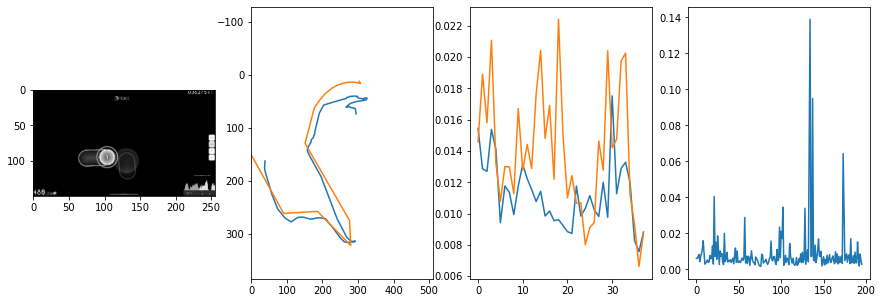


 44 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0066                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009433886966411481
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0087                                    
pred: 0.35356464982032776 0.3719574809074402
gt: 0.3725745379924774 0.48043692111968994
(105, 73)


<Figure size 1080x360 with 0 Axes>

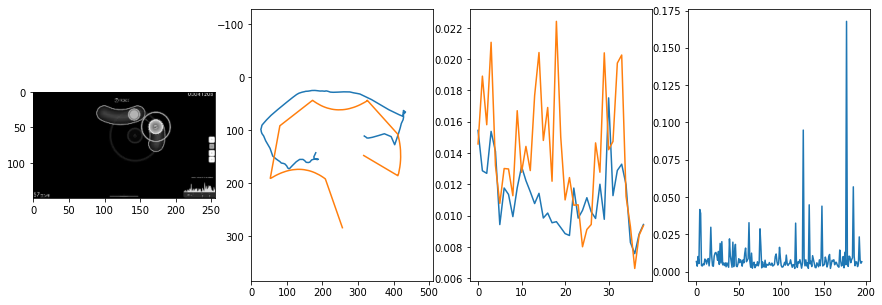


 45 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010342156144787975
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0082                                    
pred: 0.2303856611251831 0.31248360872268677
gt: 0.1328125298023224 0.3020833432674408
(68, 53)


<Figure size 1080x360 with 0 Axes>

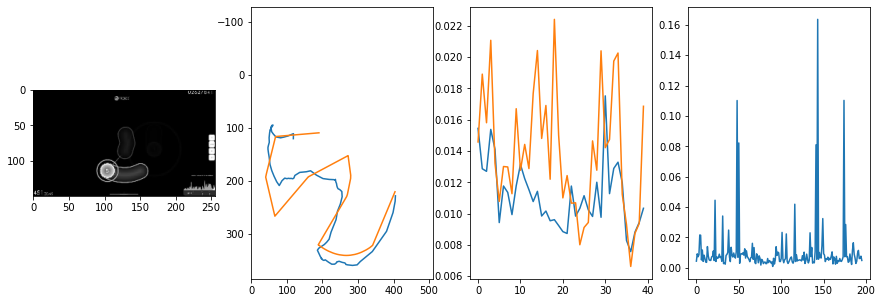


 46 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0041                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009705776319903207
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0119                                    
pred: 0.49162036180496216 0.30164802074432373
gt: 0.5317802429199219 0.1223272979259491
(130, 32)


<Figure size 1080x360 with 0 Axes>

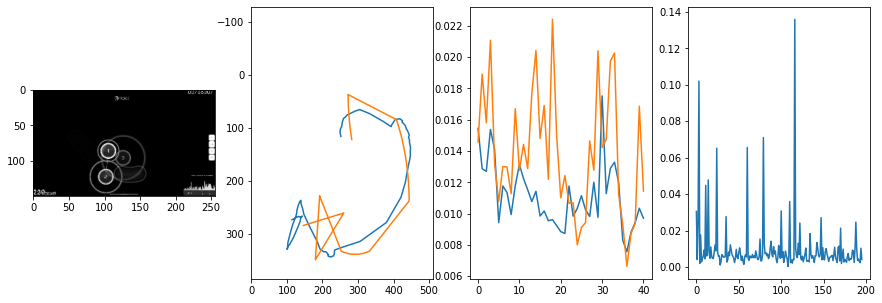


 47 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0029                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009049475665218482
outliers: 25
retrain: 8                 
val: 50/50 loss: 0.1592                                    
pred: 0.39325660467147827 0.4830015003681183
gt: 0.7304638028144836 0.6770767569541931
(161, 96)


<Figure size 1080x360 with 0 Axes>

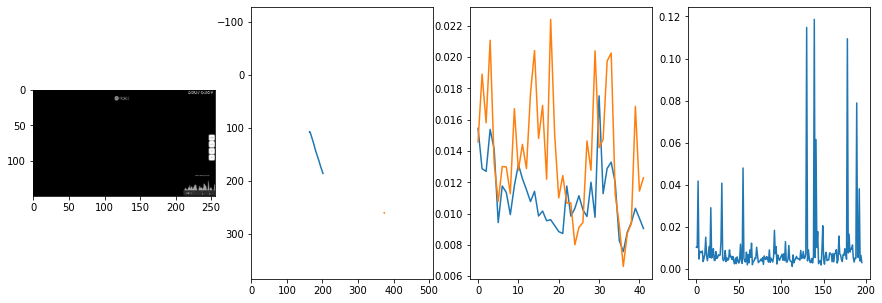


 48 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0066                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00800749355908103
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0028                                    
pred: 0.39860549569129944 0.5958595275878906
gt: 0.3515625 0.5625
(102, 83)


<Figure size 1080x360 with 0 Axes>

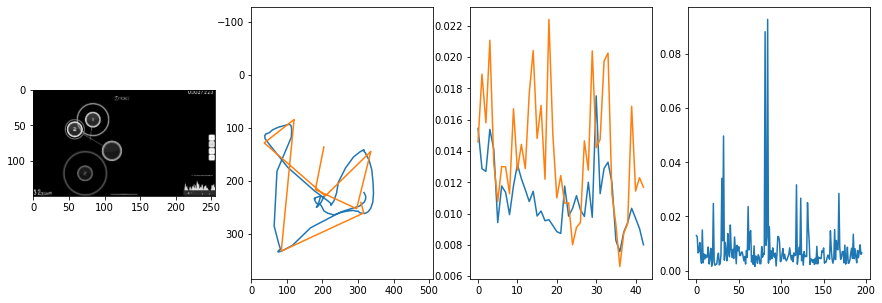


 49 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.73it/s  0.0043                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00798777028816106
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0029                                    
pred: 0.7595545649528503 0.2121955007314682
gt: 0.4790748059749603 0.21683961153030396
(122, 43)


<Figure size 1080x360 with 0 Axes>

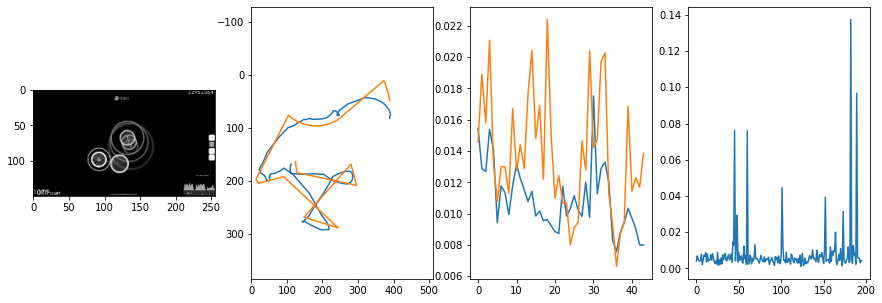


 50 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0105                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011026929108288177
outliers: 49
retrain: 8                 
val: 50/50 loss: 0.0095                                    
pred: 0.46300679445266724 0.3774570822715759
gt: 0.3828125 0.71875
(107, 101)


<Figure size 1080x360 with 0 Axes>

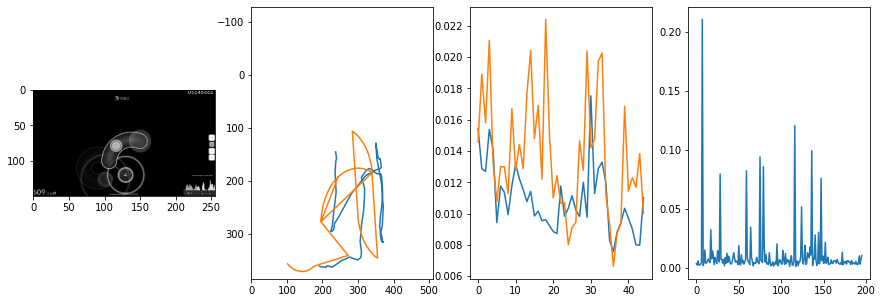


 51 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.68it/s  0.0047                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00791503177428314
outliers: 19
retrain: 8                 
val: 50/50 loss: 0.0075                                    
pred: 0.4740956425666809 0.7349008321762085
gt: 0.31485843658447266 0.8032625317573547
(96, 111)


<Figure size 1080x360 with 0 Axes>

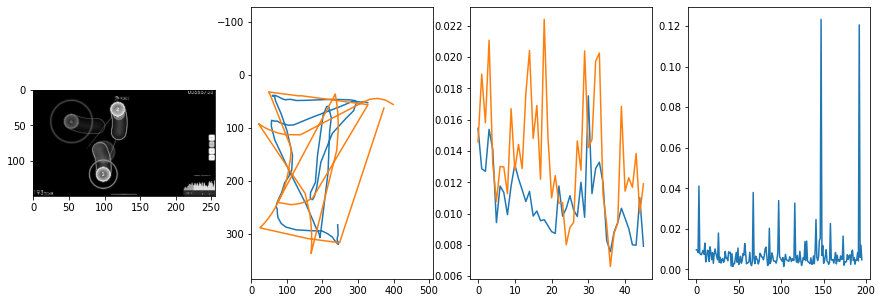


 52 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008030769669412807
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0046                                    
pred: 0.7456866502761841 0.6391583681106567
gt: 0.78125 0.7708333134651184
(169, 107)


<Figure size 1080x360 with 0 Axes>

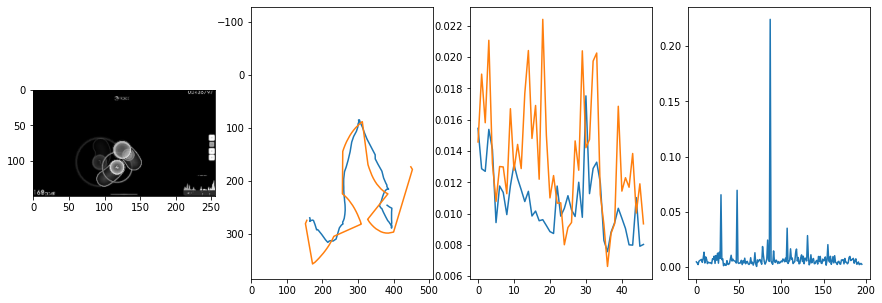


 53 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0072                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008681239910680344
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0109                                    
pred: 0.4087332785129547 0.18073493242263794
gt: 0.11830473691225052 0.2762226164340973
(66, 50)


<Figure size 1080x360 with 0 Axes>

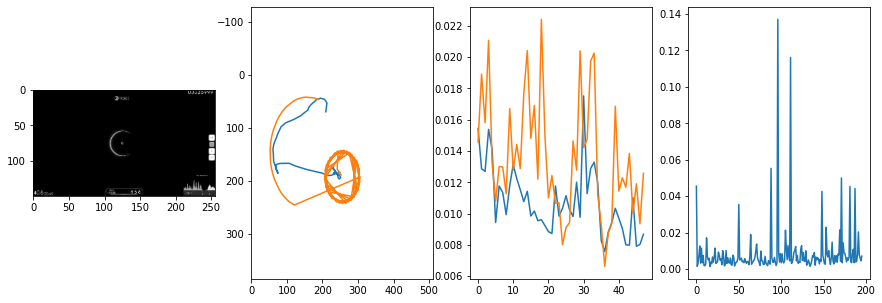


 54 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.84it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008474927202249611
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0075                                    
pred: 0.33122703433036804 0.28522804379463196
gt: 0.37330058217048645 0.35887667536735535
(105, 59)


<Figure size 1080x360 with 0 Axes>

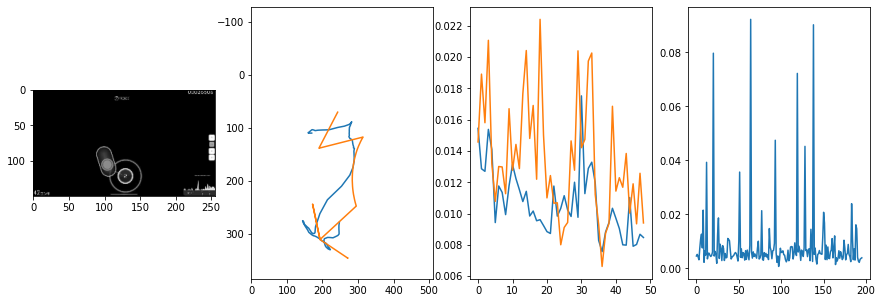


 55 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0114                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009325766201221327
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0111                                    
pred: 0.5491270422935486 0.7879380583763123
gt: 0.6190780997276306 0.8942263722419739
(144, 122)


<Figure size 1080x360 with 0 Axes>

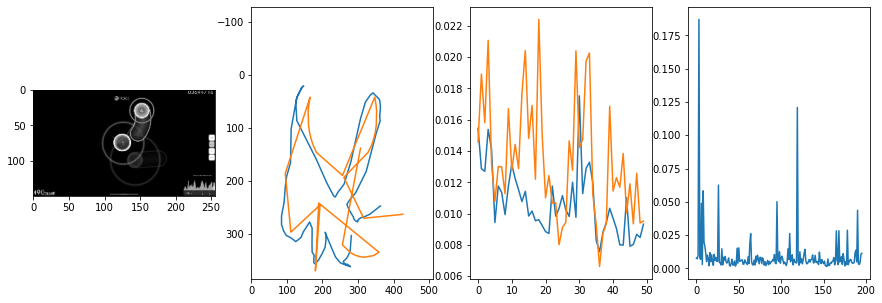


 56 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.77it/s  0.0097                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011006150043650284
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0077                                    
pred: 0.6633286476135254 0.09698966890573502
gt: 0.5546875 0.265625
(134, 48)


<Figure size 1080x360 with 0 Axes>

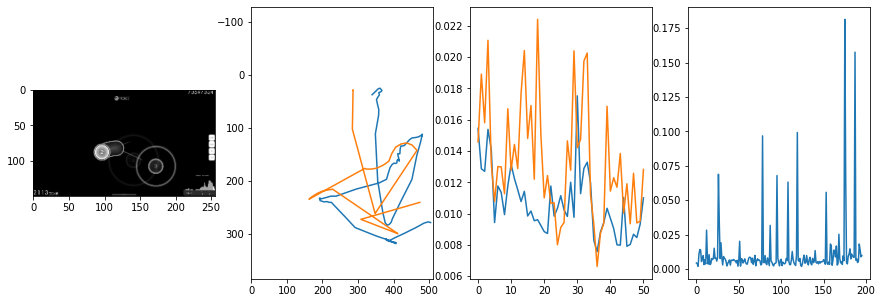


 57 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.76it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007547479795235
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0037                                    
pred: 0.3878878355026245 0.7090390920639038
gt: 0.21289078891277313 0.7864584922790527
(81, 109)


<Figure size 1080x360 with 0 Axes>

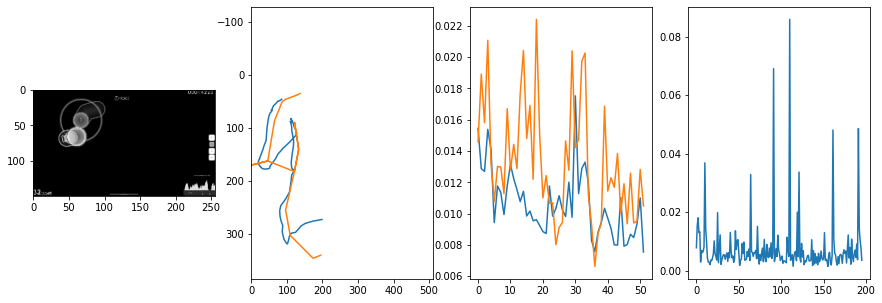


 58 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0053                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008478732584656111
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0086                                    
pred: 0.4582502543926239 0.903846263885498
gt: 0.5214844346046448 0.9114582538604736
(128, 124)


<Figure size 1080x360 with 0 Axes>

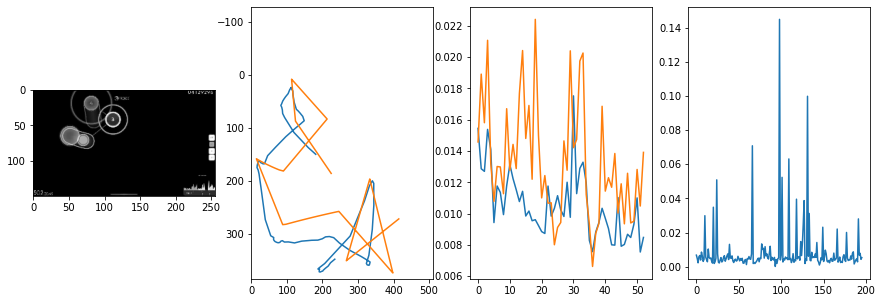


 59 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.76it/s  0.0022                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007731984454392437
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0039                                    
pred: 0.7857851982116699 0.8368862271308899
gt: 0.8865675330162048 0.8826108574867249
(185, 120)


<Figure size 1080x360 with 0 Axes>

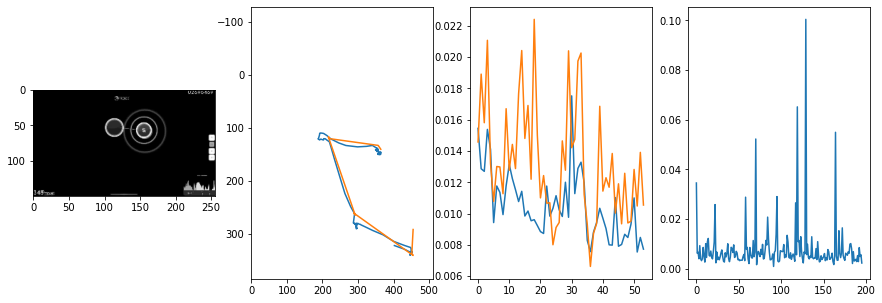


 60 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0025                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007453870218917157
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0114                                    
pred: 0.5850914716720581 0.28276386857032776
gt: 0.5156260132789612 0.36718854308128357
(127, 60)


<Figure size 1080x360 with 0 Axes>

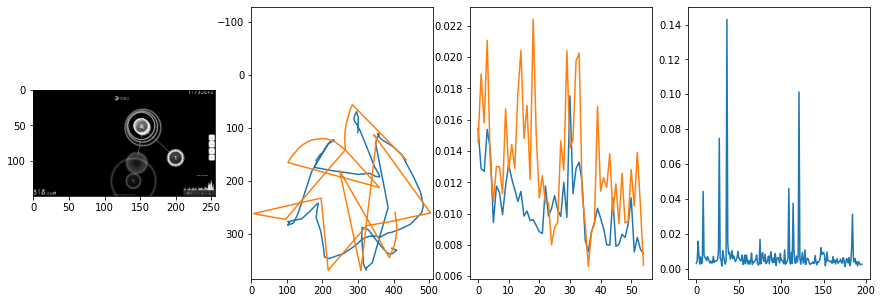


 61 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.71it/s  0.0223                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007051509276403076
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0042                                    
pred: 0.45696040987968445 0.7848734855651855
gt: 0.6328117847442627 0.5208342671394348
(146, 78)


<Figure size 1080x360 with 0 Axes>

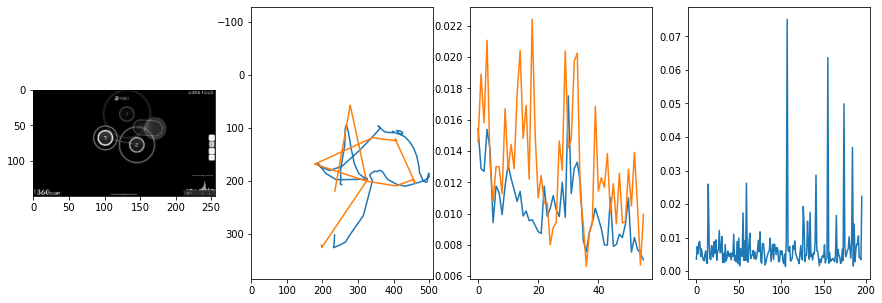


 62 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.74it/s  0.0034                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009323010059122271
outliers: 48
retrain: 8                 
val: 50/50 loss: 0.0640                                    
pred: 0.19785761833190918 0.28353628516197205
gt: 0.1953125 0.3046875
(78, 53)


<Figure size 1080x360 with 0 Axes>

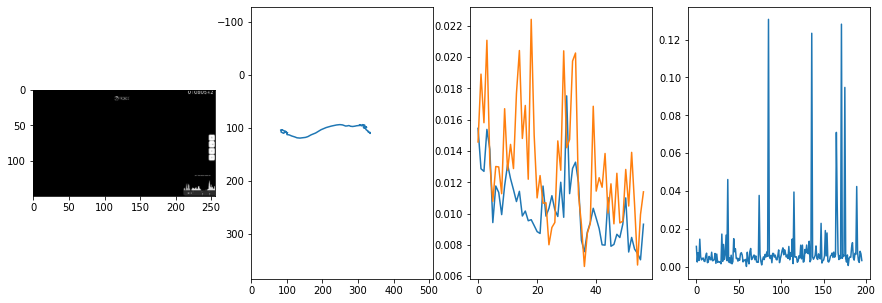


 63 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0073                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010752734737066855
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0055                                    
pred: 0.3748760223388672 0.5235401391983032
gt: 0.5 0.5
(125, 76)


<Figure size 1080x360 with 0 Axes>

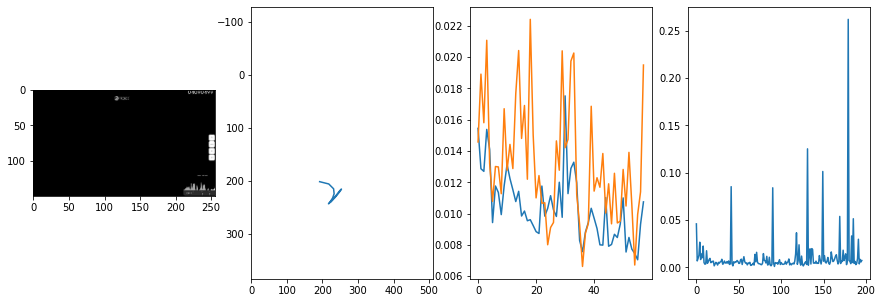


 64 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.87it/s  0.0053                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010056057916383962
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0151                                    
pred: 0.698604166507721 0.7278045415878296
gt: 0.4857499897480011 0.48099997639656067
(123, 73)


<Figure size 1080x360 with 0 Axes>

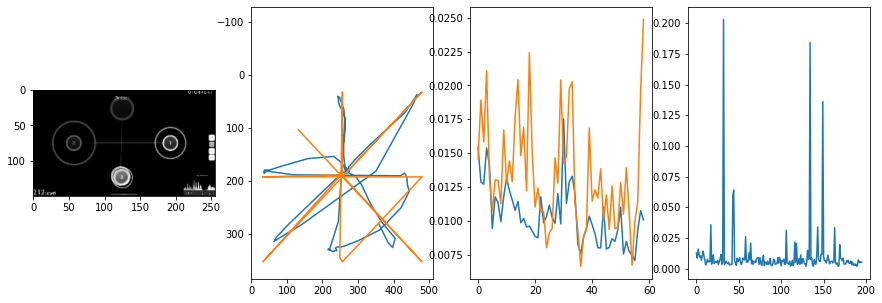


 65 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0048                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009328409101652476
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.7405213713645935 0.1945674568414688
gt: 0.9045314192771912 0.22682298719882965
(188, 44)


<Figure size 1080x360 with 0 Axes>

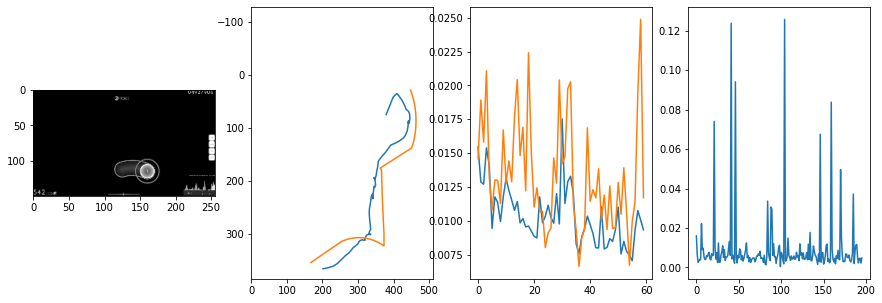


 66 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0031                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009226105444974323
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0098                                    
pred: 0.45515310764312744 0.6031650900840759
gt: 0.27539119124412537 0.7343747615814209
(90, 103)


<Figure size 1080x360 with 0 Axes>

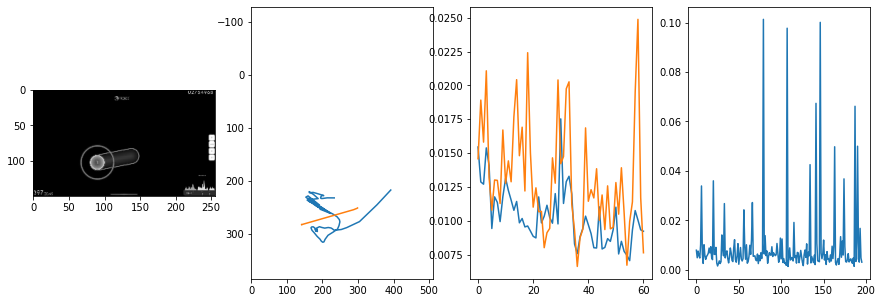


 67 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0070                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011113514574315893
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0068                                    
pred: 0.8366702198982239 0.3639160394668579
gt: 0.730751633644104 0.4370478391647339
(161, 68)


<Figure size 1080x360 with 0 Axes>

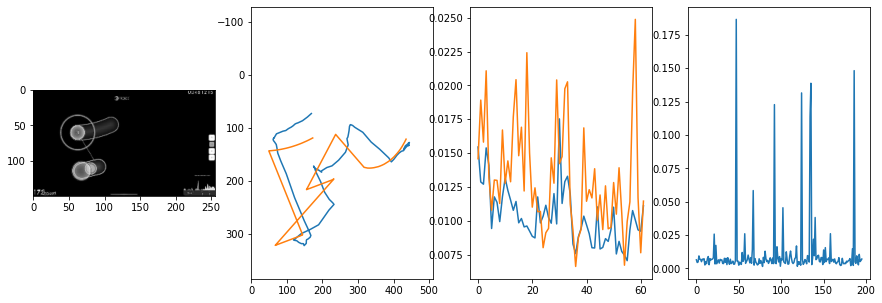


 68 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008263644417842888
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0036                                    
pred: 0.7880314588546753 0.3822501003742218
gt: 0.5214856266975403 0.283854216337204
(128, 51)


<Figure size 1080x360 with 0 Axes>

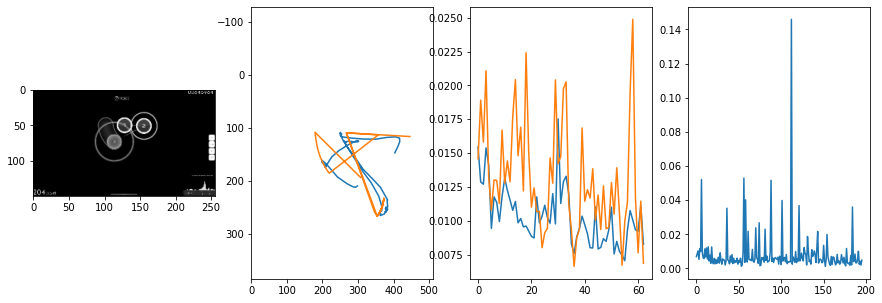


 69 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.78it/s  0.0050                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00940090261265512
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0224                                    
pred: 0.1607990562915802 0.4834848940372467
gt: 0.18359375 0.4921875
(76, 75)


<Figure size 1080x360 with 0 Axes>

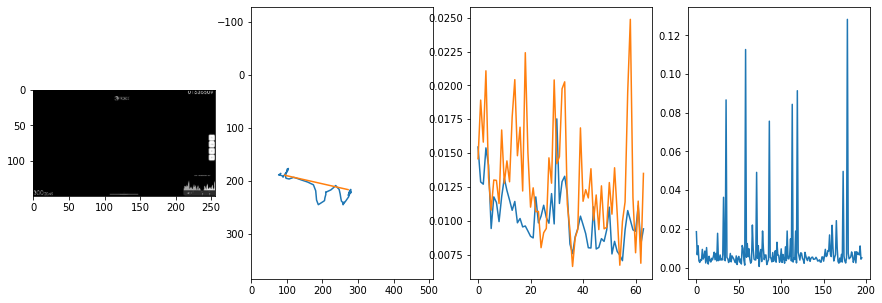


 70 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007944452541295857
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0102                                    
pred: 0.5087417364120483 0.29147985577583313
gt: 0.7480360269546509 0.8775909543037415
(164, 120)


<Figure size 1080x360 with 0 Axes>

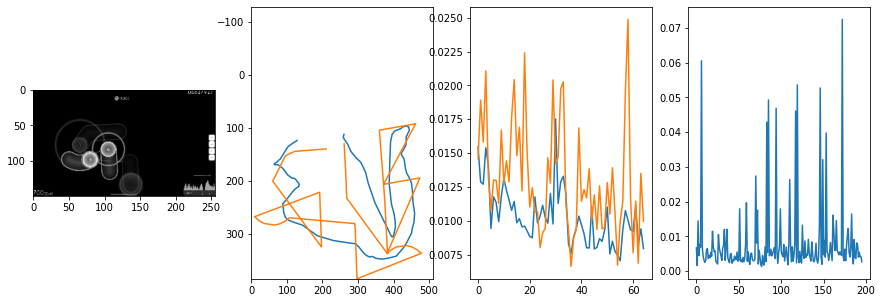


 71 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0059                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009861440541536301
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0121                                    
pred: 0.7655404210090637 0.5870462656021118
gt: 0.6614671349525452 0.8157631754875183
(150, 112)


<Figure size 1080x360 with 0 Axes>

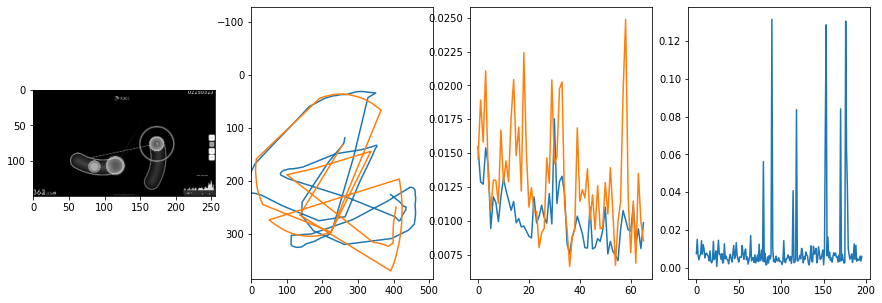


 72 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.77it/s  0.0038                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008023958823082931
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0047                                    
pred: 0.6877526640892029 0.5469315648078918
gt: 0.8493140935897827 0.661726176738739
(179, 94)


<Figure size 1080x360 with 0 Axes>

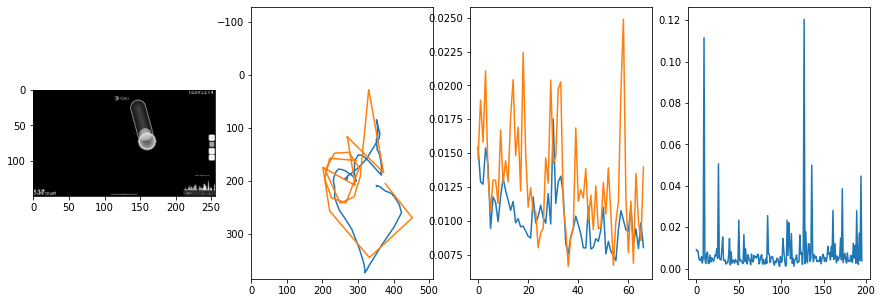


 73 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0032                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008465148676341228
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0054                                    
pred: 0.17395883798599243 0.34196051955223083
gt: 0.14258576929569244 0.3281180262565613
(70, 56)


<Figure size 1080x360 with 0 Axes>

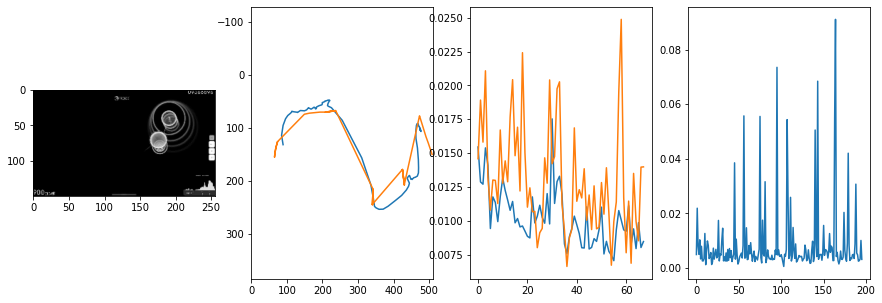


 74 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0034                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010854703152364557
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0060                                    
pred: 0.31103238463401794 0.25741198658943176
gt: 0.4218906760215759 0.5937433242797852
(113, 87)


<Figure size 1080x360 with 0 Axes>

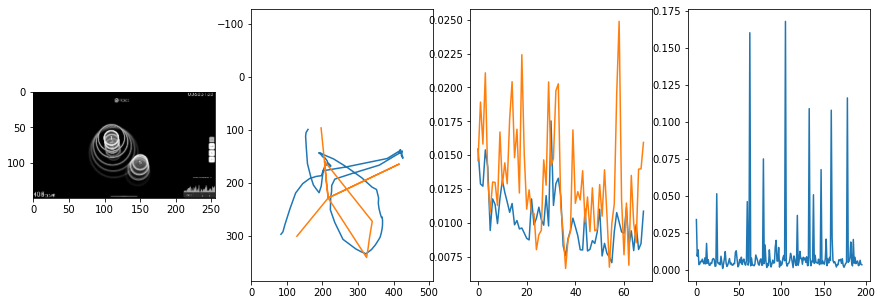


 75 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0031                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008745707459842824
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0069                                    
pred: 0.8253158926963806 0.2955745458602905
gt: 0.7968905568122864 0.9292839169502258
(171, 126)


<Figure size 1080x360 with 0 Axes>

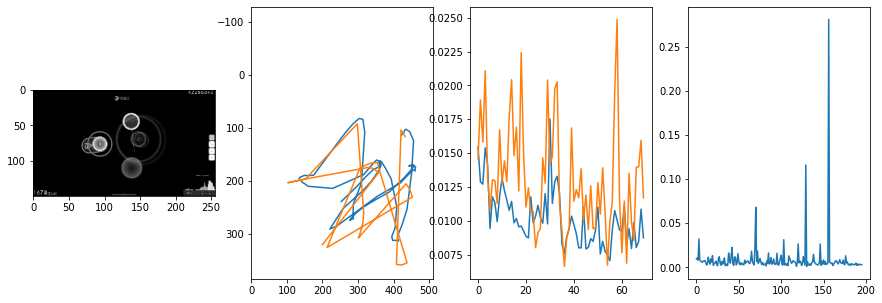


 76 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.87it/s  0.0053                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007843829440166794
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0061                                    
pred: 0.518071174621582 0.22094117105007172
gt: 0.48607876896858215 0.46198368072509766
(123, 71)


<Figure size 1080x360 with 0 Axes>

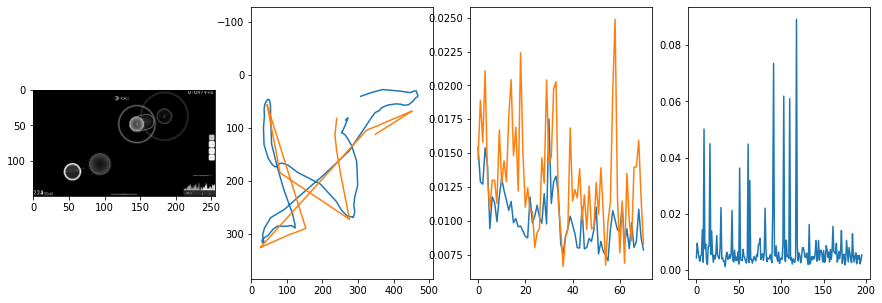


 77 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0057                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0066139142062248924
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0080                                    
pred: 0.8367400169372559 0.8223458528518677
gt: 0.7226608991622925 0.8515610098838806
(160, 117)


<Figure size 1080x360 with 0 Axes>

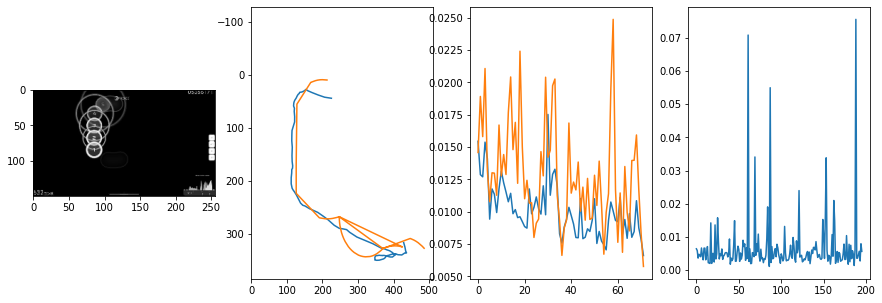


 78 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0074                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008245326661176942
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0029                                    
pred: 0.5481470227241516 0.13383741676807404
gt: 0.5898460149765015 0.14583416283130646
(139, 34)


<Figure size 1080x360 with 0 Axes>

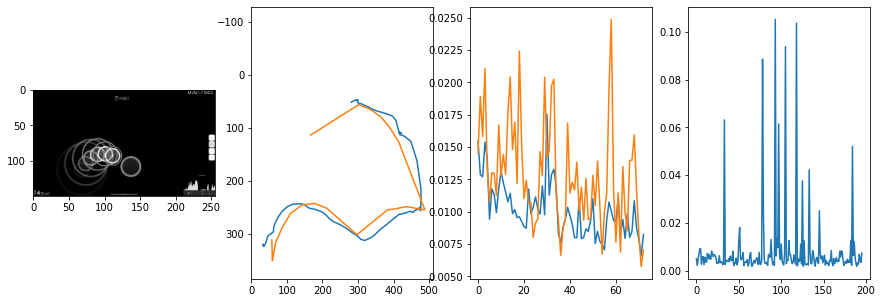


 79 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0038                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006136063169165306
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0052                                    
pred: 0.8055264949798584 0.3336637020111084
gt: 0.689453125 0.8176739811897278
(154, 113)


<Figure size 1080x360 with 0 Axes>

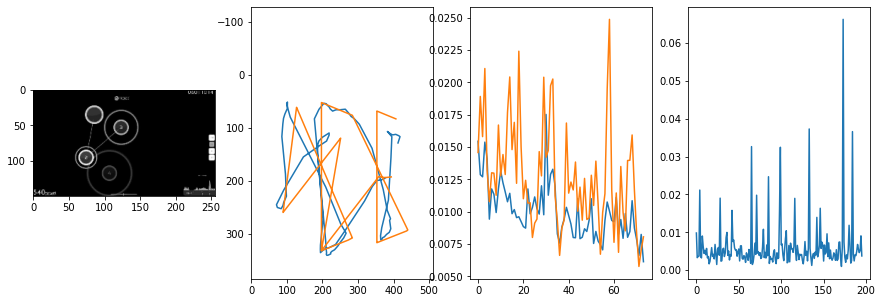


 80 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0047                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006845379489407476
outliers: 58
retrain: 8                 
val: 50/50 loss: 0.0060                                    
pred: 0.8717009425163269 0.46480467915534973
gt: 0.8721619248390198 0.1859227418899536
(183, 39)


<Figure size 1080x360 with 0 Axes>

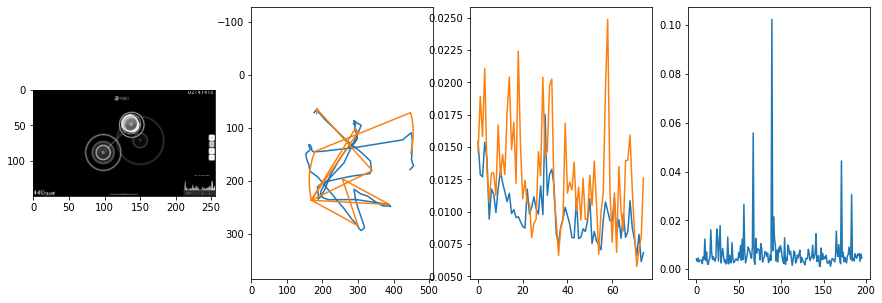


 81 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.87it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007519281498389319
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0077                                    
pred: 0.11775779724121094 0.4361494481563568
gt: 0.15001870691776276 0.23917819559574127
(71, 45)


<Figure size 1080x360 with 0 Axes>

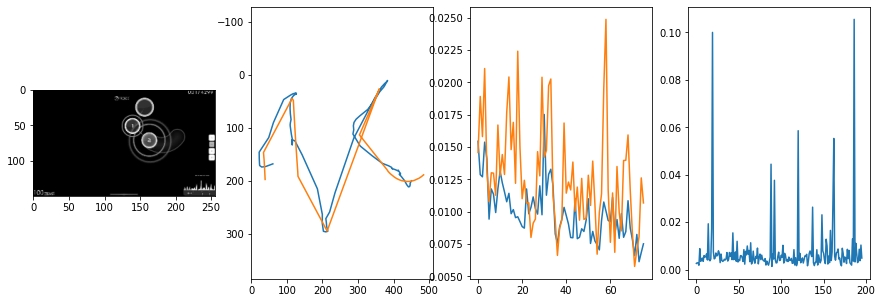


 82 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.89it/s  0.0043                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007387250466438543
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0054                                    
pred: 0.5114114880561829 0.2805476784706116
gt: 0.5 0.9166666865348816
(125, 124)


<Figure size 1080x360 with 0 Axes>

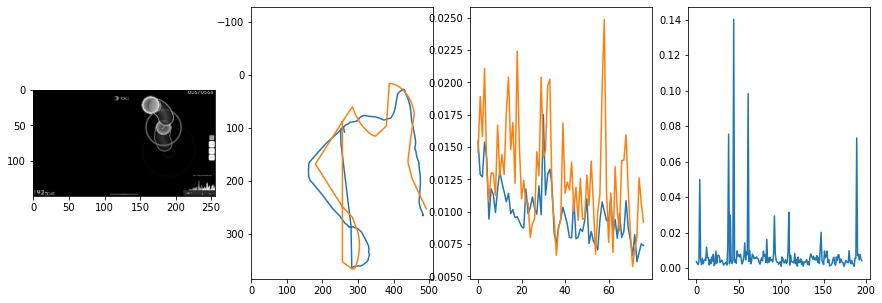


 83 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0044                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00737136993580973
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0102                                    
pred: 0.3905063569545746 0.29972317814826965
gt: 0.8626798987388611 0.865101158618927
(181, 118)


<Figure size 1080x360 with 0 Axes>

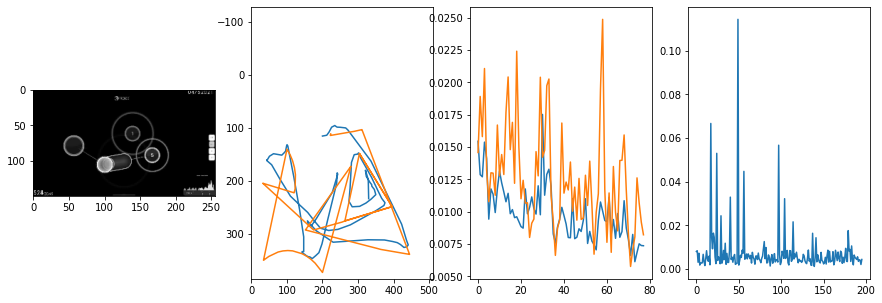


 84 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0013                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006464345056661025
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0088                                    
pred: 0.3042789101600647 0.9214215874671936
gt: 0.38281211256980896 0.6718767285346985
(107, 96)


<Figure size 1080x360 with 0 Axes>

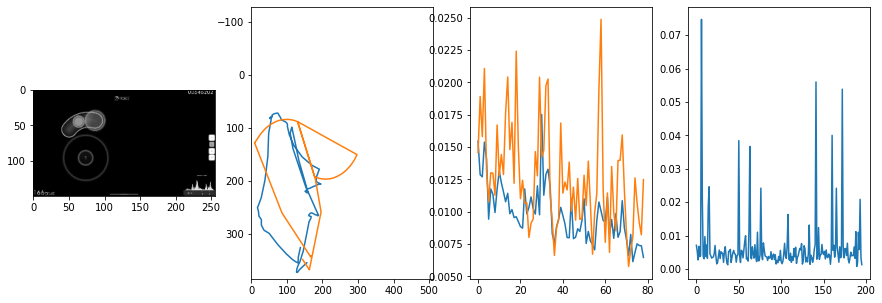


 85 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0517                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0062080167307594445
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0027                                    
pred: 0.2889329493045807 0.4290158450603485
gt: 0.37890625 0.3125
(106, 54)


<Figure size 1080x360 with 0 Axes>

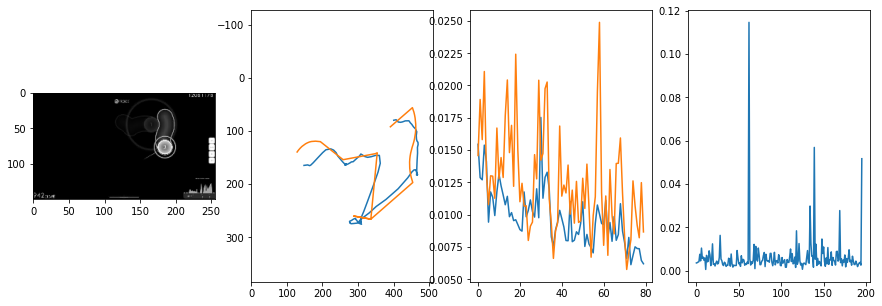


 86 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0023                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006467036449864782
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0065                                    
pred: 0.4573366343975067 0.36387524008750916
gt: 0.294921875 0.6145833134651184
(93, 89)


<Figure size 1080x360 with 0 Axes>

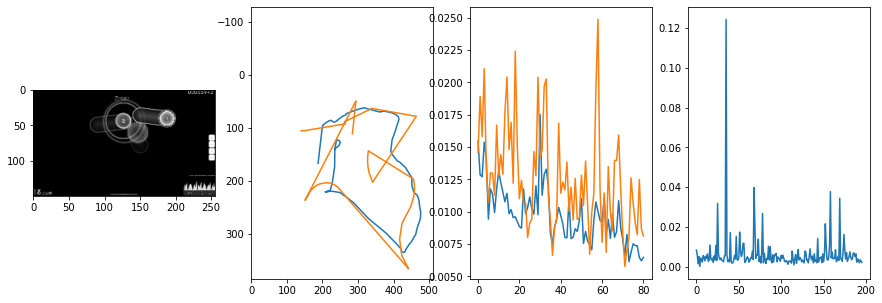


 87 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.76it/s  0.0066                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009272555884197163
outliers: 62
retrain: 8                 
val: 50/50 loss: 0.0056                                    
pred: 0.6774773001670837 0.40036484599113464
gt: 0.5548589825630188 0.47211167216300964
(134, 72)


<Figure size 1080x360 with 0 Axes>

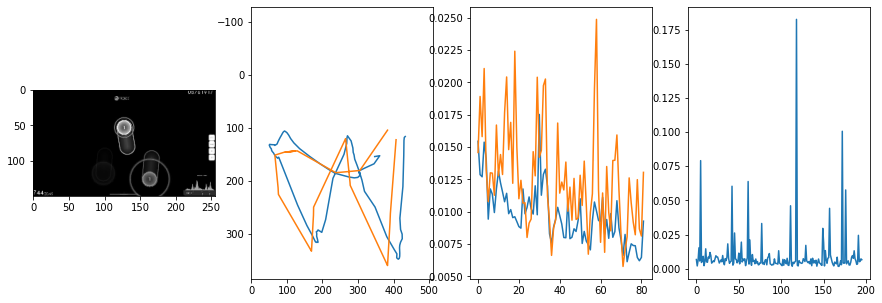


 88 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.40it/s  0.0141                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009523273489915537
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.5151403546333313 0.6650683283805847
gt: 0.484000027179718 0.6661666035652161
(123, 95)


<Figure size 1080x360 with 0 Axes>

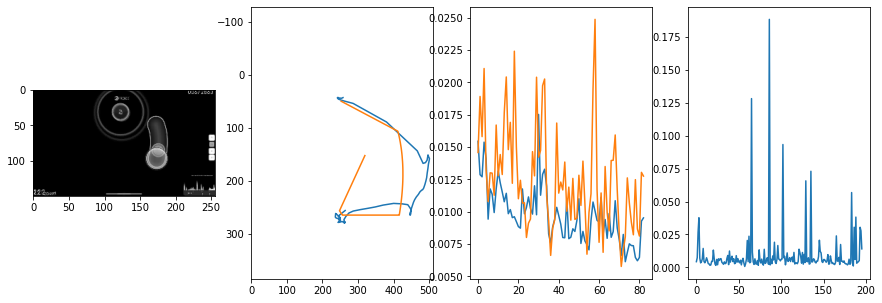


 89 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.45it/s  0.0006                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007018780237781264
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0078                                    
pred: 0.6510258316993713 0.7640299797058105
gt: 0.501953125 0.78125
(125, 108)


<Figure size 1080x360 with 0 Axes>

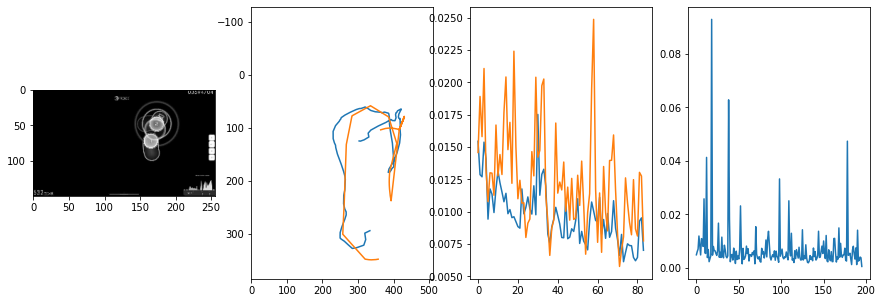


 90 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.74it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00815949768507473
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0025                                    
pred: 0.7821165919303894 0.5370359420776367
gt: 0.78125 0.6041666865348816
(169, 88)


<Figure size 1080x360 with 0 Axes>

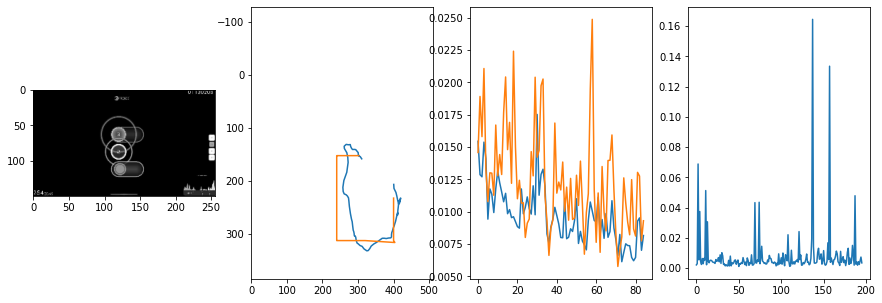


 91 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0090                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006938028993763324
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0044                                    
pred: 0.7030373215675354 0.5780273079872131
gt: 0.6868541836738586 0.5990017652511597
(154, 87)


<Figure size 1080x360 with 0 Axes>

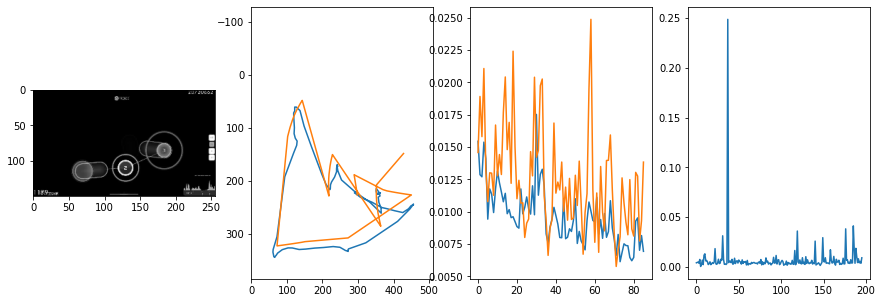


 92 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0034                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007007026972429713
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0082                                    
pred: 0.5037683844566345 0.5669543743133545
gt: 0.7982232570648193 0.9497203826904297
(171, 128)


<Figure size 1080x360 with 0 Axes>

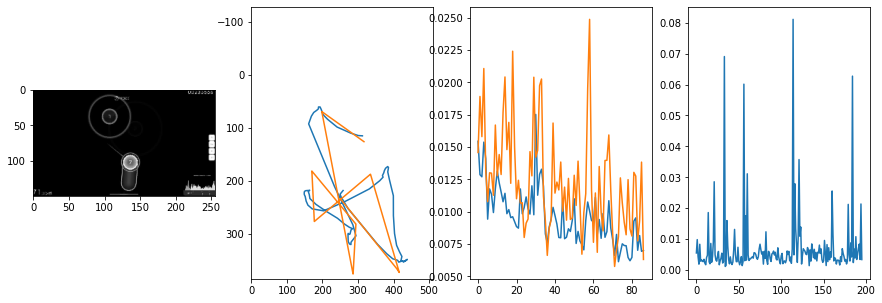


 93 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.78it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0061540942991328215
outliers: 28
retrain: 8                 
val: 50/50 loss: 0.0059                                    
pred: 0.587992787361145 0.6980506181716919
gt: 0.5824618935585022 0.7011343836784363
(138, 99)


<Figure size 1080x360 with 0 Axes>

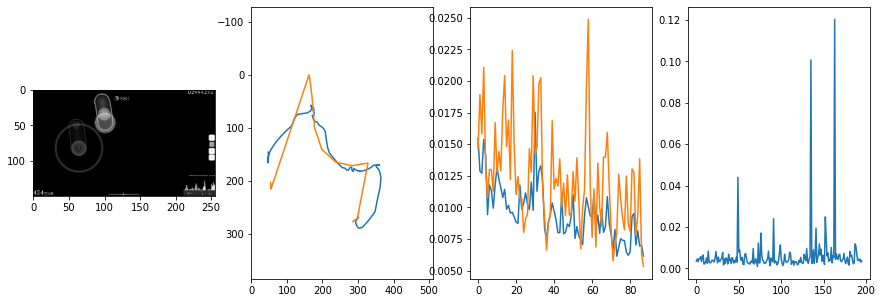


 94 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.77it/s  0.0029                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009984025757816829
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0054                                    
pred: 0.46231767535209656 0.5496280789375305
gt: 0.4216078817844391 0.577647864818573
(113, 85)


<Figure size 1080x360 with 0 Axes>

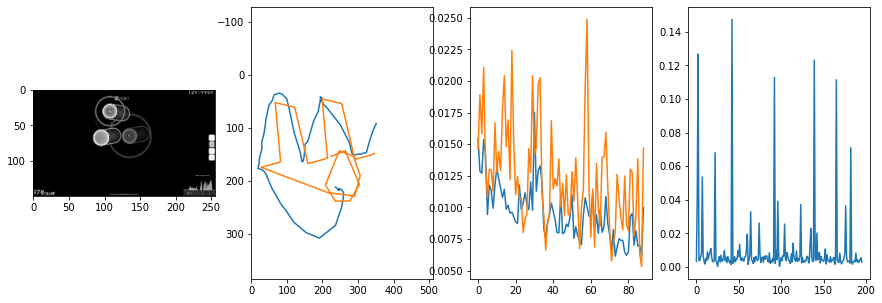


 95 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.71it/s  0.0031                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0067528322011194365
outliers: 17
retrain: 8                 
val: 50/50 loss: 0.0076                                    
pred: 0.8482813835144043 0.49664366245269775
gt: 0.841796875 0.6171875
(178, 89)


<Figure size 1080x360 with 0 Axes>

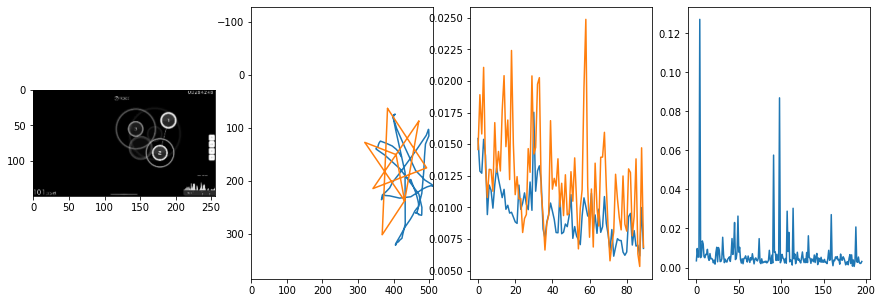


 96 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.75it/s  0.0023                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007550957401393561
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0044                                    
pred: 0.8642157912254333 0.541239857673645
gt: 0.9863884449005127 0.7088518738746643
(200, 100)


<Figure size 1080x360 with 0 Axes>

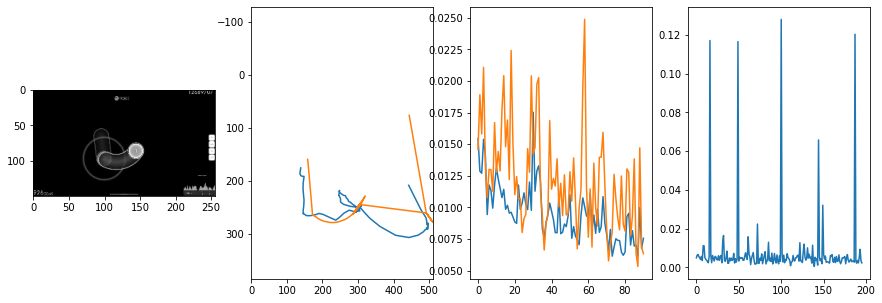


 97 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.74it/s  0.0016                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007681477995623825
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0073                                    
pred: 0.9666738510131836 0.3092632293701172
gt: 0.7717625498771667 0.3739441931247711
(167, 61)


<Figure size 1080x360 with 0 Axes>

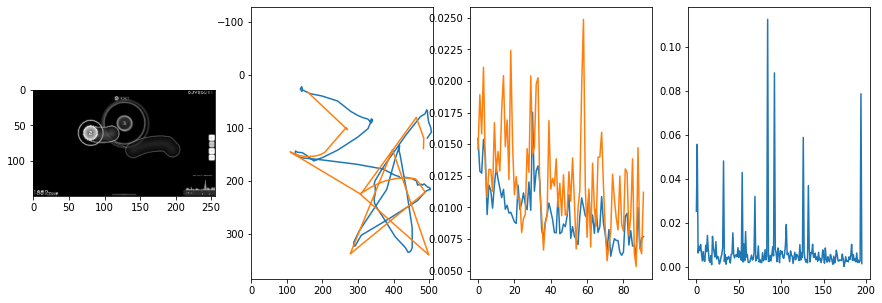


 98 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0026                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007887831058148866
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0021                                    
pred: 0.8580852746963501 0.1991254687309265
gt: 0.9236487150192261 0.26317498087882996
(191, 48)


<Figure size 1080x360 with 0 Axes>

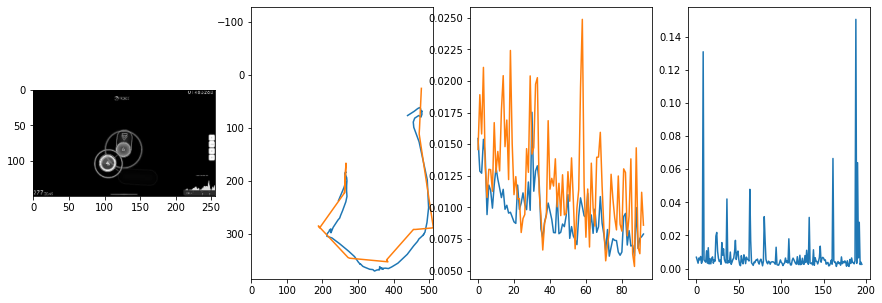


 99 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0018                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0067413482569723526
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0033                                    
pred: 0.7139309644699097 0.2939092516899109
gt: 0.5355705618858337 0.14369286596775055
(131, 34)


<Figure size 1080x360 with 0 Axes>

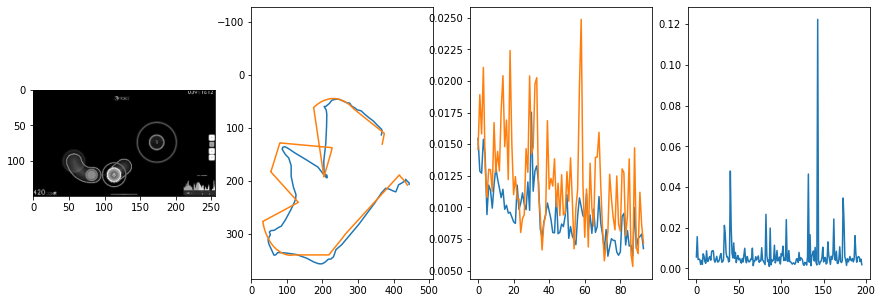


 100 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0041                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007788689987025965
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0052                                    
pred: 0.6219295859336853 0.6005448698997498
gt: 0.6542968153953552 0.2916668951511383
(149, 51)


<Figure size 1080x360 with 0 Axes>

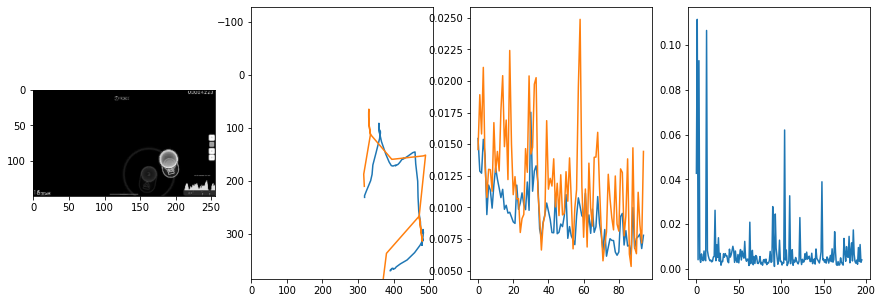


 101 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0021                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00802717883940501
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0099                                    
pred: 0.5255953669548035 0.5675539970397949
gt: 0.5885448455810547 0.5549190640449524
(139, 82)


<Figure size 1080x360 with 0 Axes>

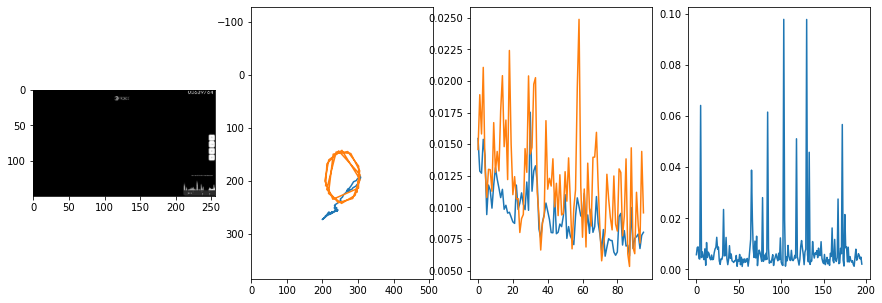


 102 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.76it/s  0.0120                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006432428847040924
outliers: 25
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.5083276033401489 0.5179421901702881
gt: 0.5 0.34708333015441895
(125, 58)


<Figure size 1080x360 with 0 Axes>

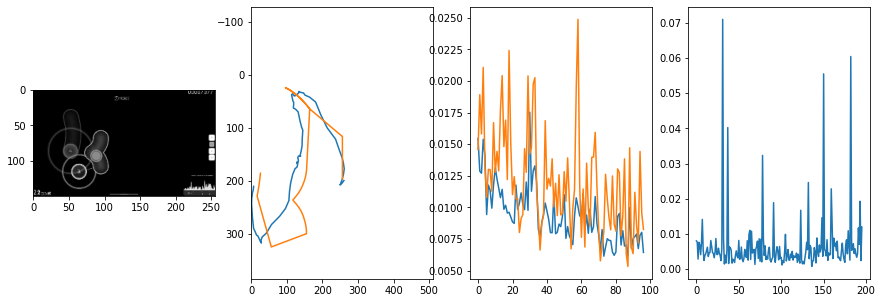


 103 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0019                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0059126390884297764
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0025                                    
pred: 0.5124348402023315 0.7459939122200012
gt: 0.6132059693336487 0.7446913123130798
(143, 104)


<Figure size 1080x360 with 0 Axes>

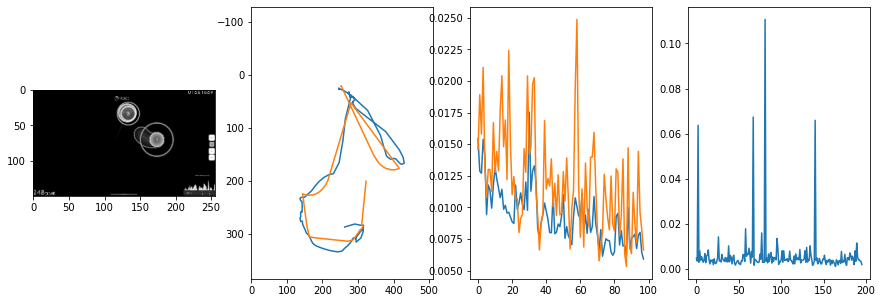


 104 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.75it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006198128661003002
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0041                                    
pred: 0.3056499660015106 0.24801982939243317
gt: 0.5156248211860657 0.48958322405815125
(127, 74)


<Figure size 1080x360 with 0 Axes>

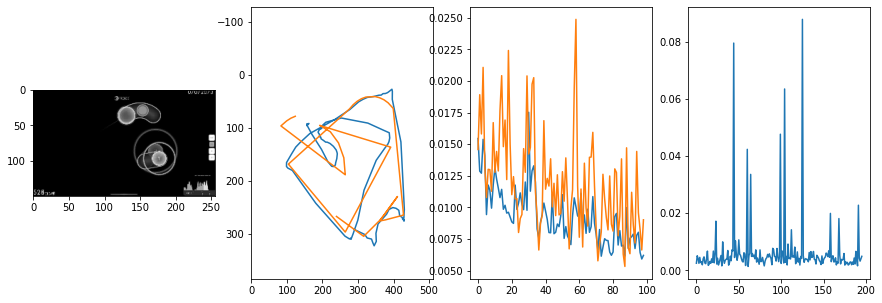


 105 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0028                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005379352493037004
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0088                                    
pred: 0.44403544068336487 0.22458356618881226
gt: 0.6306927800178528 0.5984093546867371
(145, 87)


<Figure size 1080x360 with 0 Axes>

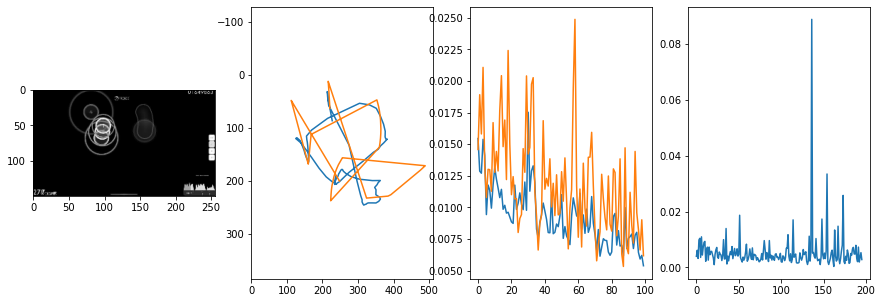


 106 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0044                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007945603161232963
outliers: 52
retrain: 8                 
val: 50/50 loss: 0.0116                                    
pred: 0.4331677258014679 0.5992262959480286
gt: 0.4035998582839966 0.3733069598674774
(110, 61)


<Figure size 1080x360 with 0 Axes>

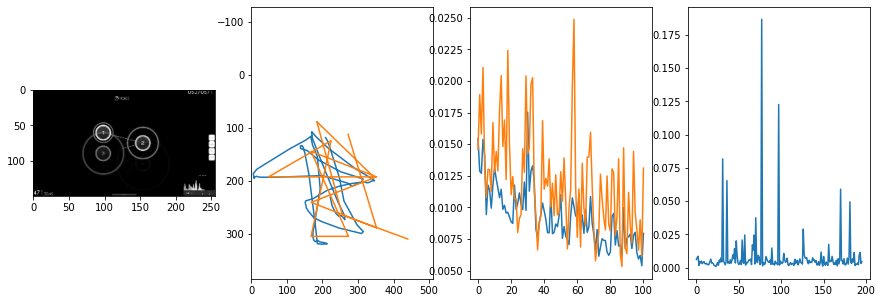


 107 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0075                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007324694358560789
outliers: 28
retrain: 8                 
val: 50/50 loss: 0.0075                                    
pred: 0.3368037939071655 0.4047854244709015
gt: 0.4374409019947052 0.25014448165893555
(115, 47)


<Figure size 1080x360 with 0 Axes>

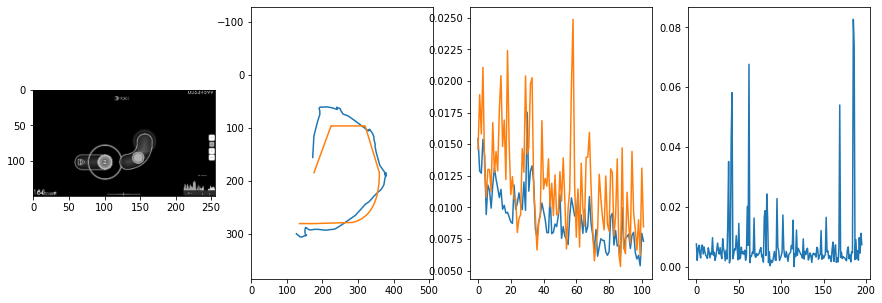


 108 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0024                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007832674261797885
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0058                                    
pred: 0.6517671942710876 0.5207324028015137
gt: 0.5309231877326965 0.7755751013755798
(130, 108)


<Figure size 1080x360 with 0 Axes>

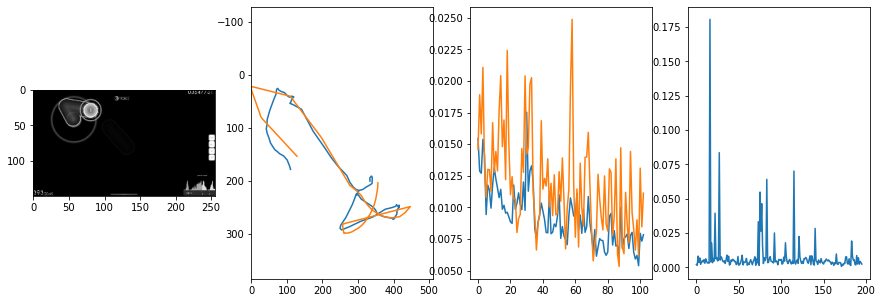


 109 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0262                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007330369285357717
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0058                                    
pred: 0.5707594752311707 0.46664518117904663
gt: 0.3984278738498688 0.4078717529773712
(109, 65)


<Figure size 1080x360 with 0 Axes>

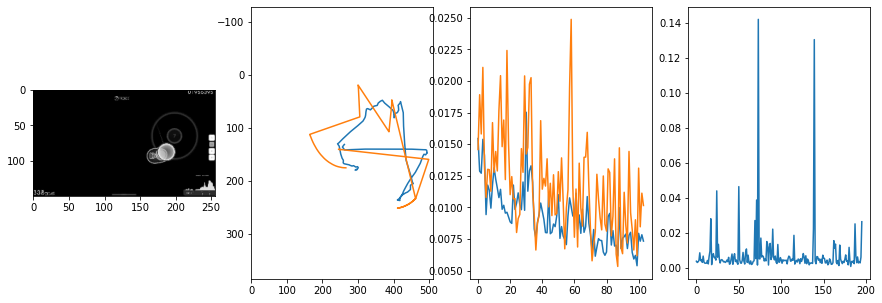


 110 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.84it/s  0.0071                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006286393067614194
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0048                                    
pred: 0.21814867854118347 0.5404778718948364
gt: 0.2890625298023224 0.5520833730697632
(92, 82)


<Figure size 1080x360 with 0 Axes>

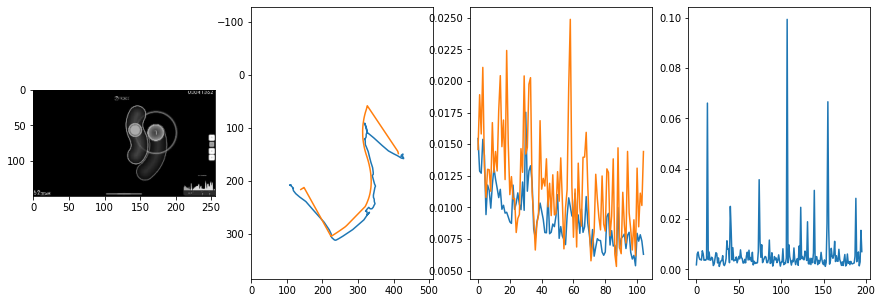


 111 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0216                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008975119403936443
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0179                                    
pred: 0.7376704812049866 0.5113446712493896
gt: 0.5936806201934814 0.4654606580734253
(140, 72)


<Figure size 1080x360 with 0 Axes>

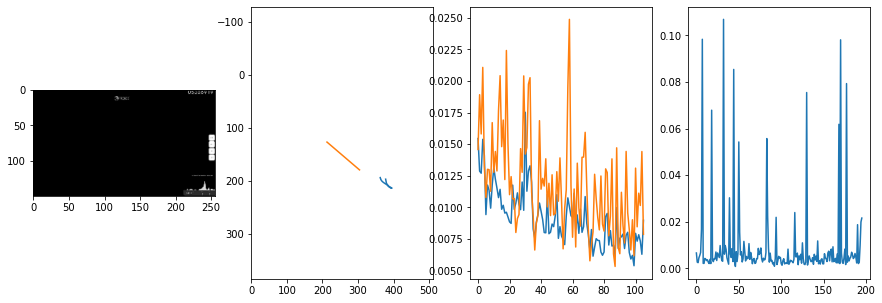


 112 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0046                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008623196059191714
outliers: 20
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.5116389989852905 0.6788200736045837
gt: 0.5487648844718933 0.809876024723053
(133, 112)


<Figure size 1080x360 with 0 Axes>

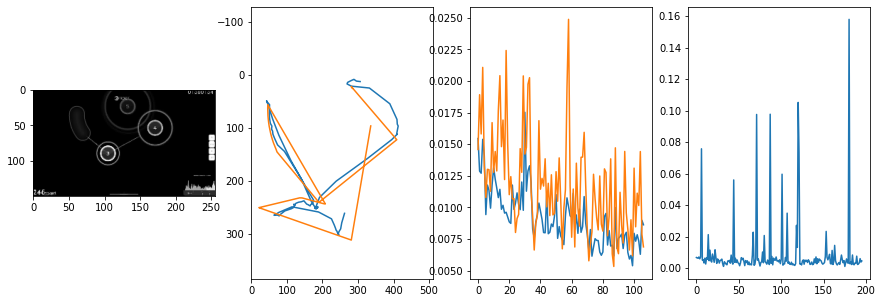


 113 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.89it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008280604616833888
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0081                                    
pred: 0.5902472138404846 0.2677678167819977
gt: 0.5308429002761841 0.6105032563209534
(130, 89)


<Figure size 1080x360 with 0 Axes>

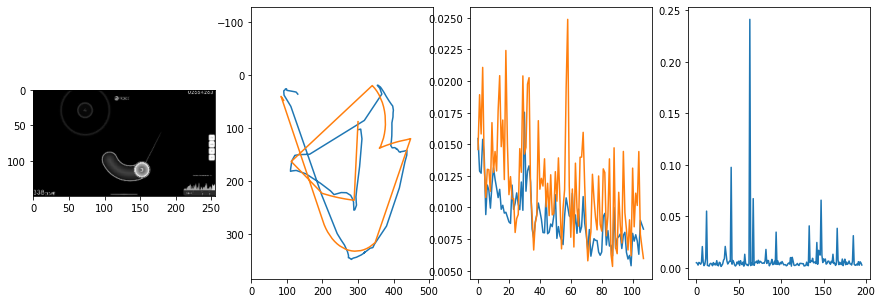


 114 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0098                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009111534466738907
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0051                                    
pred: 0.3613954484462738 0.6614611744880676
gt: 0.416015625 0.9765625
(112, 131)


<Figure size 1080x360 with 0 Axes>

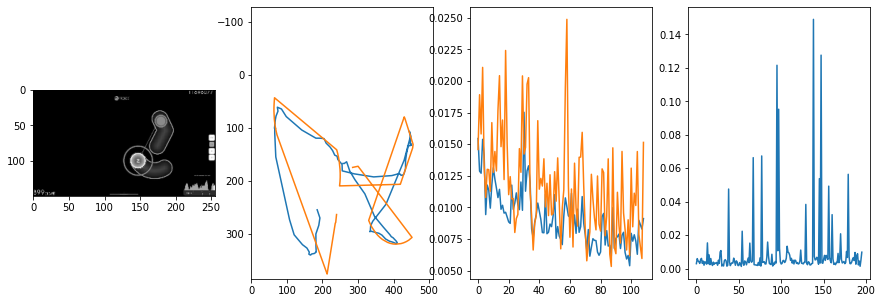


 115 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0134                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007941338859679063
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0075                                    
pred: 0.2663182020187378 0.3671424388885498
gt: 0.6093747615814209 0.5624998807907104
(142, 83)


<Figure size 1080x360 with 0 Axes>

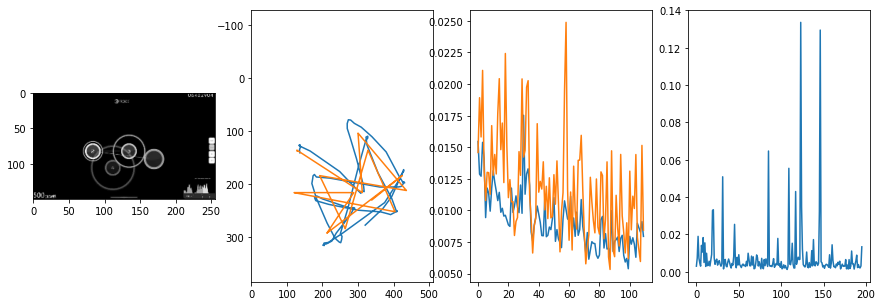


 116 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.84it/s  0.0031                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005712999269420908
outliers: 18
retrain: 8                 
val: 50/50 loss: 0.0090                                    
pred: 0.5150487422943115 0.5056643486022949
gt: 0.48412570357322693 0.6284765601158142
(123, 91)


<Figure size 1080x360 with 0 Axes>

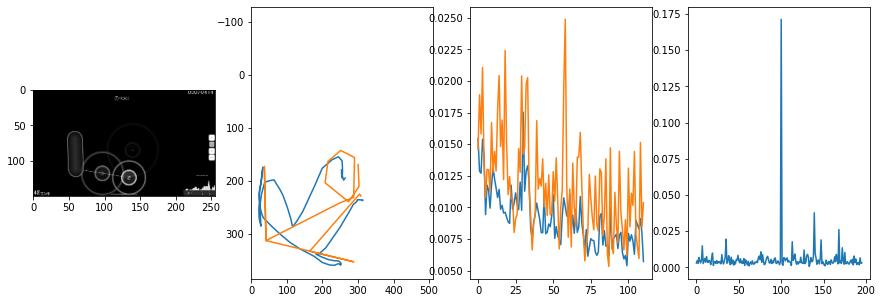


 117 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0104                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008776045829646898
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0299                                    
pred: 0.5198991298675537 0.2350764125585556
gt: 0.12927207350730896 0.8747697472572327
(68, 119)


<Figure size 1080x360 with 0 Axes>

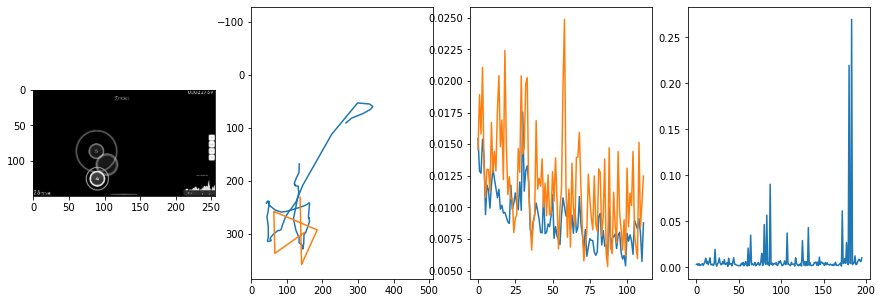


 118 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0501                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007733798608105458
outliers: 14
retrain: 8                 
val: 50/50 loss: 0.0127                                    
pred: 0.5134832262992859 0.5706770420074463
gt: 0.5775584578514099 0.5791221261024475
(137, 85)


<Figure size 1080x360 with 0 Axes>

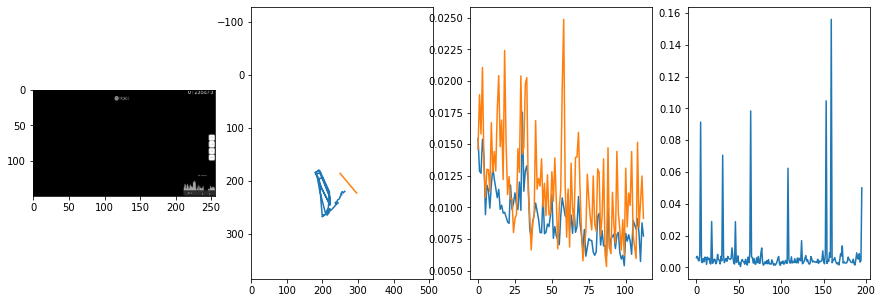


 119 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0118                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0055516457517170445
outliers: 18
retrain: 8                 
val: 50/50 loss: 0.0304                                    
pred: 0.5385063886642456 0.45973700284957886
gt: 0.49989017844200134 0.5001996755599976
(125, 76)


<Figure size 1080x360 with 0 Axes>

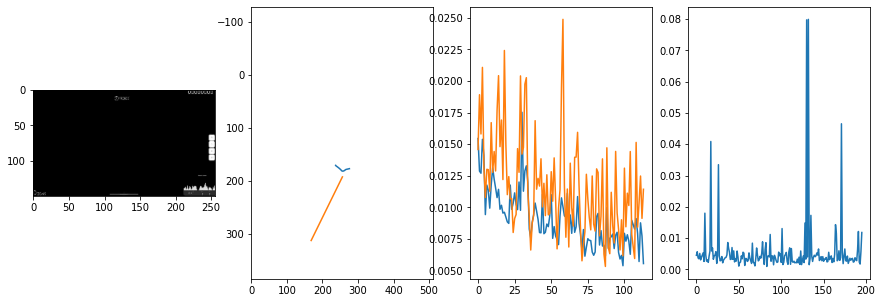


 120 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.87it/s  0.0072                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0055955006264040855
outliers: 47
retrain: 8                 
val: 50/50 loss: 0.0074                                    
pred: 0.38188791275024414 0.467055082321167
gt: 0.5 0.5
(125, 76)


<Figure size 1080x360 with 0 Axes>

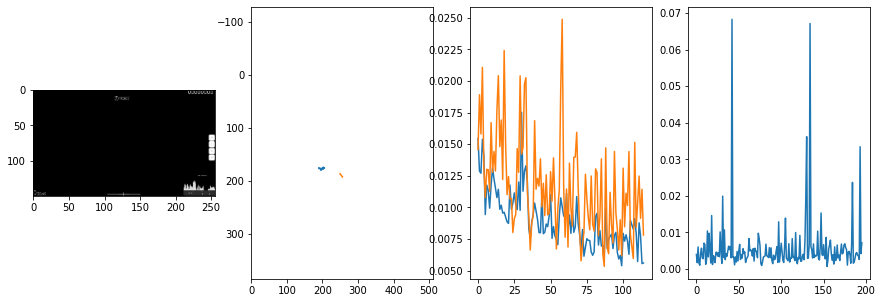


 121 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0081                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00820901964753106
outliers: 48
retrain: 8                 
val: 50/50 loss: 0.0066                                    
pred: 0.49715477228164673 0.5750001668930054
gt: 0.5976476669311523 0.49827322363853455
(140, 75)


<Figure size 1080x360 with 0 Axes>

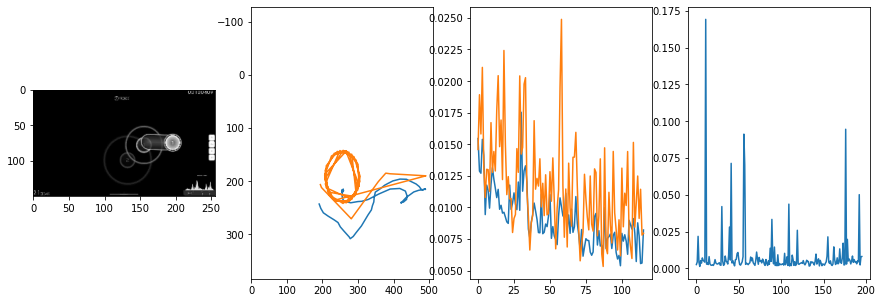


 122 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0589                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006303565748325758
outliers: 20
retrain: 8                 
val: 50/50 loss: 0.0065                                    
pred: 0.8247506022453308 0.23704351484775543
gt: 0.8437490463256836 0.0026115074288100004
(178, 18)


<Figure size 1080x360 with 0 Axes>

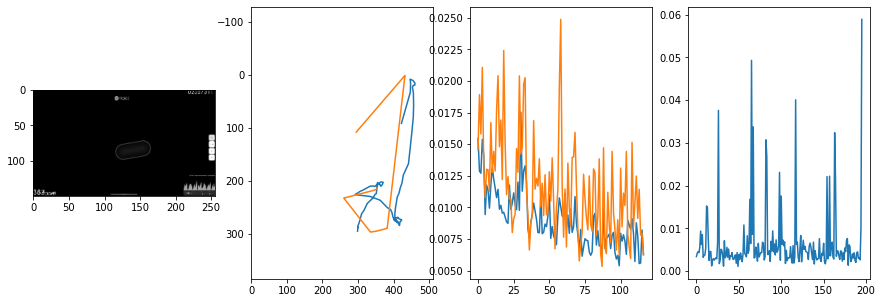


 123 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.77it/s  0.0019                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0060481234632993154
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0045                                    
pred: 0.807332456111908 0.24181804060935974
gt: 0.930210292339325 0.48056861758232117
(192, 73)


<Figure size 1080x360 with 0 Axes>

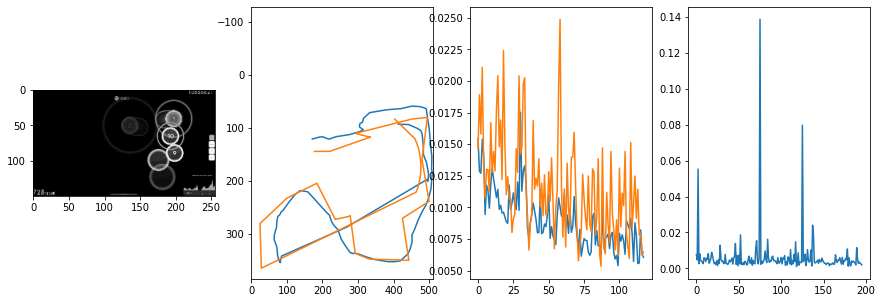


 124 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.92it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006507495886228066
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0020                                    
pred: 0.819043755531311 0.5340365767478943
gt: 0.7953693866729736 0.6977605223655701
(171, 99)


<Figure size 1080x360 with 0 Axes>

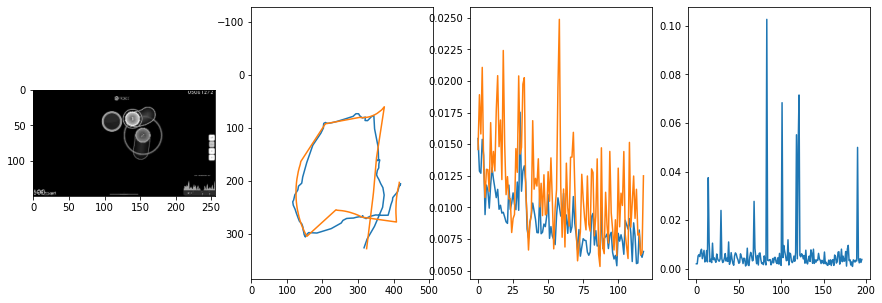


 125 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0034                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007463955142825119
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0068                                    
pred: 0.32812148332595825 0.8448452949523926
gt: 0.2656250298023224 0.7187500596046448
(89, 101)


<Figure size 1080x360 with 0 Axes>

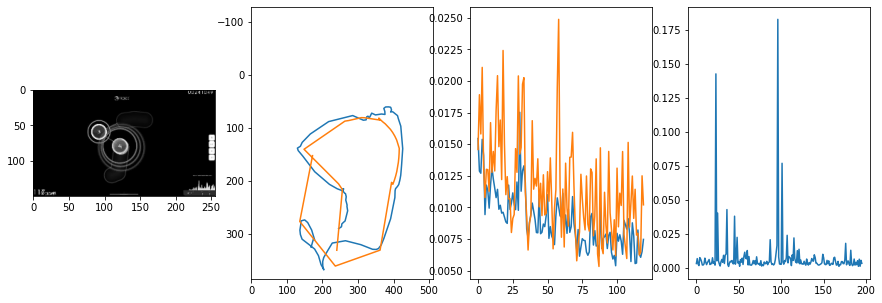


 126 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0019                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00795920109744564
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0071                                    
pred: 0.19131986796855927 0.26732003688812256
gt: 0.12109375 0.5182291865348816
(66, 78)


<Figure size 1080x360 with 0 Axes>

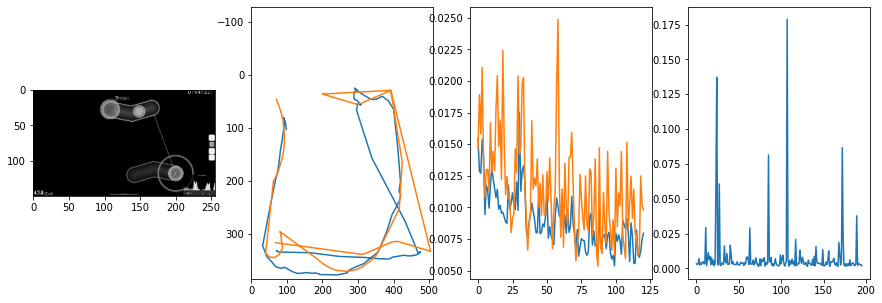


 127 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.78it/s  0.0028                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008062295770101553
outliers: 21
retrain: 8                 
val: 50/50 loss: 0.0064                                    
pred: 0.8861783146858215 0.7296784520149231
gt: 0.5937500596046448 0.36458340287208557
(140, 60)


<Figure size 1080x360 with 0 Axes>

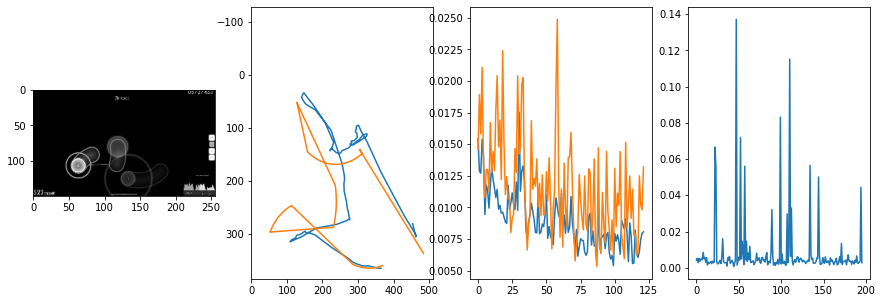


 128 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0045                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005557614696842894
outliers: 20
retrain: 8                 
val: 50/50 loss: 0.0033                                    
pred: 0.4776475131511688 0.2982166111469269
gt: 0.4083611071109772 0.4247616231441498
(111, 67)


<Figure size 1080x360 with 0 Axes>

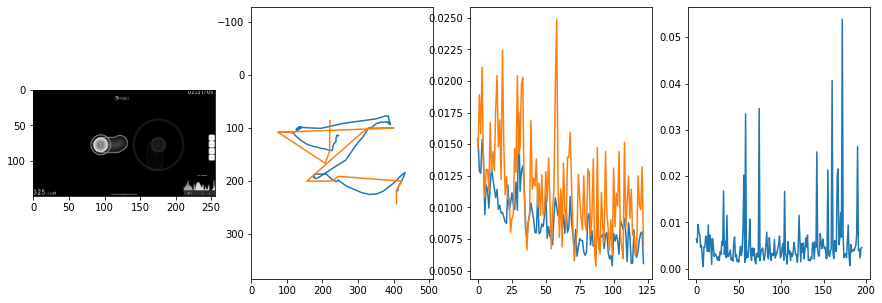


 129 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007849000448394301
outliers: 53
retrain: 8                 
val: 50/50 loss: 0.0158                                    
pred: 0.4281449615955353 0.8407288193702698
gt: 0.560546875 0.59375
(134, 87)


<Figure size 1080x360 with 0 Axes>

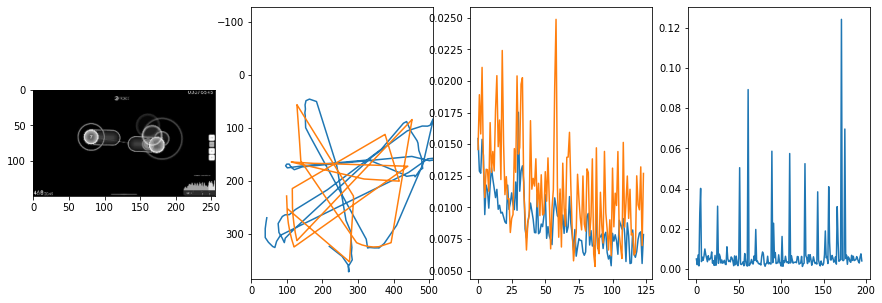


 130 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006506757423452729
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0045                                    
pred: 0.4451447129249573 0.4437592625617981
gt: 0.5832089781761169 0.5681567788124084
(138, 84)


<Figure size 1080x360 with 0 Axes>

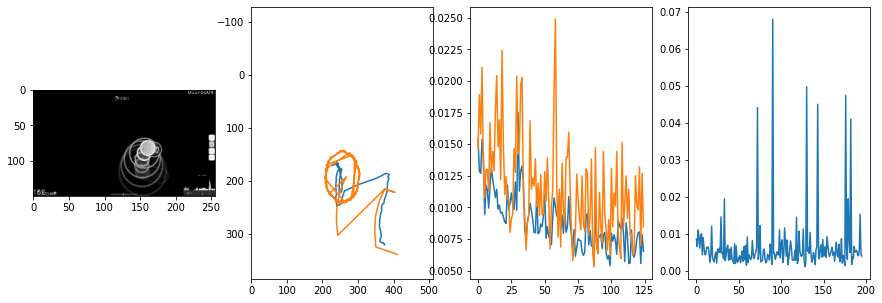


 131 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.74it/s  0.0028                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006676346963605302
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0029                                    
pred: 0.2774221897125244 0.27143990993499756
gt: 0.11590094119310379 0.6562605500221252
(65, 94)


<Figure size 1080x360 with 0 Axes>

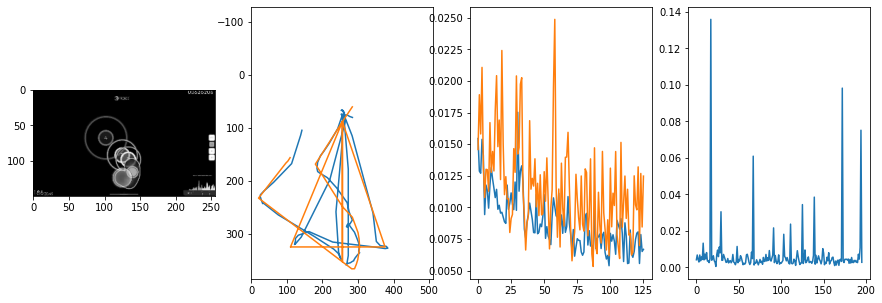


 132 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.75it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007977801446068786
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0067                                    
pred: 0.46796631813049316 0.4695563316345215
gt: 0.5350224375724792 0.6215468645095825
(130, 90)


<Figure size 1080x360 with 0 Axes>

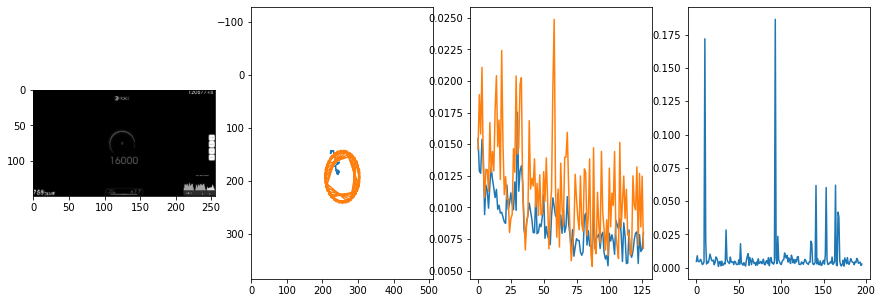


 133 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0051                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008369685799876531
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.550453782081604 0.49760279059410095
gt: 0.44018083810806274 0.3970789909362793
(116, 64)


<Figure size 1080x360 with 0 Axes>

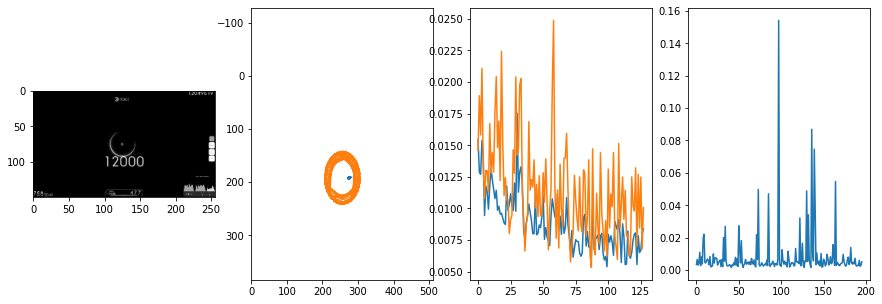


 134 of 134
4392.471614122391 secs


In [23]:
start = time.time()

epochs = 128
loss_thresh = 0.0005
rnum_min = 8
trainVNRecurse()

end = time.time()
print(end - start, 'secs')

In [24]:
print(best_loss)
torch.save(best_weights, model_path + str(epoch_cum) + '.pt')

0.005323485191911459


In [25]:
seq_dur = 1
best_loss = 9999

In [26]:
train_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)
val_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)

1 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0025                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007354210913926719
outliers: 0

val: 50/50 loss: 0.0022                                    
pred: 0.1820131242275238 0.37722790241241455
gt: 0.27734375 0.3958333432674408
(91, 64)


<Figure size 1080x360 with 0 Axes>

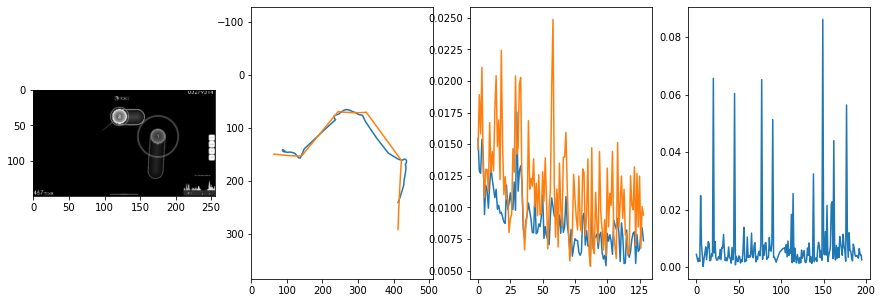


 135 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.90it/s  0.0062                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007918575073281132
outliers: 33
retrain: 4                 
val: 50/50 loss: 0.0040                                    
pred: 0.24329301714897156 0.7210181355476379
gt: 0.029699306935071945 0.3661889135837555
(52, 60)


<Figure size 1080x360 with 0 Axes>

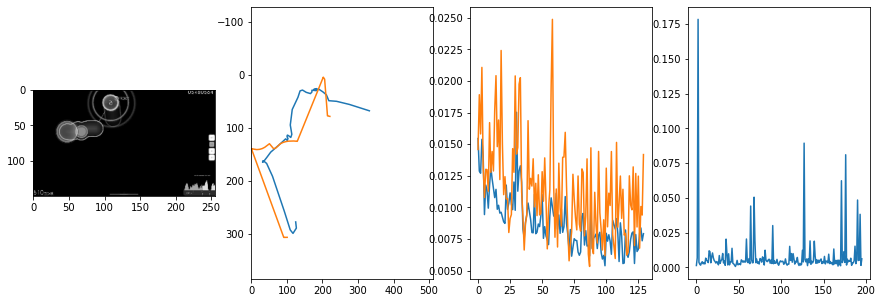


 136 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0056                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009269320648205135
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0063                                    
pred: 0.6327059864997864 0.650571346282959
gt: 0.31836459040641785 0.7890567779541016
(97, 109)


<Figure size 1080x360 with 0 Axes>

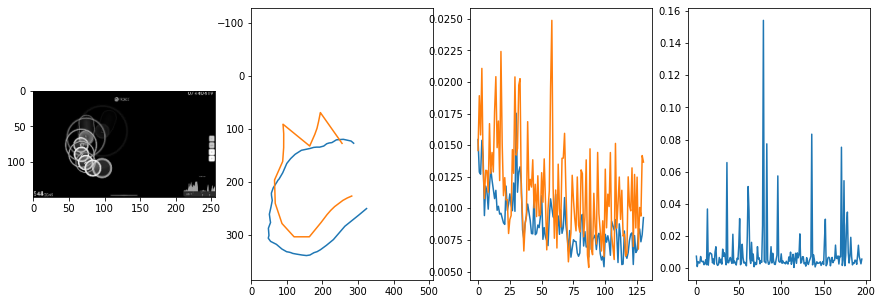


 137 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0118                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008017651701098954
outliers: 28
retrain: 4                 
val: 50/50 loss: 0.0247                                    
pred: 0.7880071401596069 0.4627954959869385
gt: 0.8673679232597351 0.5825185179710388
(182, 85)


<Figure size 1080x360 with 0 Axes>

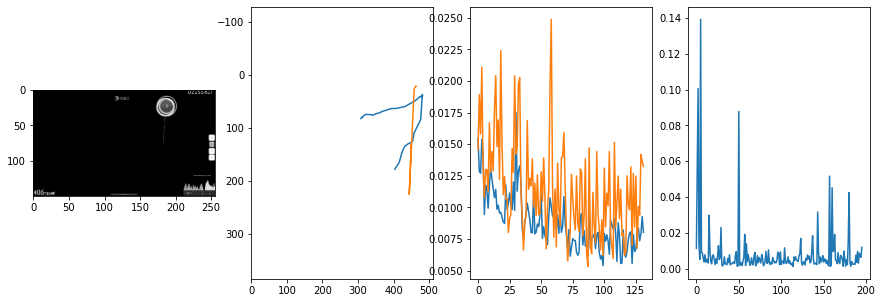


 138 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.94it/s  0.0037                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007272069547126398
outliers: 27
retrain: 4                 
val: 50/50 loss: 0.0015                                    
pred: 0.8056062459945679 0.34199029207229614
gt: 0.8454039692878723 0.2854549288749695
(179, 51)


<Figure size 1080x360 with 0 Axes>

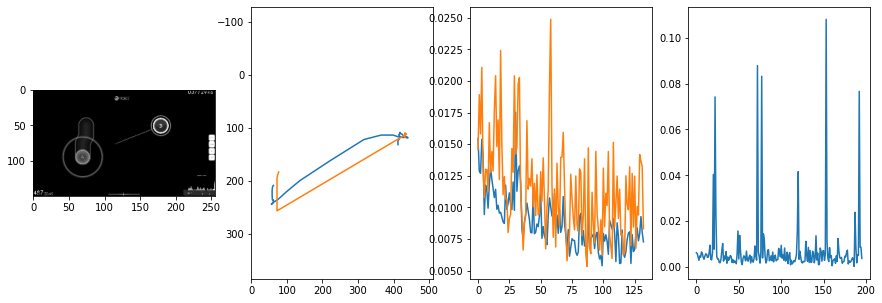


 139 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.68it/s  0.0022                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007291431155362242
outliers: 35
retrain: 4                 
val: 50/50 loss: 0.0376                                    
pred: 0.2375786304473877 0.7891099452972412
gt: 0.06250270456075668 0.2708331048488617
(57, 49)


<Figure size 1080x360 with 0 Axes>

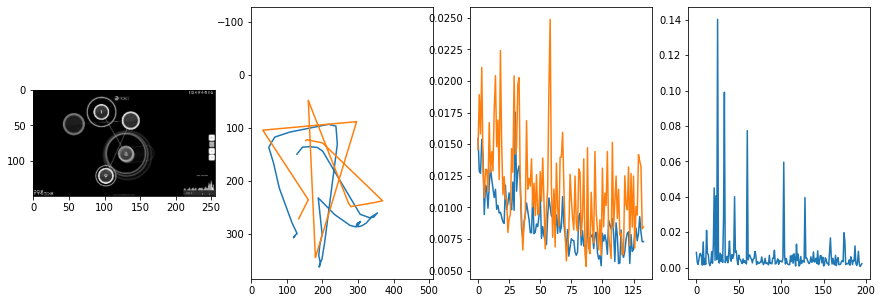


 140 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0027                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0060221424737021
outliers: 38
retrain: 4                 
val: 50/50 loss: 0.0071                                    
pred: 0.5660407543182373 0.592652440071106
gt: 0.4349474608898163 0.4600558280944824
(115, 71)


<Figure size 1080x360 with 0 Axes>

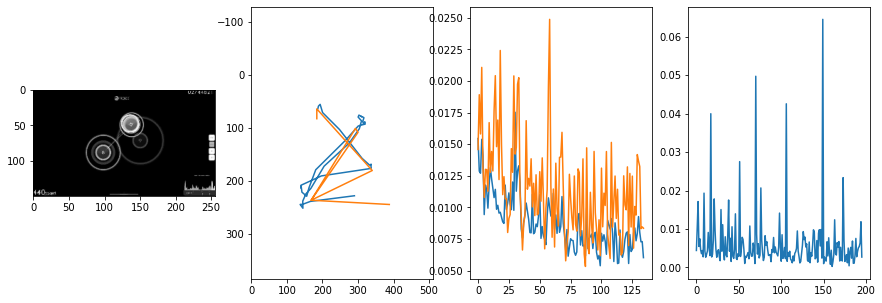


 141 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.74it/s  0.0052                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007484878366159712
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0131                                    
pred: 0.29491791129112244 0.6866076588630676
gt: 0.46080031991004944 0.5408360958099365
(119, 80)


<Figure size 1080x360 with 0 Axes>

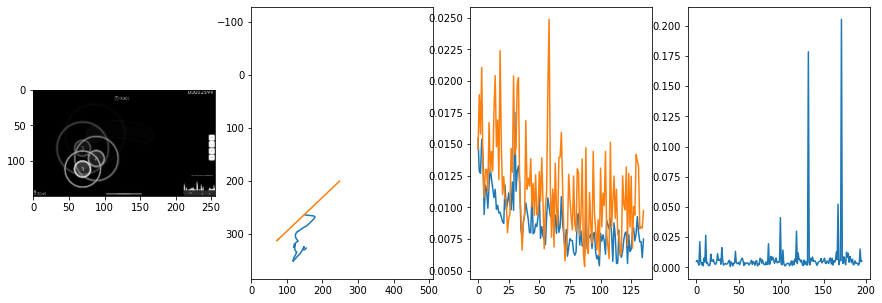


 142 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.11it/s  0.0016                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007553475651900731
outliers: 32
retrain: 4                 
val: 50/50 loss: 0.0065                                    
pred: 0.3735814094543457 0.8967481851577759
gt: 0.4765494465827942 0.3177355229854584
(121, 54)


<Figure size 1080x360 with 0 Axes>

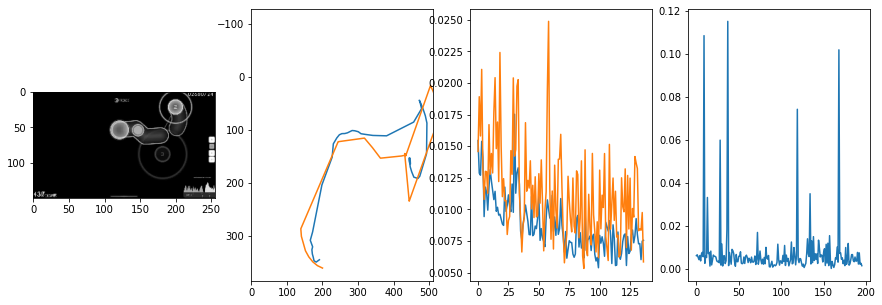


 143 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.91it/s  0.0039                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00676082879570978
outliers: 26
retrain: 4                 
val: 50/50 loss: 0.0059                                    
pred: 0.39901095628738403 0.418056458234787
gt: 0.7169777750968933 0.6142504811286926
(159, 89)


<Figure size 1080x360 with 0 Axes>

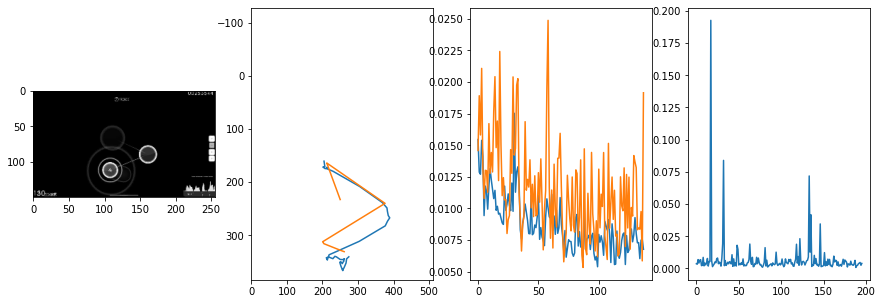


 144 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.25it/s  0.0023                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008185692783237235
outliers: 59
retrain: 4                 
val: 50/50 loss: 0.0068                                    
pred: 0.24236708879470825 0.3342941999435425
gt: 0.6806616187095642 0.4168911874294281
(153, 66)


<Figure size 1080x360 with 0 Axes>

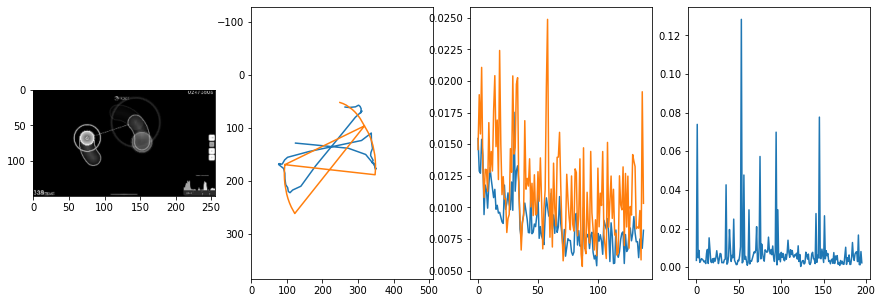


 145 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.32it/s  0.0071                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008651699762427894
outliers: 32
retrain: 4                 
val: 50/50 loss: 0.0081                                    
pred: 0.47692984342575073 0.49204355478286743
gt: 0.29140356183052063 0.8497735857963562
(93, 116)


<Figure size 1080x360 with 0 Axes>

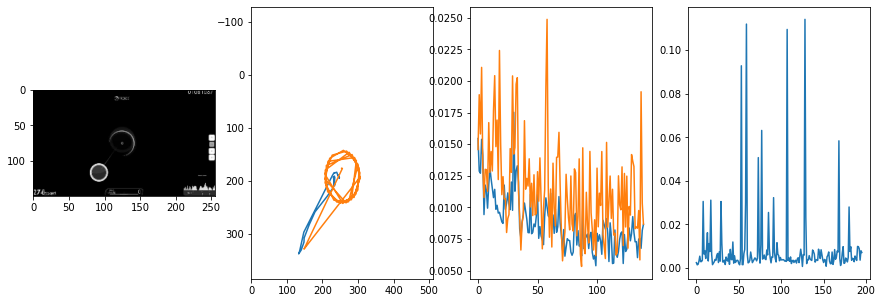


 146 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0052                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0068859127944107265
outliers: 27
retrain: 4                 
val: 50/50 loss: 0.0052                                    
pred: 0.5341255068778992 0.6394009590148926
gt: 0.5859375 0.5000000596046448
(138, 76)


<Figure size 1080x360 with 0 Axes>

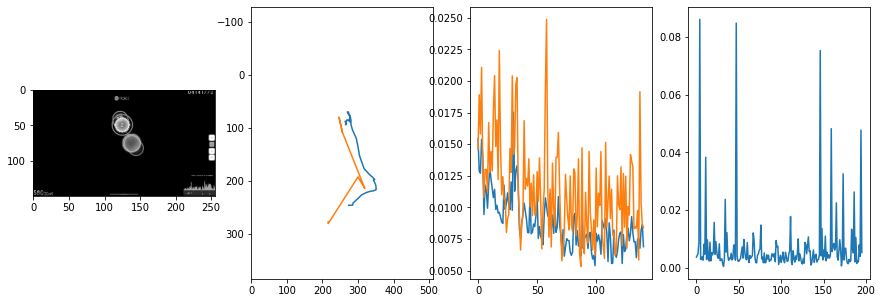


 147 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0098                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00668075372395462
outliers: 39
retrain: 4                 
val: 50/50 loss: 0.0028                                    
pred: 0.3477201759815216 0.8417087197303772
gt: 0.2052503228187561 0.7605089545249939
(79, 106)


<Figure size 1080x360 with 0 Axes>

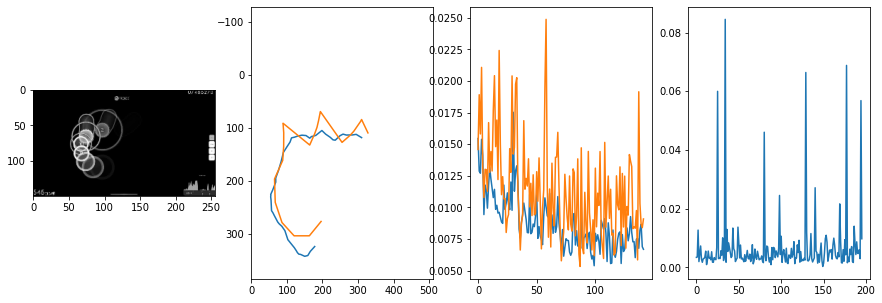


 148 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0101                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00794627824239908
outliers: 36
retrain: 4                 
val: 50/50 loss: 0.0066                                    
pred: 0.48935168981552124 0.5265142917633057
gt: 0.5609077215194702 0.39822033047676086
(134, 64)


<Figure size 1080x360 with 0 Axes>

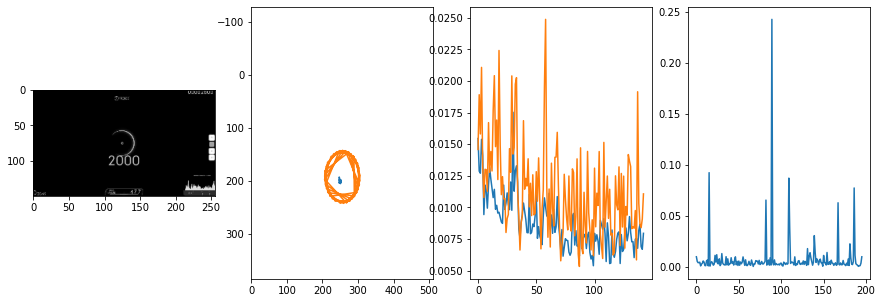


 149 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.22it/s  0.0077                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007723598879980569
outliers: 31
retrain: 4                 
val: 50/50 loss: 0.0077                                    
pred: 0.25962117314338684 0.49038419127464294
gt: 0.4929600954055786 0.7718634605407715
(124, 107)


<Figure size 1080x360 with 0 Axes>

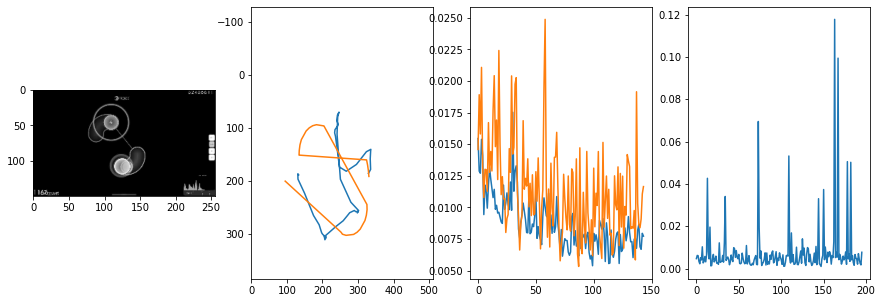


 150 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.24it/s  0.0041                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010153150998771057
outliers: 46
retrain: 4                 
val: 50/50 loss: 0.0037                                    
pred: 0.43637412786483765 0.4241083264350891
gt: 0.2617187201976776 0.6458332538604736
(88, 93)


<Figure size 1080x360 with 0 Axes>

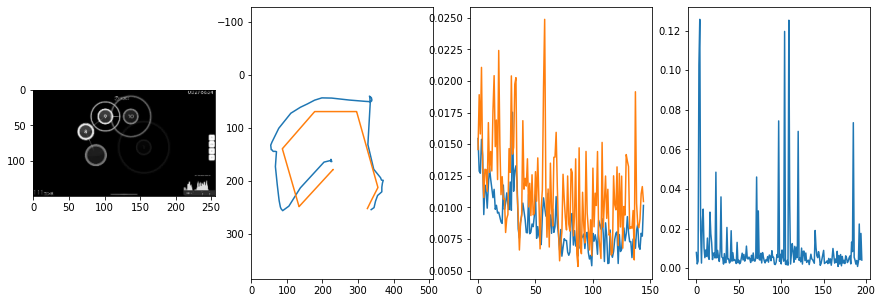


 151 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.15it/s  0.0023                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006536482386671158
outliers: 19
retrain: 4                 
val: 50/50 loss: 0.0025                                    
pred: 0.7201172709465027 0.5298007130622864
gt: 0.6255857348442078 0.8740315437316895
(145, 119)


<Figure size 1080x360 with 0 Axes>

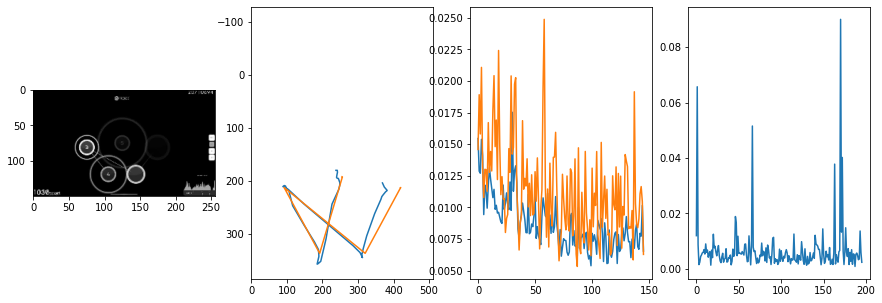


 152 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0105                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007604327565415439
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0049                                    
pred: -0.0028465837240219116 0.6235120296478271
gt: 0.11102994531393051 0.18959426879882812
(65, 40)


<Figure size 1080x360 with 0 Axes>

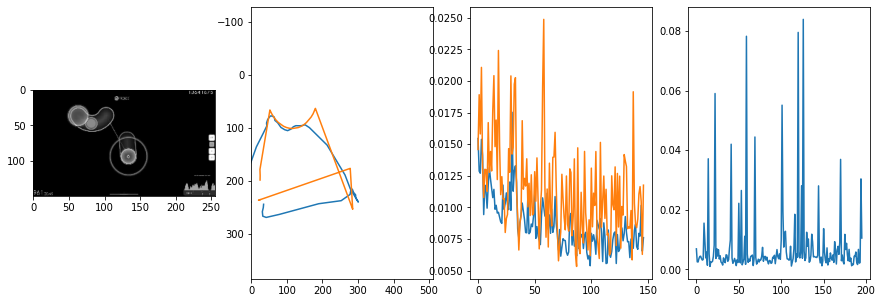


 153 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0060                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008520867406480889
outliers: 38
retrain: 4                 
val: 50/50 loss: 0.0130                                    
pred: 0.7302063703536987 0.43530529737472534
gt: 0.83984375 0.41666659712791443
(178, 66)


<Figure size 1080x360 with 0 Axes>

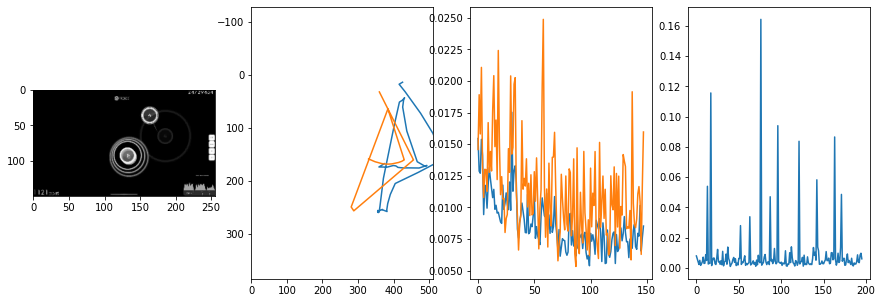


 154 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.92it/s  0.0010                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008366918090489759
outliers: 50
retrain: 4                 
val: 50/50 loss: 0.0057                                    
pred: 0.7572493553161621 0.3936293125152588
gt: 0.7302839756011963 0.6298567652702332
(161, 91)


<Figure size 1080x360 with 0 Axes>

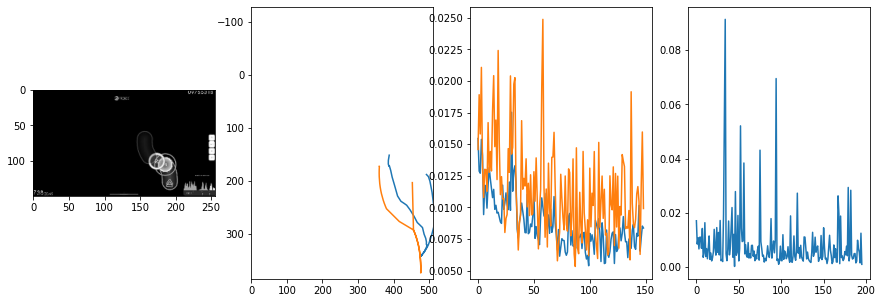


 155 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.86it/s  0.0041                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006578045333224843
outliers: 25
retrain: 4                 
val: 50/50 loss: 0.0017                                    
pred: 0.33060234785079956 0.33864596486091614
gt: 0.3671875 0.34375
(104, 57)


<Figure size 1080x360 with 0 Axes>

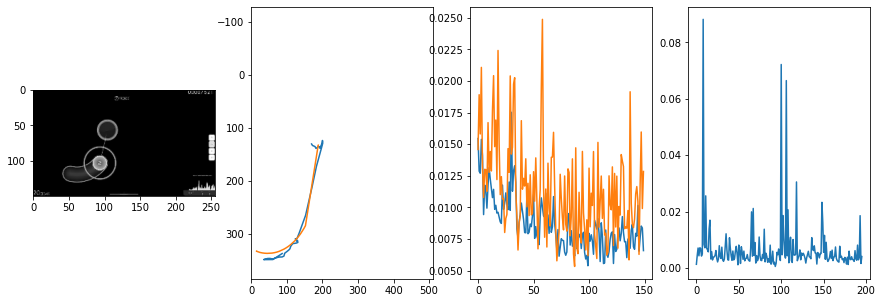


 156 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0014                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006866890481228902
outliers: 34
retrain: 4                 
val: 50/50 loss: 0.0055                                    
pred: 0.34372806549072266 0.2421981692314148
gt: 0.4492136538028717 0.4921787679195404
(117, 75)


<Figure size 1080x360 with 0 Axes>

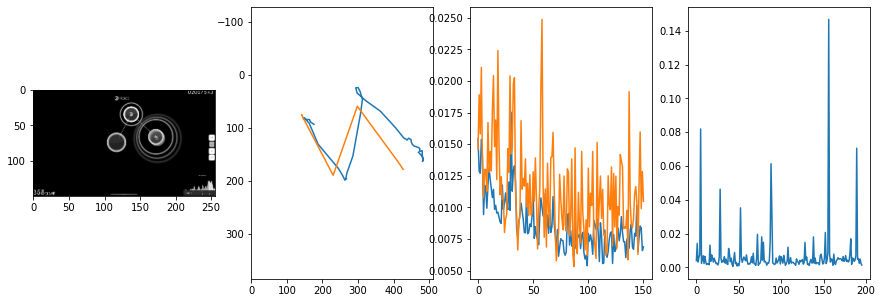


 157 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0088                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008326396878276552
outliers: 48
retrain: 4                 
val: 50/50 loss: 0.0092                                    
pred: 0.11672176420688629 0.5823006629943848
gt: 0.19726566970348358 0.6250000596046448
(78, 90)


<Figure size 1080x360 with 0 Axes>

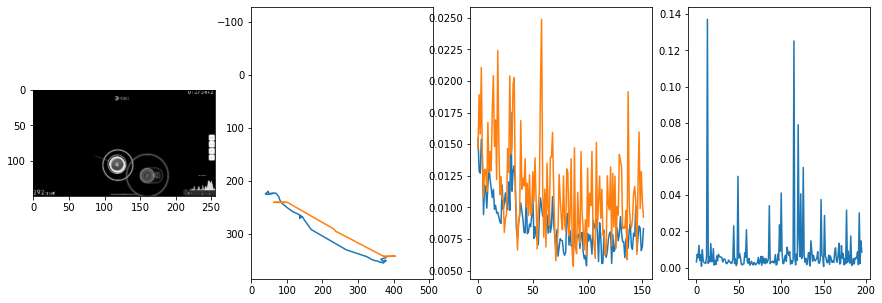


 158 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007705990674701158
outliers: 34
retrain: 4                 
val: 50/50 loss: 0.0065                                    
pred: 0.48853781819343567 0.49971625208854675
gt: 0.5165128707885742 0.6283333897590637
(128, 91)


<Figure size 1080x360 with 0 Axes>

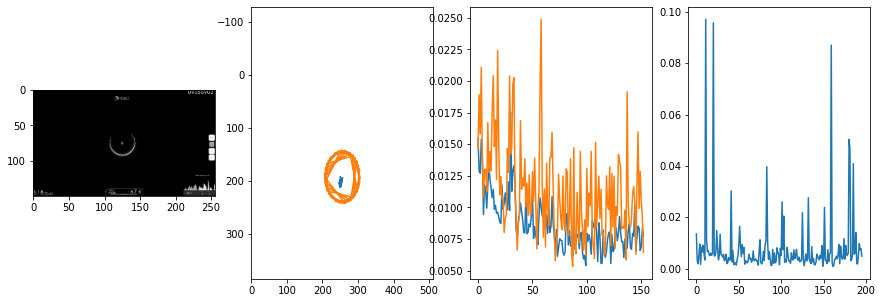


 159 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.27it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006675505985705448
outliers: 25
retrain: 4                 
val: 50/50 loss: 0.0028                                    
pred: 0.38520461320877075 0.23719075322151184
gt: 0.43749094009399414 0.2630087435245514
(115, 48)


<Figure size 1080x360 with 0 Axes>

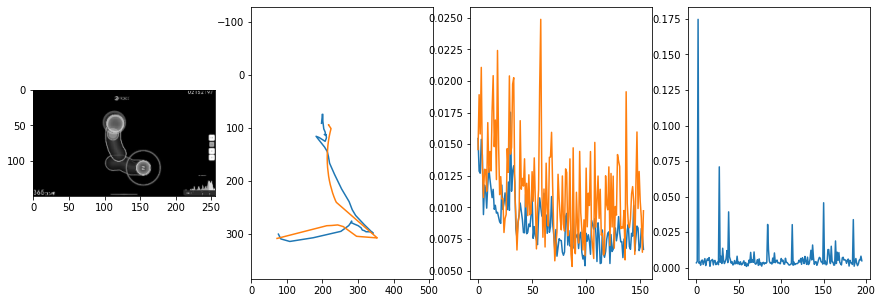


 160 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.63it/s  0.0015                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010405279605409453
outliers: 56
retrain: 4                 
val: 50/50 loss: 0.0037                                    
pred: 0.6275222301483154 0.470608115196228
gt: 0.6526304483413696 0.6572216749191284
(149, 94)


<Figure size 1080x360 with 0 Axes>

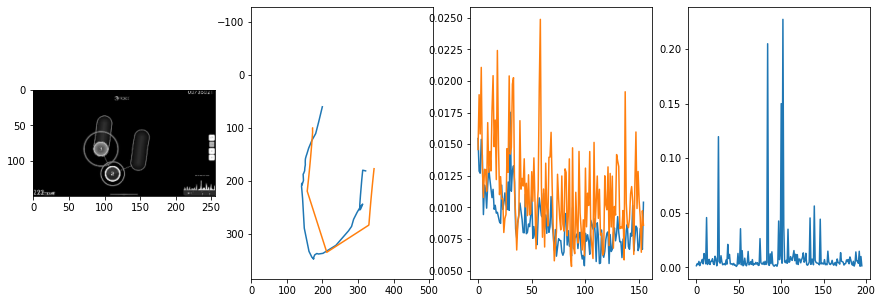


 161 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.19it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007765038676496965
outliers: 20
retrain: 4                 
val: 50/50 loss: 0.0058                                    
pred: 0.6415938138961792 0.7659242153167725
gt: 0.7651264667510986 0.7692130208015442
(166, 107)


<Figure size 1080x360 with 0 Axes>

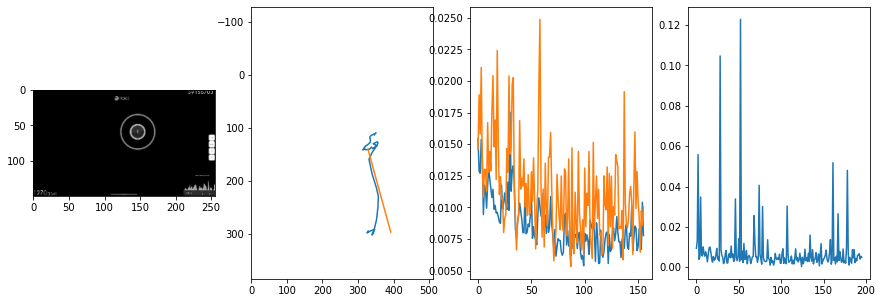


 162 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0055                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0064707428875631105
outliers: 33
retrain: 4                 
val: 50/50 loss: 0.0073                                    
pred: 0.23110345005989075 0.4440874457359314
gt: 0.35499683022499084 0.2544718384742737
(103, 47)


<Figure size 1080x360 with 0 Axes>

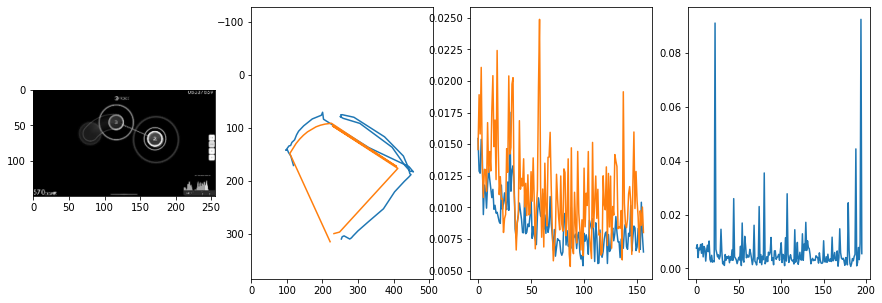


 163 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.99it/s  0.0065                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006751407594752631
outliers: 45
retrain: 4                 
val: 50/50 loss: 0.0018                                    
pred: 0.7766515612602234 0.4799675941467285
gt: 0.755859375 0.5598958134651184
(165, 83)


<Figure size 1080x360 with 0 Axes>

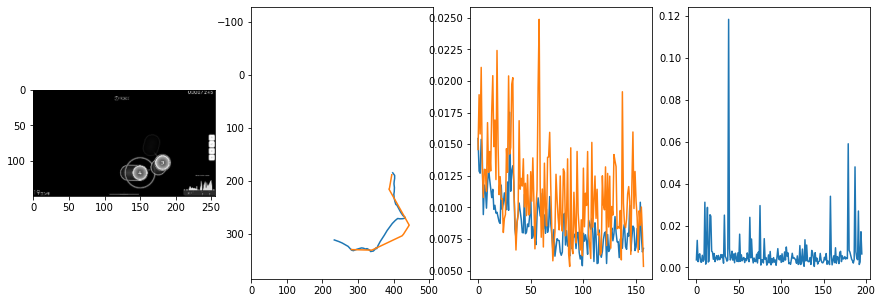


 164 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0053                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006916224139229376
outliers: 35
retrain: 4                 
val: 50/50 loss: 0.0013                                    
pred: 0.4173087477684021 0.43797585368156433
gt: 0.3128610849380493 0.45841357111930847
(96, 71)


<Figure size 1080x360 with 0 Axes>

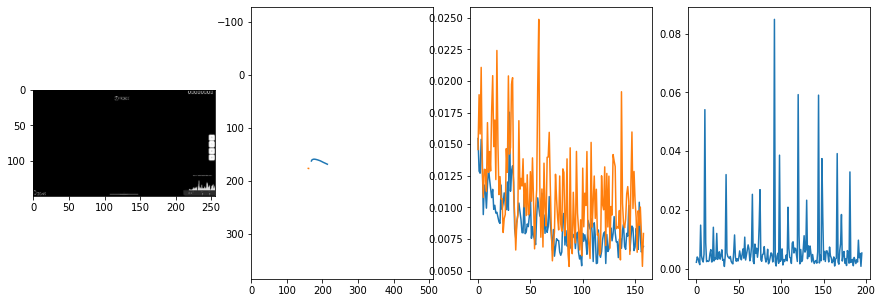


 165 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.03it/s  0.0027                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.004735176060087409
outliers: 24
retrain: 4                 
val: 50/50 loss: 0.0032                                    
pred: 0.6520412564277649 0.48455989360809326
gt: 0.6068076491355896 0.43530917167663574
(142, 68)


<Figure size 1080x360 with 0 Axes>

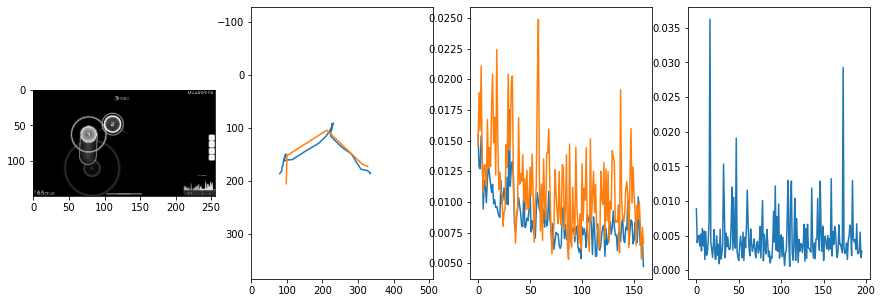


 166 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0061                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00891841312767035
outliers: 79
retrain: 4                 
val: 50/50 loss: 0.0053                                    
pred: 0.5398489236831665 0.21468263864517212
gt: 0.5459439754486084 0.5143242478370667
(132, 77)


<Figure size 1080x360 with 0 Axes>

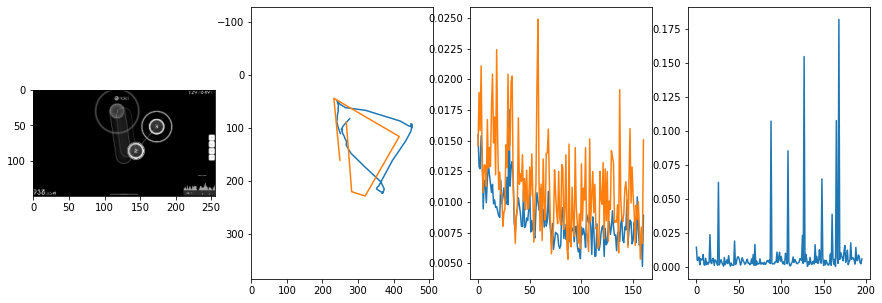


 167 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.11it/s  0.0013                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007817861201462564
outliers: 29
retrain: 4                 
val: 50/50 loss: 0.0064                                    
pred: 0.54001784324646 0.4076228141784668
gt: 0.66015625 0.609375
(150, 88)


<Figure size 1080x360 with 0 Axes>

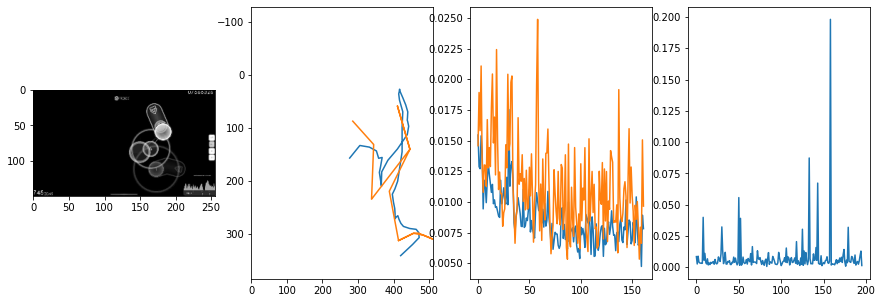


 168 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0042                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005624944818733564
outliers: 27
retrain: 4                 
val: 50/50 loss: 0.0142                                    
pred: 0.8049769401550293 0.7339004278182983
gt: 0.6796875 0.1354166716337204
(153, 33)


<Figure size 1080x360 with 0 Axes>

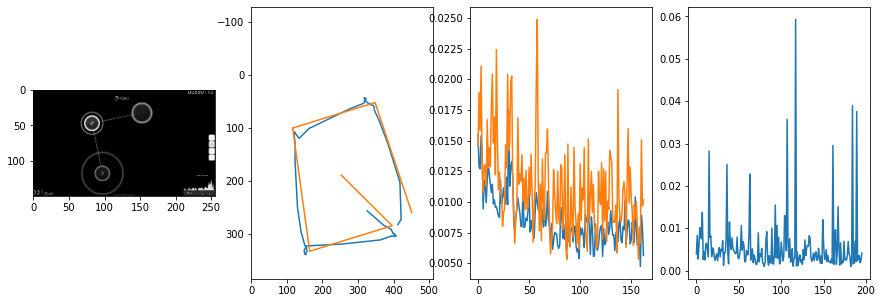


 169 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0016                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008558162992311718
outliers: 65
retrain: 4                 
val: 50/50 loss: 0.0159                                    
pred: 0.6633968949317932 0.2486204206943512
gt: 0.8515625 0.6354166865348816
(180, 91)


<Figure size 1080x360 with 0 Axes>

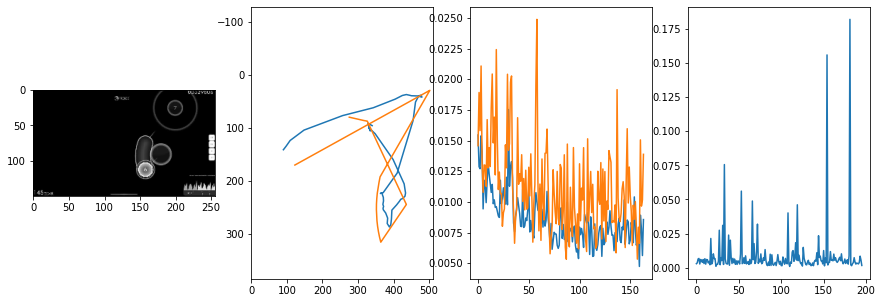


 170 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.94it/s  0.0076                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007138330285373258
outliers: 26
retrain: 4                 
val: 50/50 loss: 0.0091                                    
pred: 0.23730970919132233 0.7574722170829773
gt: 0.15789562463760376 0.6434957385063171
(72, 92)


<Figure size 1080x360 with 0 Axes>

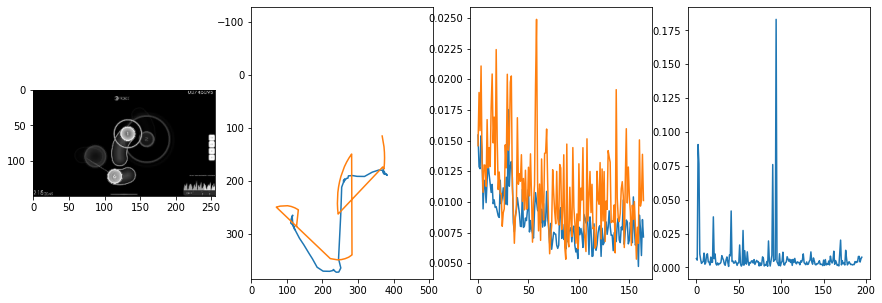


 171 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0059                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009575343033749068
outliers: 35
retrain: 4                 
val: 50/50 loss: 0.0162                                    
pred: 0.3255155682563782 0.6507129073143005
gt: 0.5421830415725708 0.48967787623405457
(132, 74)


<Figure size 1080x360 with 0 Axes>

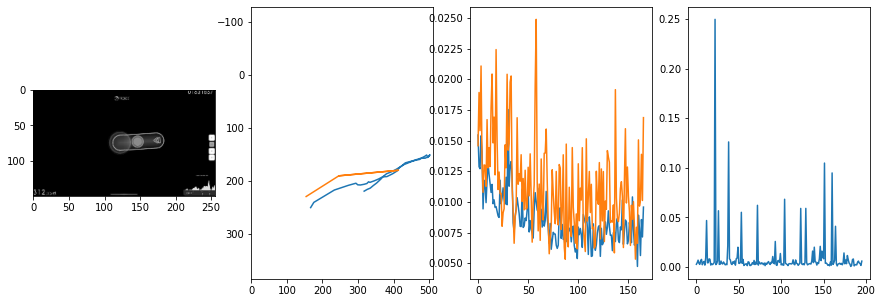


 172 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0041                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008488054544372693
outliers: 27
retrain: 4                 
val: 50/50 loss: 0.0081                                    
pred: 0.6547738909721375 0.6199064254760742
gt: 0.889352023601532 0.6806066632270813
(185, 97)


<Figure size 1080x360 with 0 Axes>

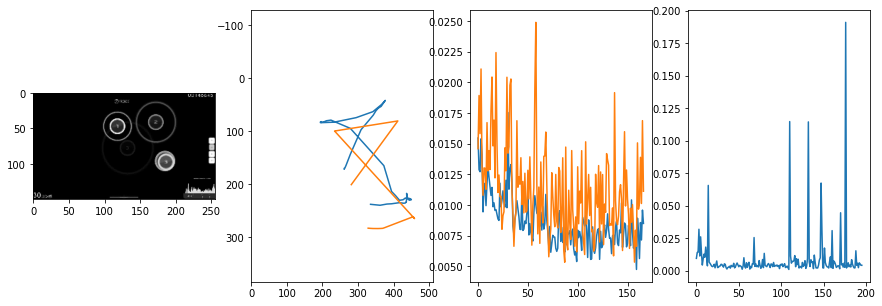


 173 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.15it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0058901900856468195
outliers: 25
retrain: 4                 
val: 50/50 loss: 0.0053                                    
pred: 0.47770577669143677 0.37529832124710083
gt: 0.5 0.3567708432674408
(125, 59)


<Figure size 1080x360 with 0 Axes>

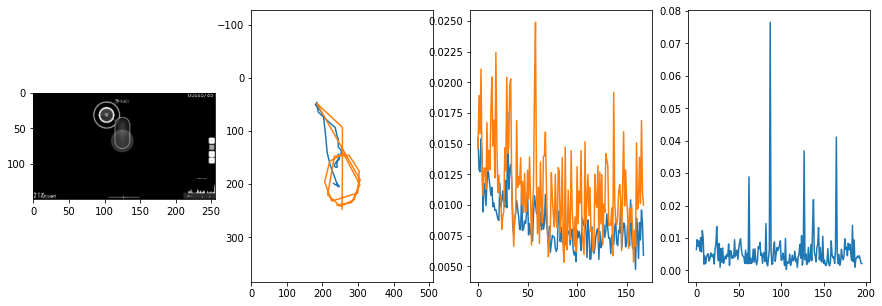


 174 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0041                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007386054196994875
outliers: 48
retrain: 4                 
val: 50/50 loss: 0.0036                                    
pred: 0.5765361785888672 0.35669058561325073
gt: 0.5636125802993774 0.35421302914619446
(135, 59)


<Figure size 1080x360 with 0 Axes>

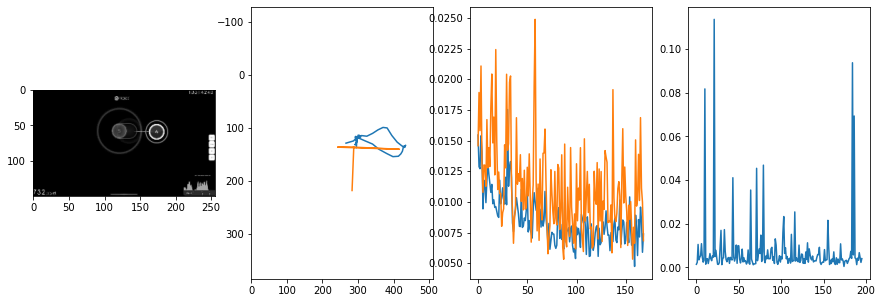


 175 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0051                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007592248031869531
outliers: 33
retrain: 4                 
val: 50/50 loss: 0.0242                                    
pred: 0.5388509035110474 0.4076666235923767
gt: 0.562499463558197 0.41666629910469055
(135, 66)


<Figure size 1080x360 with 0 Axes>

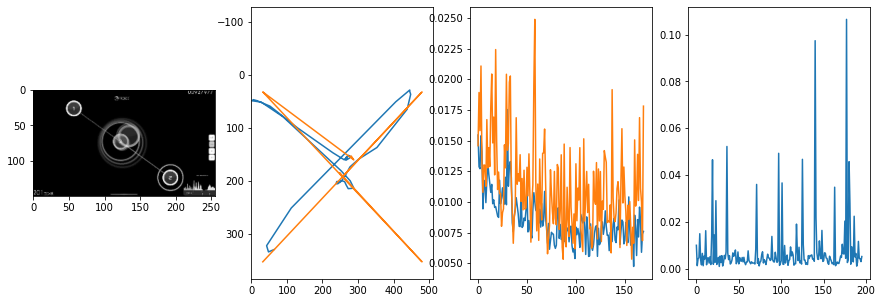


 176 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0040                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008941436837408312
outliers: 32
retrain: 4                 
val: 50/50 loss: 0.0072                                    
pred: 0.37544193863868713 0.4742134213447571
gt: 0.3941352665424347 0.23804587125778198
(109, 45)


<Figure size 1080x360 with 0 Axes>

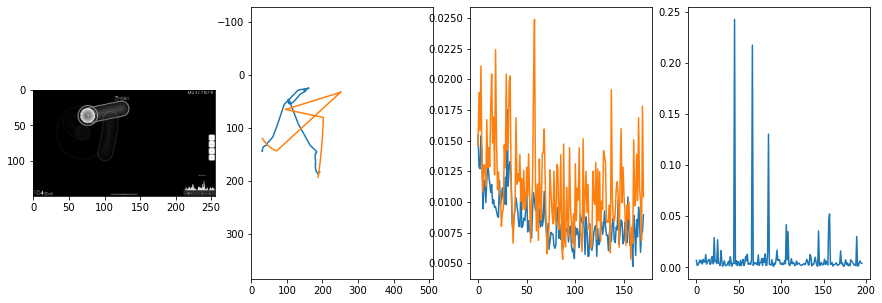


 177 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.97it/s  0.0046                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008487561364225777
outliers: 30
retrain: 4                 
val: 50/50 loss: 0.0048                                    
pred: 0.3830065429210663 0.22409039735794067
gt: 0.5742186307907104 0.30729183554649353
(137, 53)


<Figure size 1080x360 with 0 Axes>

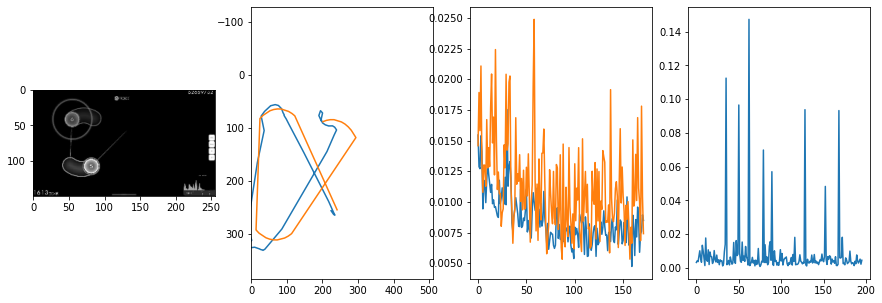


 178 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0062                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009655122411329233
outliers: 33
retrain: 4                 
val: 50/50 loss: 0.0080                                    
pred: 0.6176949143409729 0.6058265566825867
gt: 0.7578077912330627 0.31077829003334045
(165, 54)


<Figure size 1080x360 with 0 Axes>

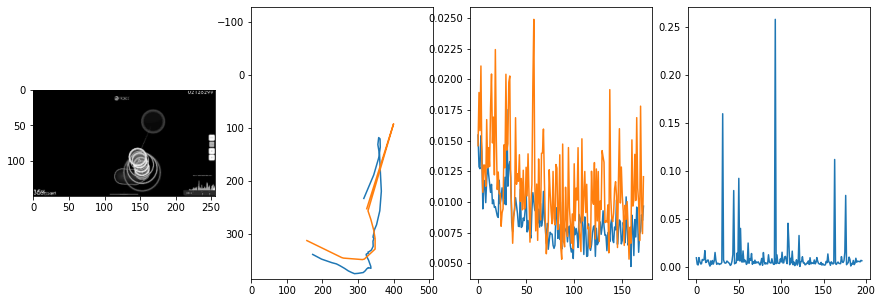


 179 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.00it/s  0.0027                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006947620768707046
outliers: 25
retrain: 4                 
val: 50/50 loss: 0.0035                                    
pred: 0.525417685508728 0.5947742462158203
gt: 0.2942880392074585 0.5338713526725769
(93, 80)


<Figure size 1080x360 with 0 Axes>

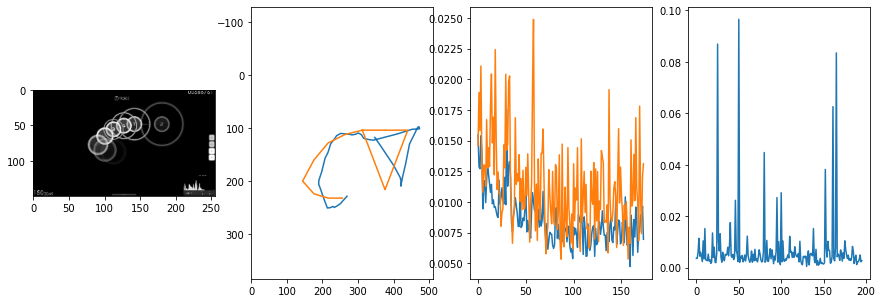


 180 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.11it/s  0.0048                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007197457116527236
outliers: 41
retrain: 4                 
val: 50/50 loss: 0.0090                                    
pred: 0.5091744065284729 0.4152507185935974
gt: 0.8207704424858093 0.1825474500656128
(175, 39)


<Figure size 1080x360 with 0 Axes>

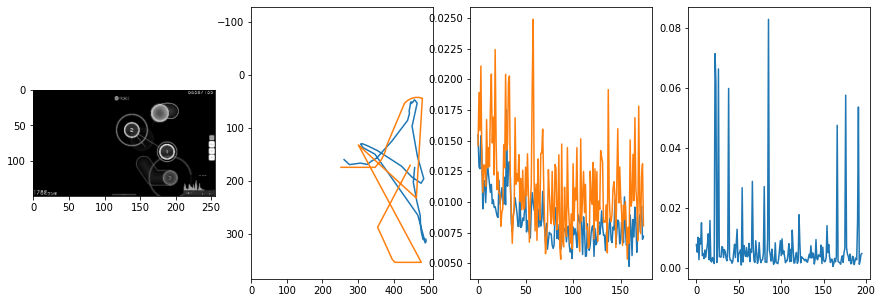


 181 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.36it/s  0.0165                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006565388986705422
outliers: 31
retrain: 4                 
val: 50/50 loss: 0.0169                                    
pred: 0.5338894724845886 0.9001290798187256
gt: 0.5669744610786438 0.8555594086647034
(135, 117)


<Figure size 1080x360 with 0 Axes>

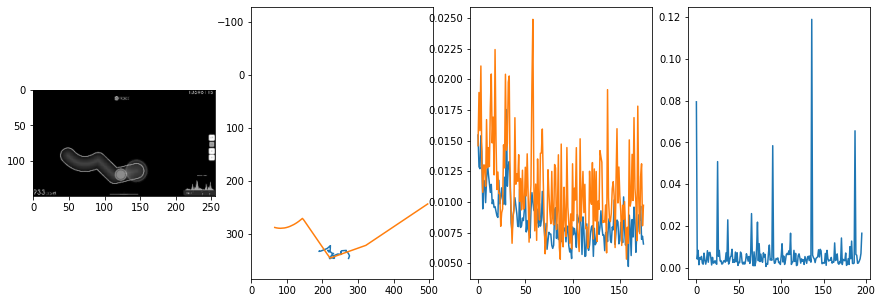


 182 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.18it/s  0.0073                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007752362524969408
outliers: 58
retrain: 4                 
val: 50/50 loss: 0.0028                                    
pred: 0.5381954908370972 0.4016824960708618
gt: 0.6680116653442383 0.4032280147075653
(151, 64)


<Figure size 1080x360 with 0 Axes>

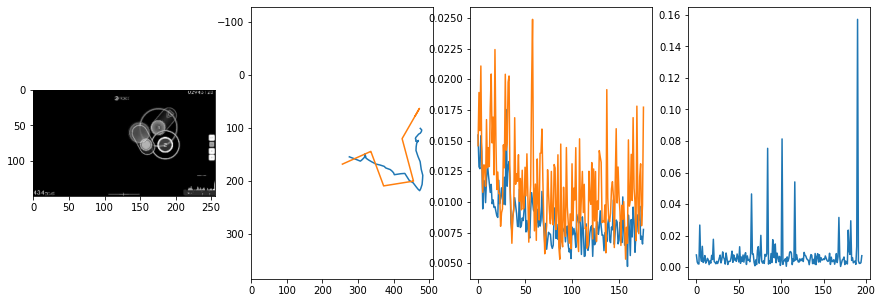


 183 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.13it/s  0.0067                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008500228568849782
outliers: 47
retrain: 4                 
val: 50/50 loss: 0.0064                                    
pred: 0.6497547030448914 0.3801390528678894
gt: 0.6640625 0.4270833432674408
(150, 67)


<Figure size 1080x360 with 0 Axes>

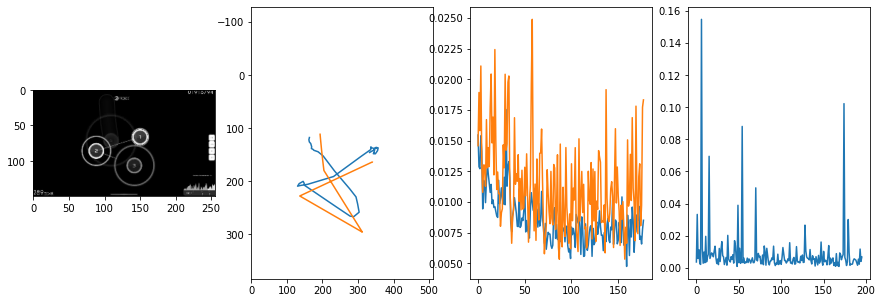


 184 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.03it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008612951481247402
outliers: 39
retrain: 4                 
val: 50/50 loss: 0.0074                                    
pred: 0.6798815727233887 0.805177628993988
gt: 0.6636418104171753 0.9801812171936035
(150, 132)


<Figure size 1080x360 with 0 Axes>

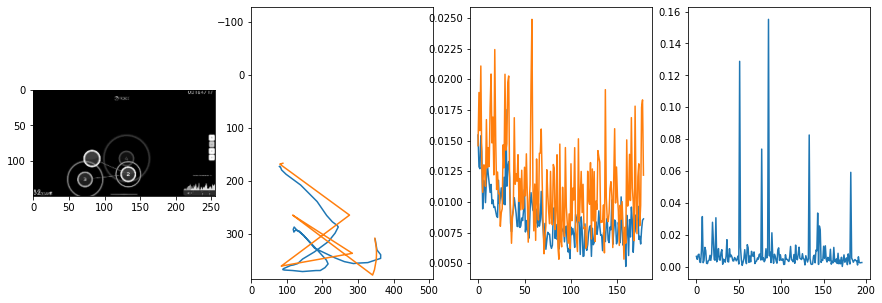


 185 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0027                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007883523971291393
outliers: 30
retrain: 4                 
val: 50/50 loss: 0.0055                                    
pred: 0.6680659055709839 0.5130695104598999
gt: 0.6143593192100525 0.5045499801635742
(143, 76)


<Figure size 1080x360 with 0 Axes>

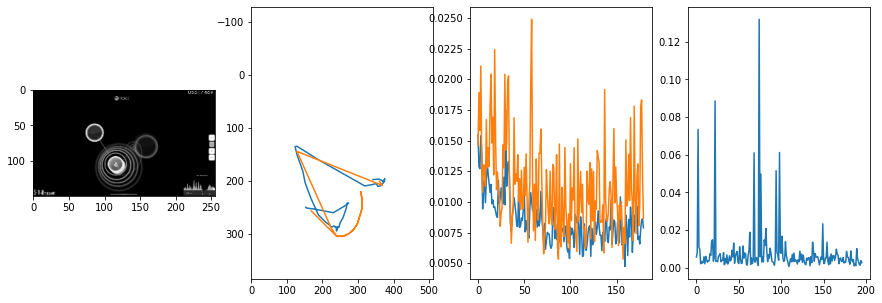


 186 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0085                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006024175636857577
outliers: 32
retrain: 4                 
val: 50/50 loss: 0.0057                                    
pred: 0.4220811724662781 0.5486343502998352
gt: 0.4807737171649933 0.32710978388786316
(122, 56)


<Figure size 1080x360 with 0 Axes>

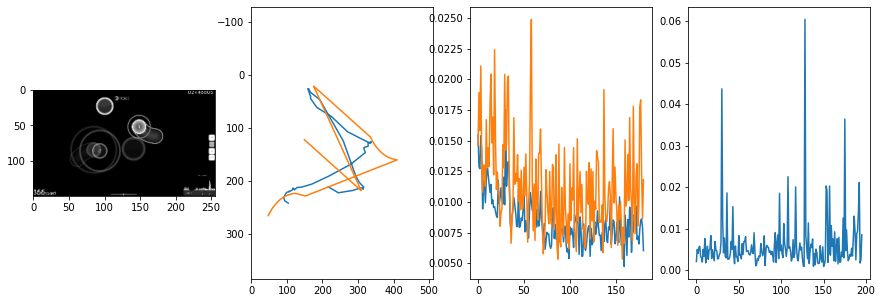


 187 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.97it/s  0.0036                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009533955546319294
outliers: 65
retrain: 4                 
val: 50/50 loss: 0.0060                                    
pred: 0.5593831539154053 0.8761447668075562
gt: 0.7428750991821289 0.5113334655761719
(163, 77)


<Figure size 1080x360 with 0 Axes>

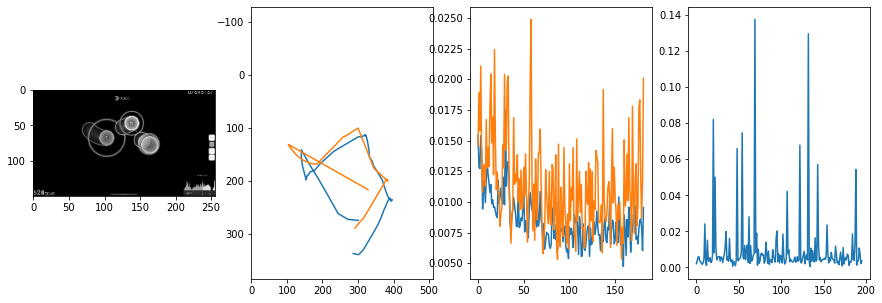


 188 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.22it/s  0.0038                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0070218628255189494
outliers: 24
retrain: 4                 
val: 50/50 loss: 0.0018                                    
pred: 0.6460965275764465 0.8113471865653992
gt: 0.7644320726394653 0.640718400478363
(166, 92)


<Figure size 1080x360 with 0 Axes>

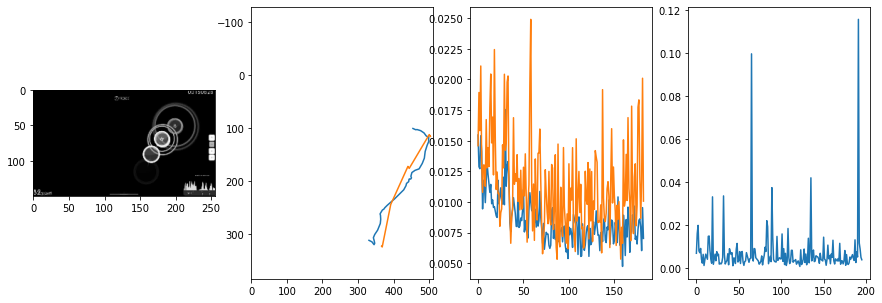


 189 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.18it/s  0.0018                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005885384736311793
outliers: 31
retrain: 4                 
val: 50/50 loss: 0.0099                                    
pred: 0.9146075248718262 0.26015782356262207
gt: 0.7993826270103455 0.3579169511795044
(171, 59)


<Figure size 1080x360 with 0 Axes>

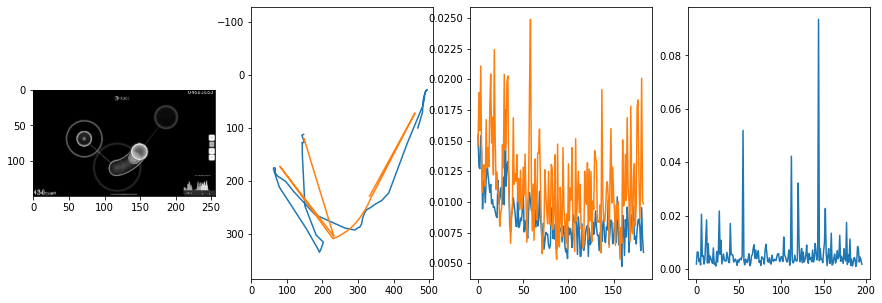


 190 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0060                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007594230773232697
outliers: 63
retrain: 4                 
val: 50/50 loss: 0.0025                                    
pred: 0.2969771921634674 0.2893897294998169
gt: 0.26561853289604187 0.33332470059394836
(89, 56)


<Figure size 1080x360 with 0 Axes>

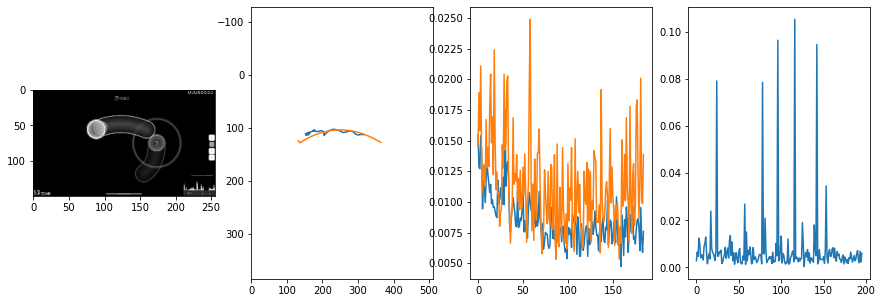


 191 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.97it/s  0.0040                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008475375127722035
outliers: 40
retrain: 4                 
val: 50/50 loss: 0.0094                                    
pred: 0.8719549179077148 0.5714404582977295
gt: 0.9035744667053223 0.45651867985725403
(188, 71)


<Figure size 1080x360 with 0 Axes>

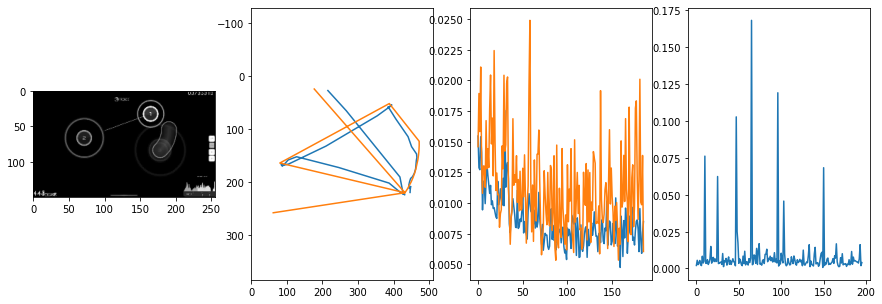


 192 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.25it/s  0.0062                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006737266338135743
outliers: 25
retrain: 4                 
val: 50/50 loss: 0.0058                                    
pred: 0.20266291499137878 0.505316972732544
gt: 0.2501240670681 0.41209229826927185
(86, 65)


<Figure size 1080x360 with 0 Axes>

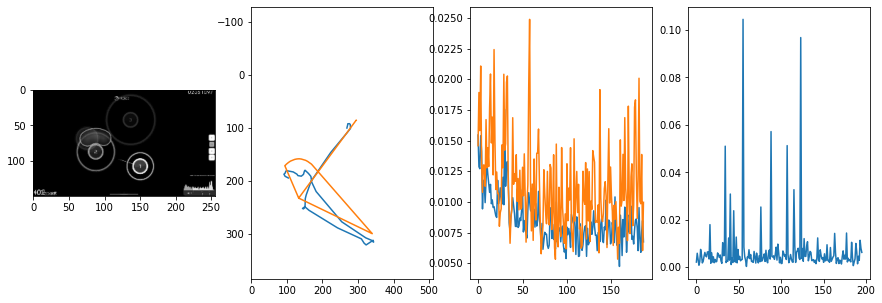


 193 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.29it/s  0.0012                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006984882448723882
outliers: 42
retrain: 4                 
val: 50/50 loss: 0.0048                                    
pred: 0.3392485976219177 0.831281840801239
gt: 0.4288232922554016 0.49653613567352295
(114, 75)


<Figure size 1080x360 with 0 Axes>

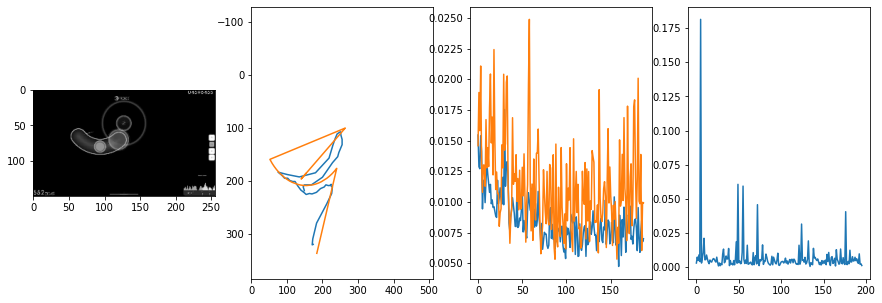


 194 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.13it/s  0.0008                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007285480883461899
outliers: 33
retrain: 4                 
val: 50/50 loss: 0.0341                                    
pred: 0.5314408540725708 0.5229551792144775
gt: 0.671875 0.1250000149011612
(152, 32)


<Figure size 1080x360 with 0 Axes>

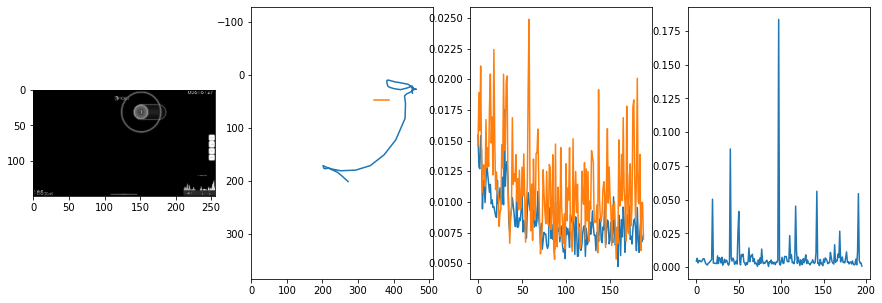


 195 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.19it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007916776471704776
outliers: 36
retrain: 4                 
val: 50/50 loss: 0.0056                                    
pred: 0.28986090421676636 0.2302706241607666
gt: 0.13982273638248444 0.23507648706436157
(69, 45)


<Figure size 1080x360 with 0 Axes>

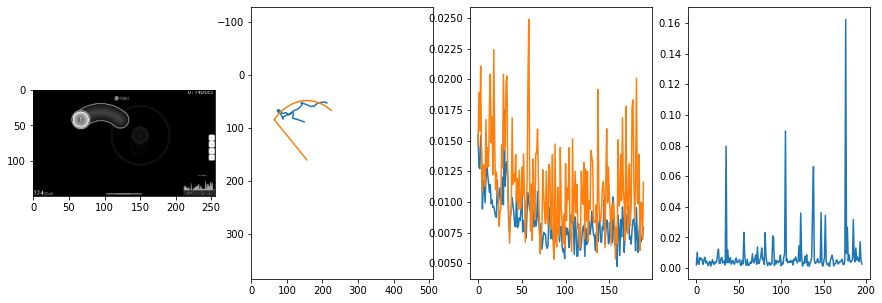


 196 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.13it/s  0.0033                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00704365127662919
outliers: 29
retrain: 4                 
val: 50/50 loss: 0.0021                                    
pred: 0.761422872543335 0.7078433632850647
gt: 0.7955256104469299 0.6390953660011292
(171, 92)


<Figure size 1080x360 with 0 Axes>

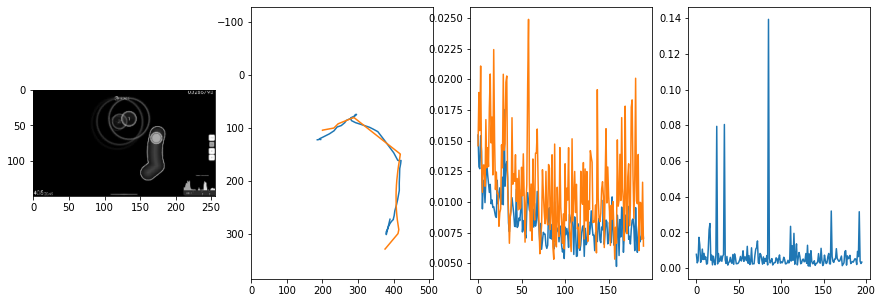


 197 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0054                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006001792875432162
outliers: 36
retrain: 4                 
val: 50/50 loss: 0.0041                                    
pred: 0.47079840302467346 0.3415076434612274
gt: 0.78125 0.1354166716337204
(169, 33)


<Figure size 1080x360 with 0 Axes>

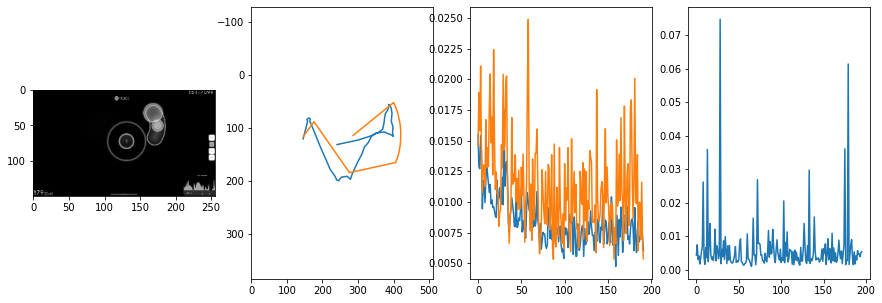


 198 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0025                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006455471490008509
outliers: 43
retrain: 4                 
val: 50/50 loss: 0.0052                                    
pred: 0.12198950350284576 0.3621557950973511
gt: 0.078125 0.5520833134651184
(60, 82)


<Figure size 1080x360 with 0 Axes>

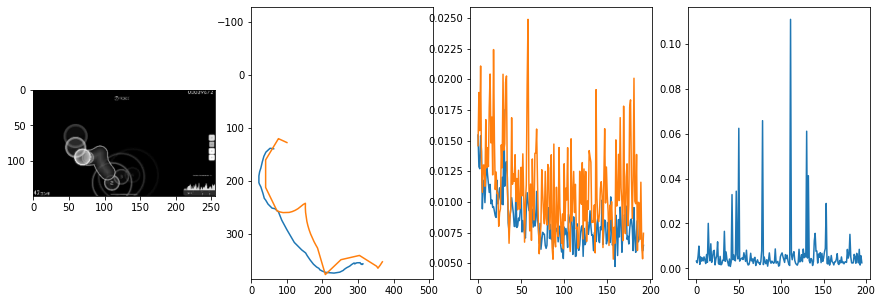


 199 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.83it/s  0.0075                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006376212581722493
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0096                                    
pred: 0.5535628795623779 0.262424498796463
gt: 0.5542464852333069 0.285431444644928
(133, 51)


<Figure size 1080x360 with 0 Axes>

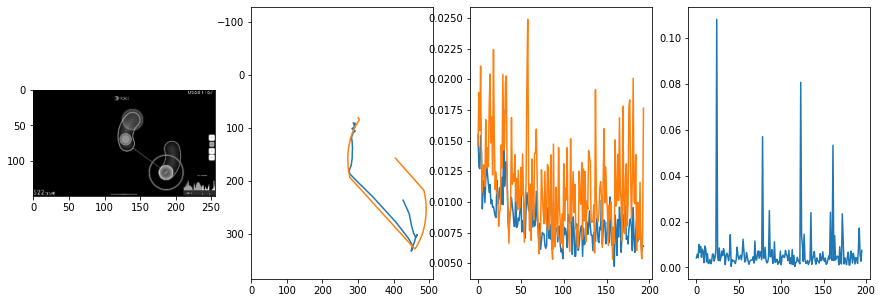


 200 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.99it/s  0.0039                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005141038229042778
outliers: 32
retrain: 4                 
val: 50/50 loss: 0.0024                                    
pred: 0.4823495149612427 0.6784605383872986
gt: 0.4816921055316925 0.6989970803260803
(122, 99)


<Figure size 1080x360 with 0 Axes>

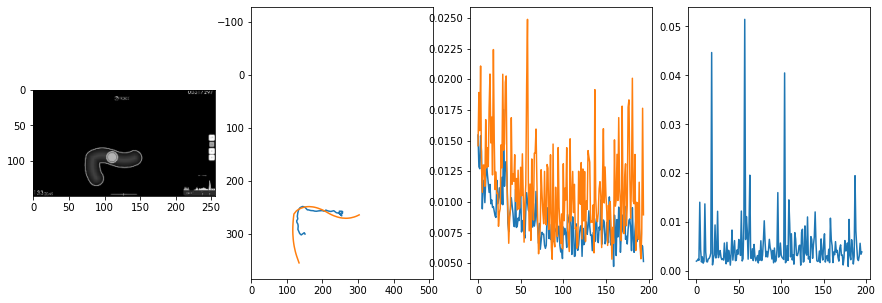


 201 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0114                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006237134483835317
outliers: 65
retrain: 4                 
val: 50/50 loss: 0.0084                                    
pred: 0.4827345609664917 0.36976003646850586
gt: 0.8437497019767761 0.0833340510725975
(178, 27)


<Figure size 1080x360 with 0 Axes>

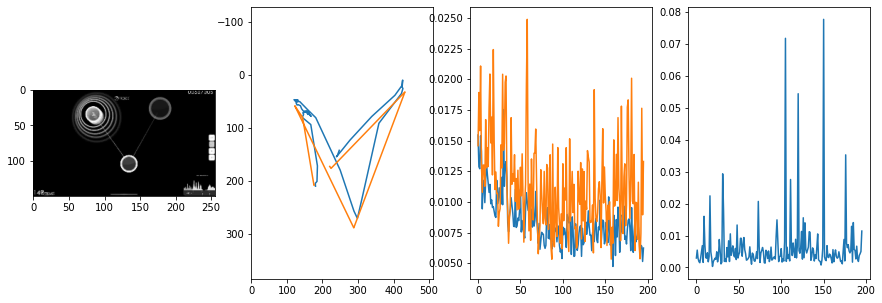


 202 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0397                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007839196097885012
outliers: 50
retrain: 4                 
val: 50/50 loss: 0.0772                                    
pred: 0.5708553791046143 0.39642035961151123
gt: 0.35988283157348633 0.1192905530333519
(103, 31)


<Figure size 1080x360 with 0 Axes>

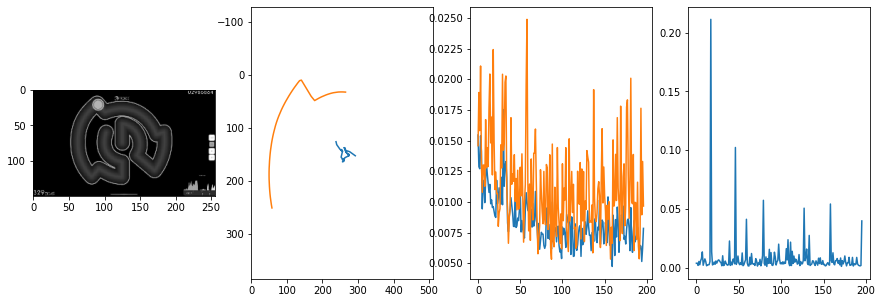


 203 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.03it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005819017918096209
outliers: 29
retrain: 4                 
val: 50/50 loss: 0.0021                                    
pred: 0.6233303546905518 0.6626701354980469
gt: 0.49399998784065247 0.6875
(124, 97)


<Figure size 1080x360 with 0 Axes>

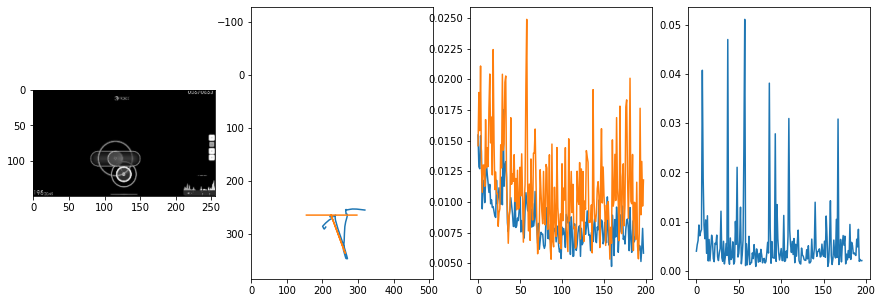


 204 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0028                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00940849008816722
outliers: 67
retrain: 4                 
val: 50/50 loss: 0.0033                                    
pred: 0.26023438572883606 0.7503548264503479
gt: 0.17968742549419403 0.760416567325592
(75, 106)


<Figure size 1080x360 with 0 Axes>

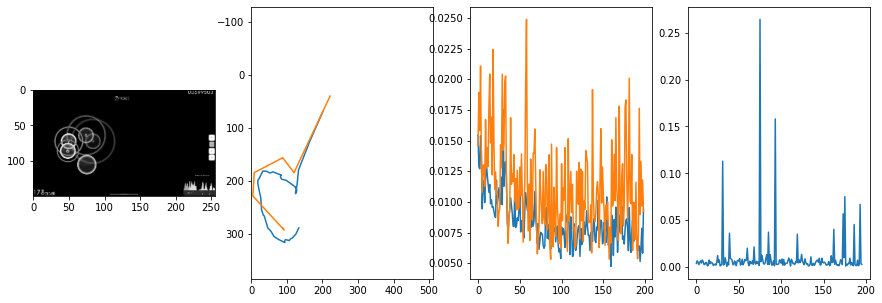


 205 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0017                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0071982597793827825
outliers: 21
retrain: 4                 
val: 50/50 loss: 0.0069                                    
pred: 0.48656517267227173 0.32401734590530396
gt: 0.8202876448631287 0.15104632079601288
(175, 35)


<Figure size 1080x360 with 0 Axes>

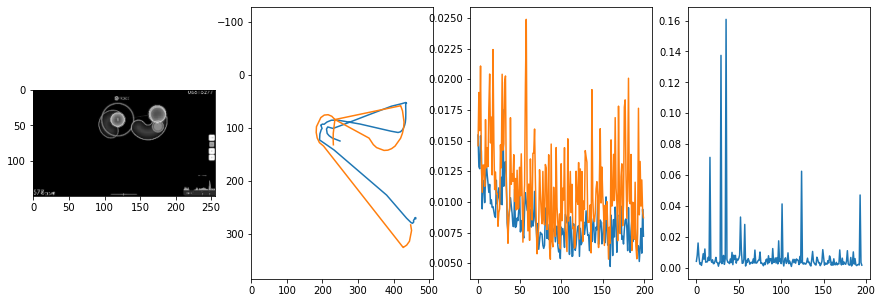


 206 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.21it/s  0.0073                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006035456619800391
outliers: 35
retrain: 4                 
val: 50/50 loss: 0.0035                                    
pred: 0.20501841604709625 0.4157876968383789
gt: 0.6171873211860657 0.3125000298023224
(143, 54)


<Figure size 1080x360 with 0 Axes>

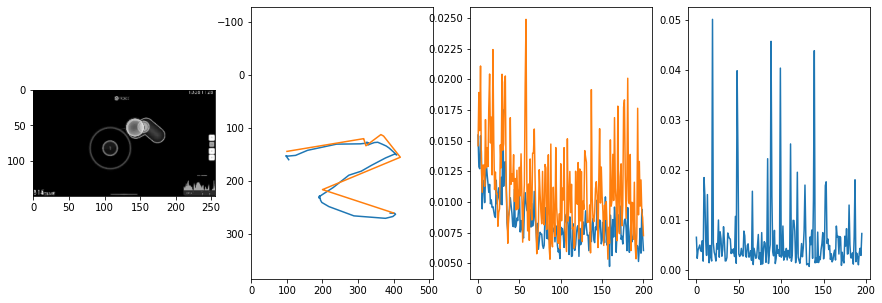


 207 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.50it/s  0.0022                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006619596069979206
outliers: 43
retrain: 4                 
val: 50/50 loss: 0.0081                                    
pred: 0.3073013722896576 0.4834185242652893
gt: 0.5814236998558044 0.1445750892162323
(138, 34)


<Figure size 1080x360 with 0 Axes>

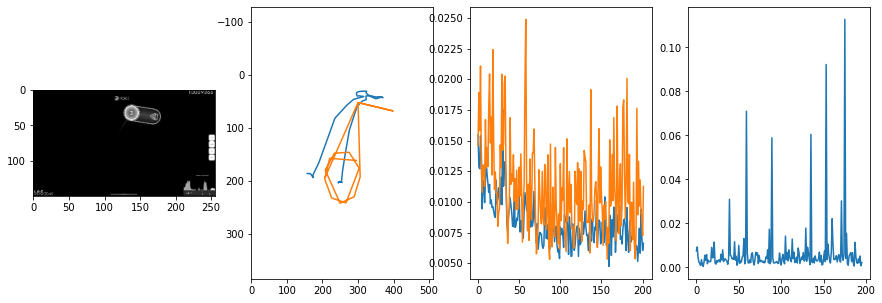


 208 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0071                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008410472367006374
outliers: 57
retrain: 4                 
val: 50/50 loss: 0.0034                                    
pred: 0.44116446375846863 0.41087472438812256
gt: 0.5000169277191162 0.16926704347133636
(125, 37)


<Figure size 1080x360 with 0 Axes>

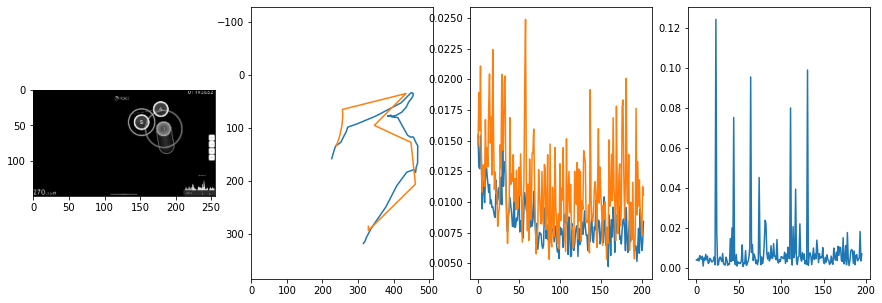


 209 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.23it/s  0.0044                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007898000426969386
outliers: 39
retrain: 4                 
val: 50/50 loss: 0.0040                                    
pred: 0.4669167995452881 0.3579478859901428
gt: 0.7363154292106628 0.43749508261680603
(162, 68)


<Figure size 1080x360 with 0 Axes>

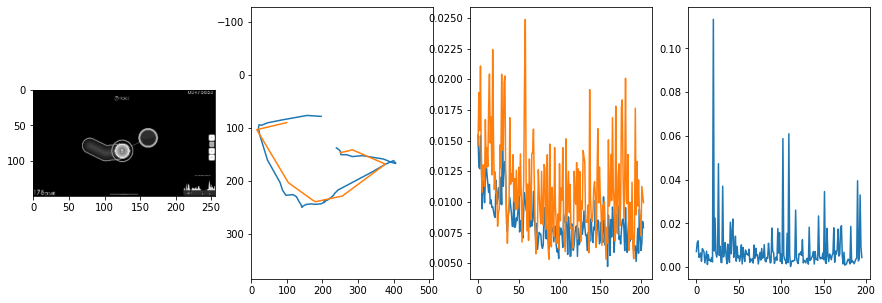


 210 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  14.00it/s  0.0407                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00741341590675839
outliers: 36
retrain: 4                 
val: 50/50 loss: 0.0101                                    
pred: 0.14711222052574158 0.3926008939743042
gt: 0.547562301158905 0.30300000309944153
(132, 53)


<Figure size 1080x360 with 0 Axes>

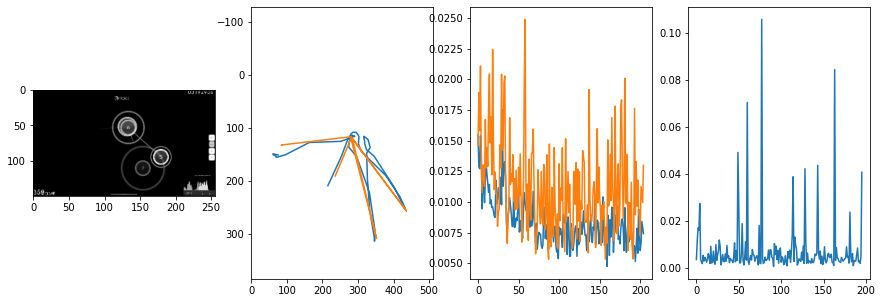


 211 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0083                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00987660618854107
outliers: 45
retrain: 4                 
val: 50/50 loss: 0.0089                                    
pred: 0.5368565320968628 0.4057931900024414
gt: 0.63671875 0.4791666567325592
(146, 73)


<Figure size 1080x360 with 0 Axes>

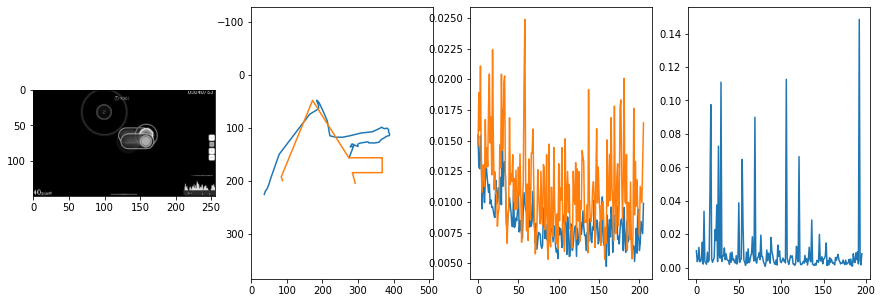


 212 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0054                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006987815167771519
outliers: 27
retrain: 4                 
val: 50/50 loss: 0.0072                                    
pred: 0.5529910326004028 0.07912568747997284
gt: 0.7396361231803894 0.024283161386847496
(162, 20)


<Figure size 1080x360 with 0 Axes>

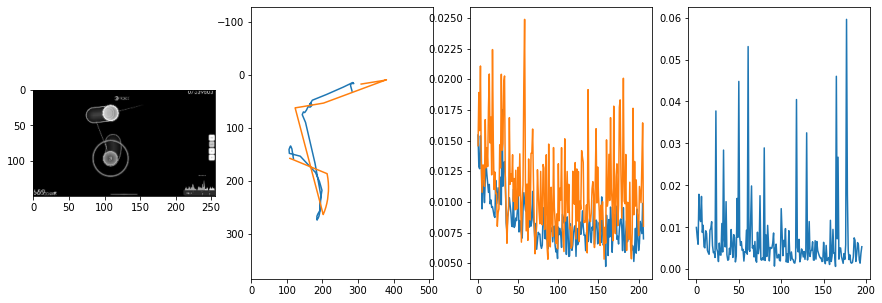


 213 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.05it/s  0.0019                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006283011657485206
outliers: 37
retrain: 4                 
val: 50/50 loss: 0.0041                                    
pred: 0.27292612195014954 0.4795888066291809
gt: 0.043075963854789734 0.5362836122512817
(54, 80)


<Figure size 1080x360 with 0 Axes>

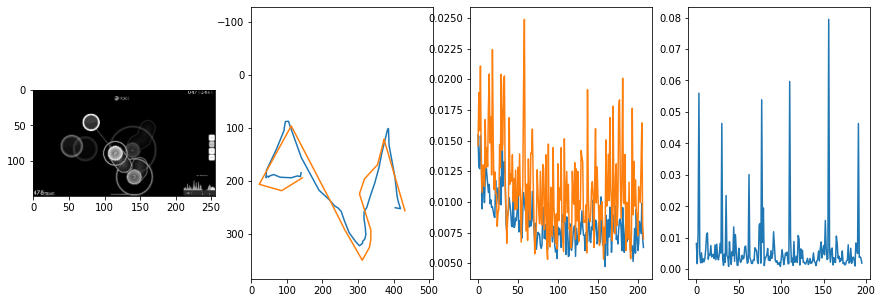


 214 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0012                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006240519936723939
outliers: 51
retrain: 4                 
val: 50/50 loss: 0.0050                                    
pred: 0.3153572380542755 0.3559132218360901
gt: 0.3049435317516327 0.37210050225257874
(95, 61)


<Figure size 1080x360 with 0 Axes>

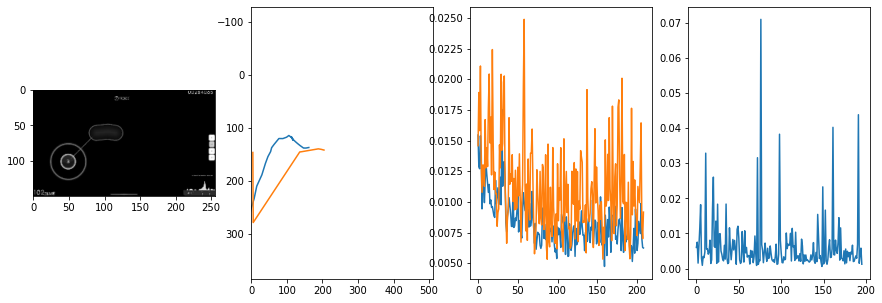


 215 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0128                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007204032706201305
outliers: 49
retrain: 4                 
val: 50/50 loss: 0.0140                                    
pred: 0.3821329176425934 0.6986706256866455
gt: 0.4098983407020569 0.7364018559455872
(111, 103)


<Figure size 1080x360 with 0 Axes>

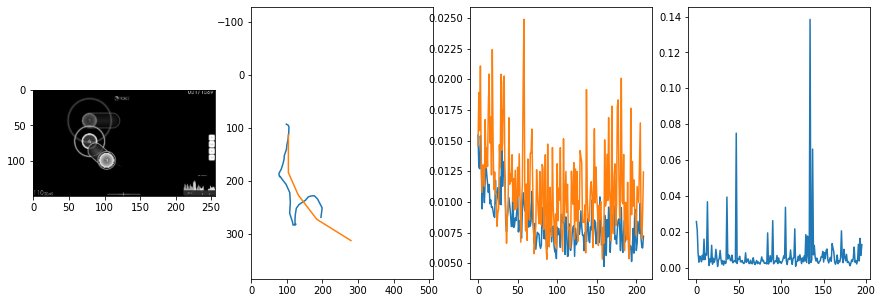


 216 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.96it/s  0.0016                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007323591292500781
outliers: 41
retrain: 4                 
val: 50/50 loss: 0.1228                                    
pred: 0.6886088848114014 0.34905868768692017
gt: 0.5000086426734924 0.7603936195373535
(125, 106)


<Figure size 1080x360 with 0 Axes>

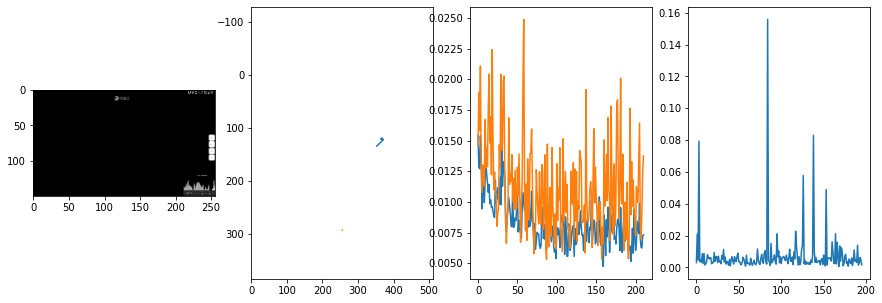


 217 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0024                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006620396117499212
outliers: 36
retrain: 4                 
val: 50/50 loss: 0.0021                                    
pred: 0.615152895450592 0.32161444425582886
gt: 0.5623236894607544 0.5001382827758789
(135, 76)


<Figure size 1080x360 with 0 Axes>

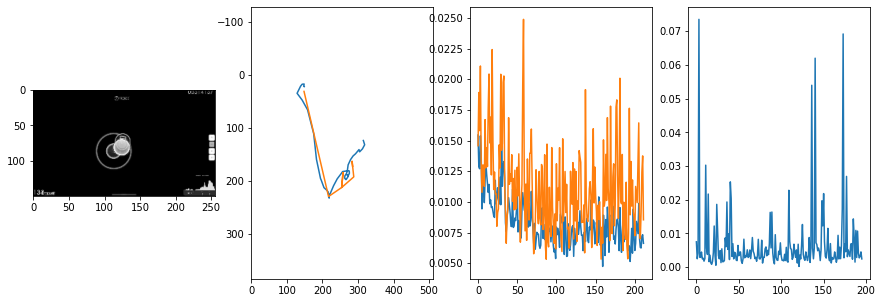


 218 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0028                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006320523442308494
outliers: 43
retrain: 4                 
val: 50/50 loss: 0.0075                                    
pred: 0.5538725852966309 0.43466266989707947
gt: 0.33203125 0.4427083432674408
(99, 69)


<Figure size 1080x360 with 0 Axes>

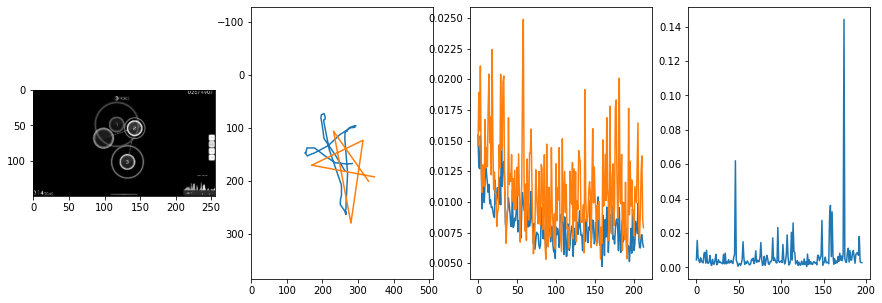


 219 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0031                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006184401697858132
outliers: 43
retrain: 4                 
val: 50/50 loss: 0.0083                                    
pred: 0.5399938821792603 0.532316267490387
gt: 0.40307095646858215 0.5158607363700867
(110, 77)


<Figure size 1080x360 with 0 Axes>

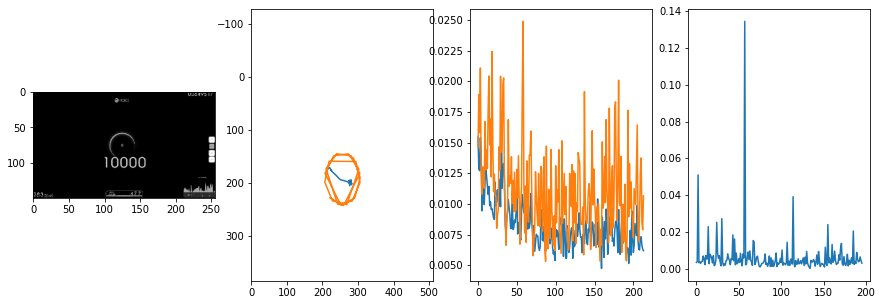


 220 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0156                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007079360476809041
outliers: 45
retrain: 4                 
val: 50/50 loss: 0.0069                                    
pred: 0.3170642852783203 0.4841780960559845
gt: 0.3613365590572357 0.2760311961174011
(104, 50)


<Figure size 1080x360 with 0 Axes>

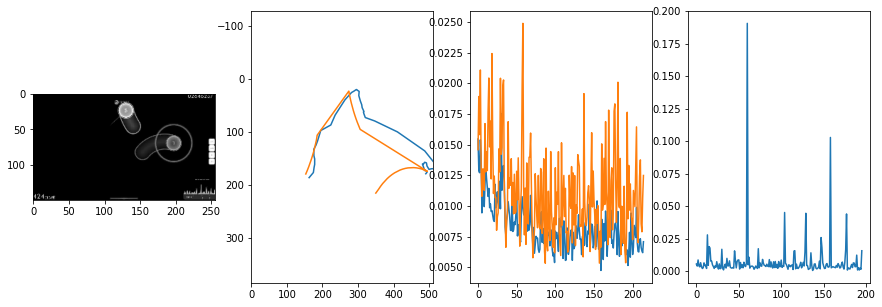


 221 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.35it/s  0.0053                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007159212945986596
outliers: 41
retrain: 4                 
val: 50/50 loss: 0.0090                                    
pred: 0.44290435314178467 0.5049268007278442
gt: 0.5761706829071045 0.10677241533994675
(137, 30)


<Figure size 1080x360 with 0 Axes>

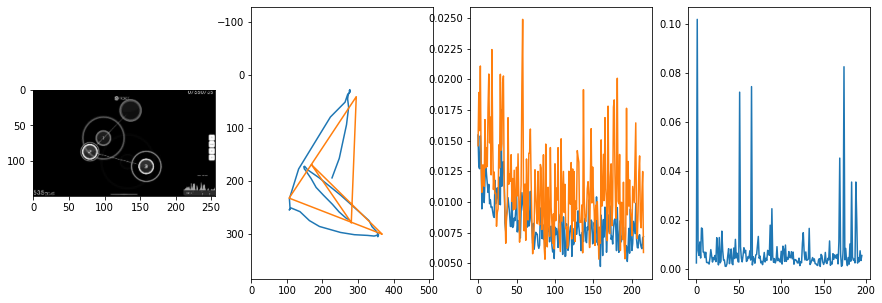


 222 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.09it/s  0.0089                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006885587069685856
outliers: 30
retrain: 4                 
val: 50/50 loss: 0.0097                                    
pred: 0.25058501958847046 0.20602692663669586
gt: 0.24077053368091583 0.19219756126403809
(85, 40)


<Figure size 1080x360 with 0 Axes>

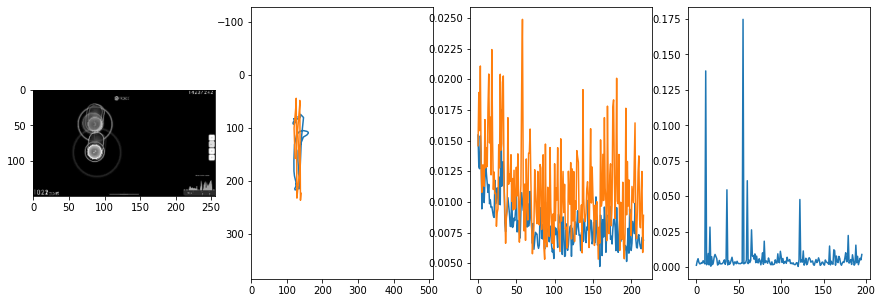


 223 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.19it/s  0.0407                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00869300219227978
outliers: 41
retrain: 4                 
val: 50/50 loss: 0.0033                                    
pred: 0.27656611800193787 0.48270195722579956
gt: 0.306640625 0.424479216337204
(95, 67)


<Figure size 1080x360 with 0 Axes>

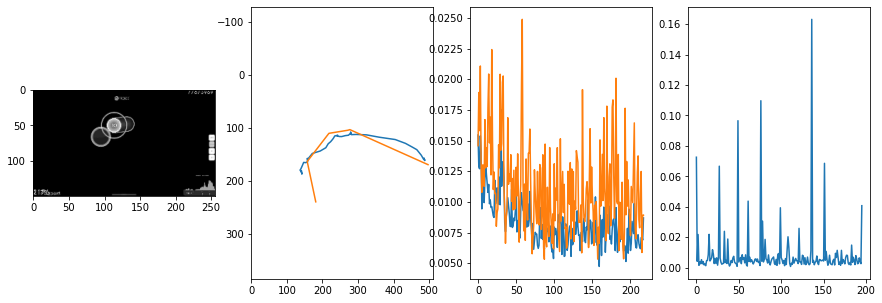


 224 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.11it/s  0.0007                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007160710855992986
outliers: 28
retrain: 4                 
val: 50/50 loss: 0.0132                                    
pred: 0.7947026491165161 0.5141071677207947
gt: 0.9375 0.375
(193, 61)


<Figure size 1080x360 with 0 Axes>

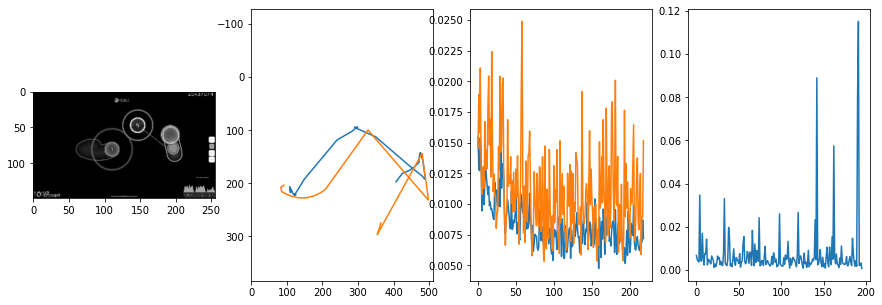


 225 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.26it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010116306871855251
outliers: 66
retrain: 4                 
val: 50/50 loss: 0.0160                                    
pred: 0.22662977874279022 0.38266003131866455
gt: 0.1250000149011612 0.2083333283662796
(67, 42)


<Figure size 1080x360 with 0 Axes>

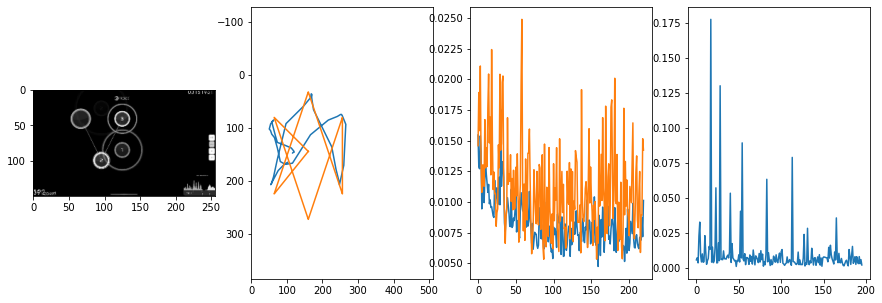


 226 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0020                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010033716454481877
outliers: 30
retrain: 4                 
val: 50/50 loss: 0.0049                                    
pred: 0.6157021522521973 0.7682138681411743
gt: 0.34375 0.34375
(101, 57)


<Figure size 1080x360 with 0 Axes>

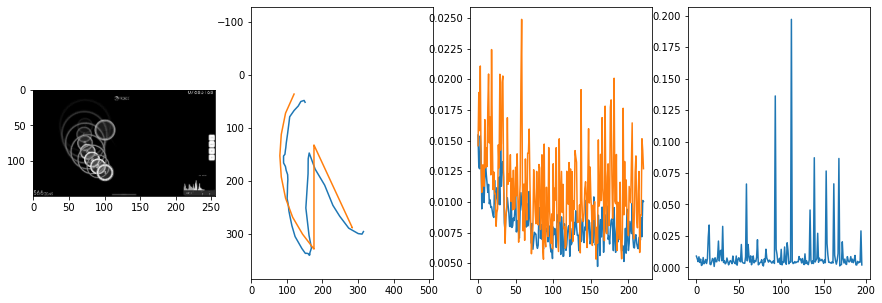


 227 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.91it/s  0.0022                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01188284784557811
outliers: 29
retrain: 4                 
val: 50/50 loss: 0.0053                                    
pred: 0.890431821346283 0.6167287826538086
gt: 0.9276906847953796 0.41361212730407715
(191, 66)


<Figure size 1080x360 with 0 Axes>

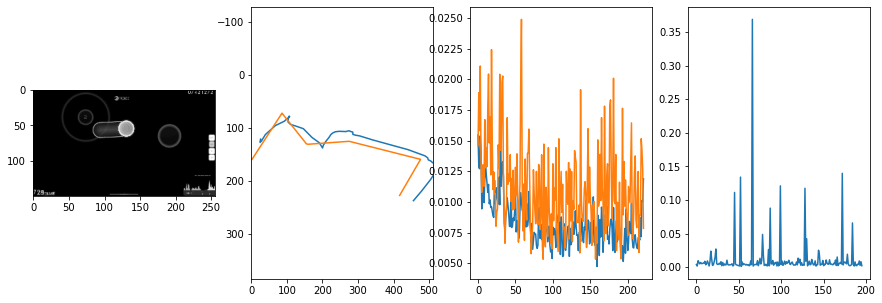


 228 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0016                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005860173655436279
outliers: 10
retrain: 4                 
val: 50/50 loss: 0.0100                                    
pred: 0.3636173903942108 0.4733462929725647
gt: 0.36029523611068726 0.4849001467227936
(103, 74)


<Figure size 1080x360 with 0 Axes>

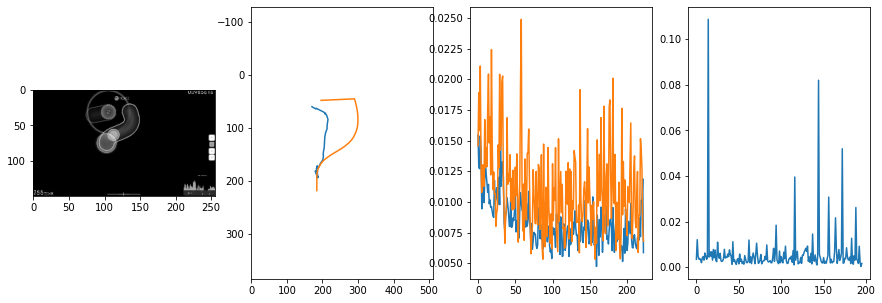


 229 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.11it/s  0.0043                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008536659767203822
outliers: 43
retrain: 4                 
val: 50/50 loss: 0.0049                                    
pred: 0.6209371089935303 0.7155036926269531
gt: 0.615234375 0.7317708134651184
(143, 103)


<Figure size 1080x360 with 0 Axes>

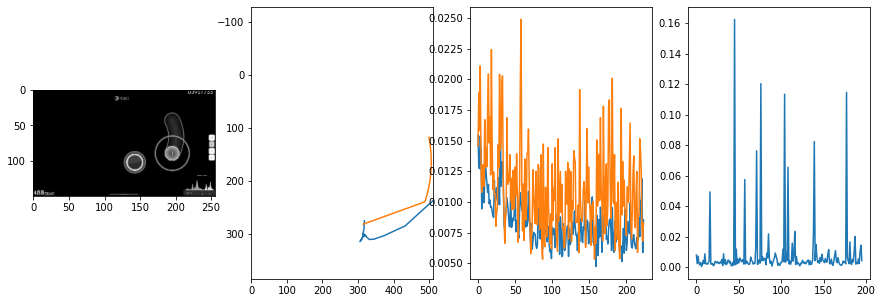


 230 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.09it/s  0.0005                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009293173812359466
outliers: 31
retrain: 4                 
val: 50/50 loss: 0.0009                                    
pred: 0.828870415687561 0.2897939383983612
gt: 0.7395256161689758 0.2223159223794937
(162, 43)


<Figure size 1080x360 with 0 Axes>

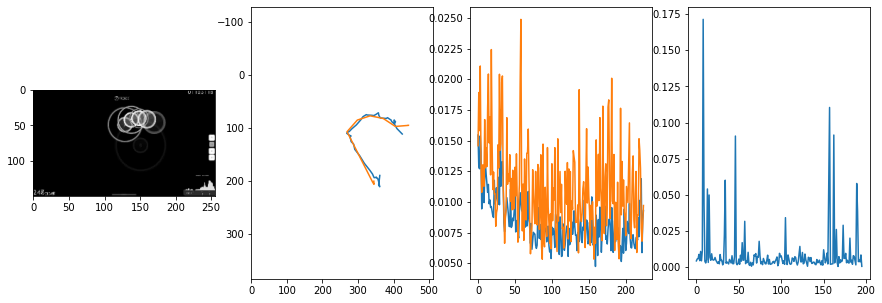


 231 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.28it/s  0.0480                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007752701453626992
outliers: 28
retrain: 4                 
val: 50/50 loss: 0.0042                                    
pred: 0.39802396297454834 0.5502259731292725
gt: 0.2734375 0.6119791865348816
(90, 89)


<Figure size 1080x360 with 0 Axes>

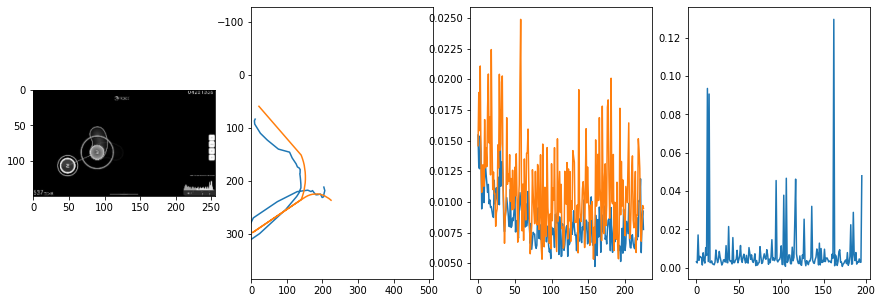


 232 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.27it/s  0.0086                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008228386549471535
outliers: 35
retrain: 4                 
val: 50/50 loss: 0.0069                                    
pred: 0.36796364188194275 0.8864926695823669
gt: 0.25780943036079407 0.8333311080932617
(87, 114)


<Figure size 1080x360 with 0 Axes>

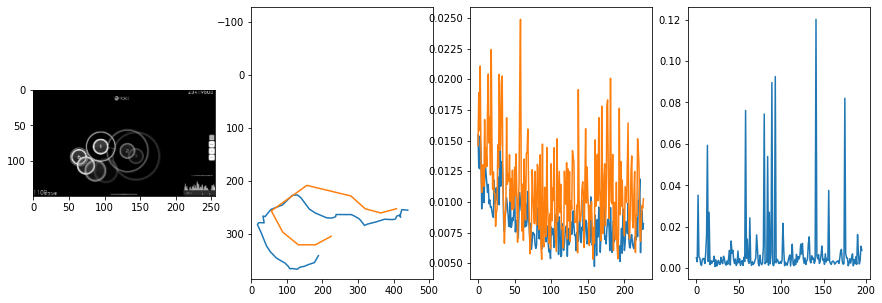


 233 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0115                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006538268408265288
outliers: 29
retrain: 4                 
val: 50/50 loss: 0.0026                                    
pred: 0.29414868354797363 0.6090055108070374
gt: 0.5625 0.3541666567325592
(135, 59)


<Figure size 1080x360 with 0 Axes>

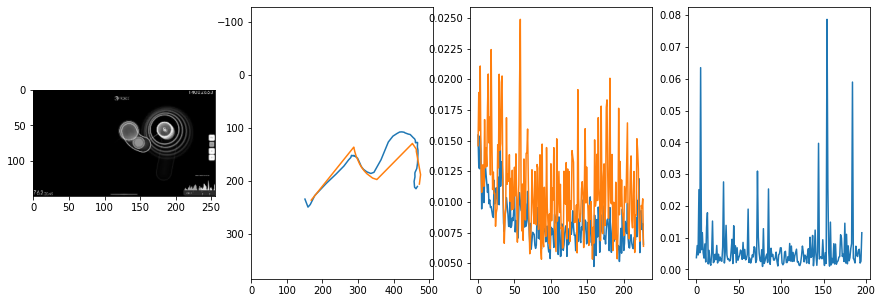


 234 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0072                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006729015553214502
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0054                                    
pred: 0.5396260023117065 0.5201499462127686
gt: 0.4228367209434509 0.4201938807964325
(113, 66)


<Figure size 1080x360 with 0 Axes>

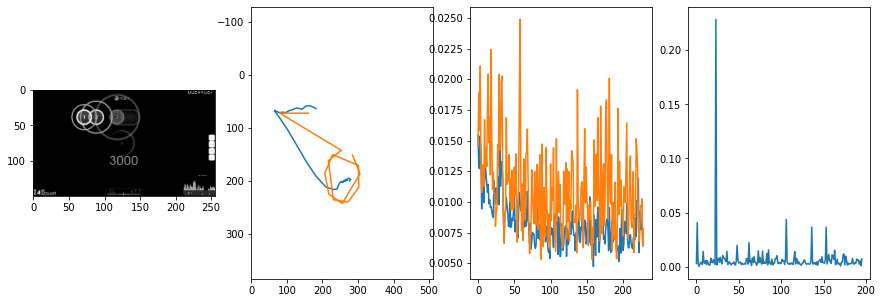


 235 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0050                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006657200284930046
outliers: 35
retrain: 4                 
val: 50/50 loss: 0.0045                                    
pred: 0.26740849018096924 0.8264963626861572
gt: 0.6270723342895508 0.7084886431694031
(145, 100)


<Figure size 1080x360 with 0 Axes>

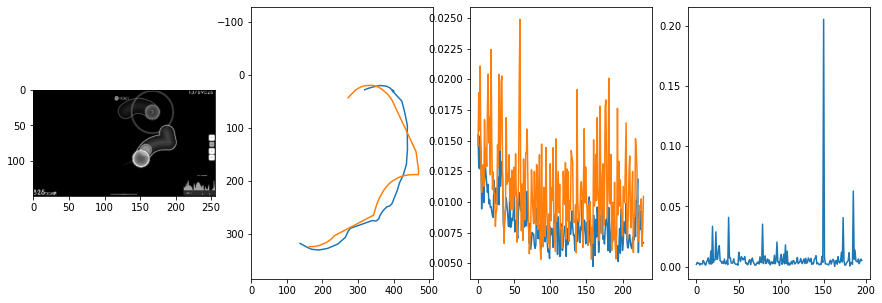


 236 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007254466245174218
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0018                                    
pred: 0.3512818217277527 0.32742854952812195
gt: 0.43984663486480713 0.19961391389369965
(116, 41)


<Figure size 1080x360 with 0 Axes>

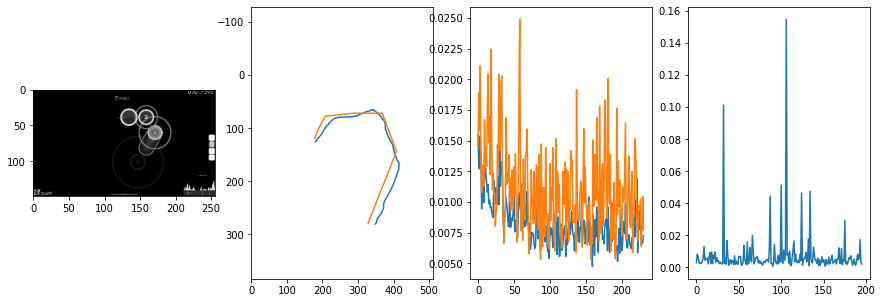


 237 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.18it/s  0.0109                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008415971106044208
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0090                                    
pred: 0.21715477108955383 0.7331115007400513
gt: 0.16446195542812347 0.764265775680542
(73, 106)


<Figure size 1080x360 with 0 Axes>

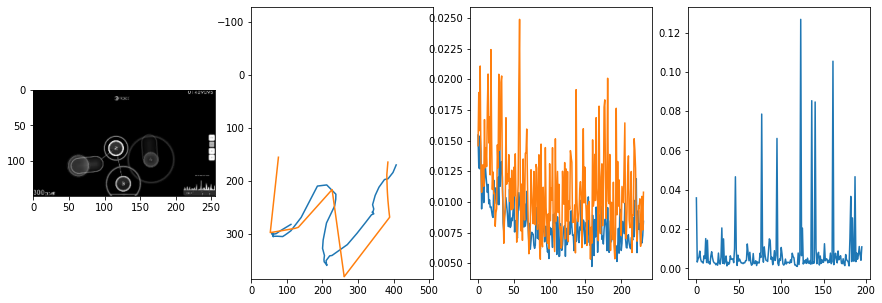


 238 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0018                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008686114703091241
outliers: 38
retrain: 4                 
val: 50/50 loss: 0.0169                                    
pred: 0.07454299926757812 0.6367213726043701
gt: 0.3359367549419403 0.7395809292793274
(100, 104)


<Figure size 1080x360 with 0 Axes>

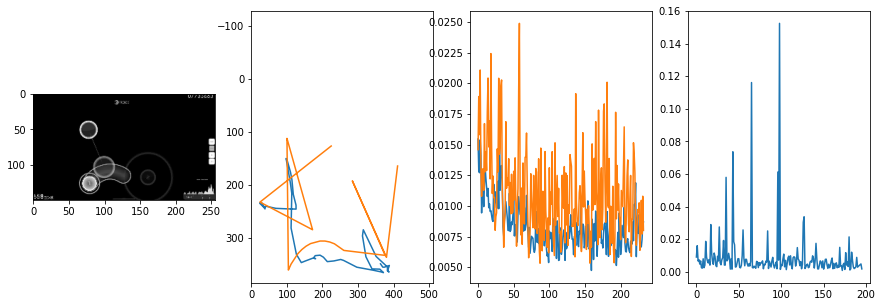


 239 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0691                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008565063162454955
outliers: 33
retrain: 4                 
val: 50/50 loss: 0.0043                                    
pred: 0.12983372807502747 0.6512296795845032
gt: 0.13162986934185028 0.5456762909889221
(68, 81)


<Figure size 1080x360 with 0 Axes>

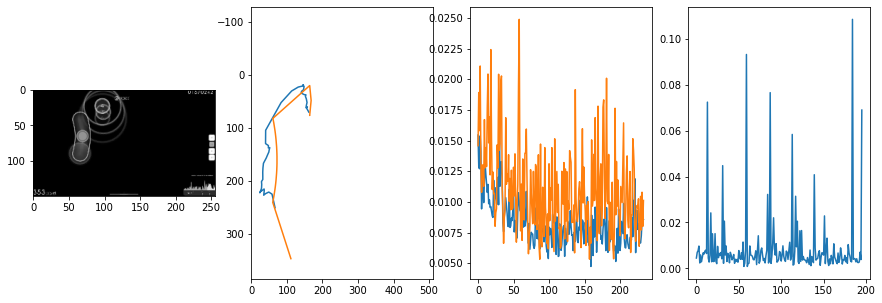


 240 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.14it/s  0.0025                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006404350131449565
outliers: 22
retrain: 4                 
val: 50/50 loss: 0.0088                                    
pred: 0.4430682063102722 0.1927574872970581
gt: 0.328125 0.875
(98, 119)


<Figure size 1080x360 with 0 Axes>

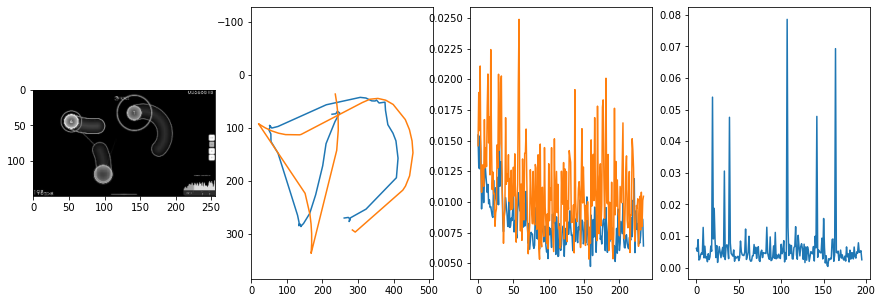


 241 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.97it/s  0.0027                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010464979970604372
outliers: 55
retrain: 4                 
val: 50/50 loss: 0.0135                                    
pred: 0.4180176556110382 0.6822457313537598
gt: 0.5400235056877136 0.8572375178337097
(131, 117)


<Figure size 1080x360 with 0 Axes>

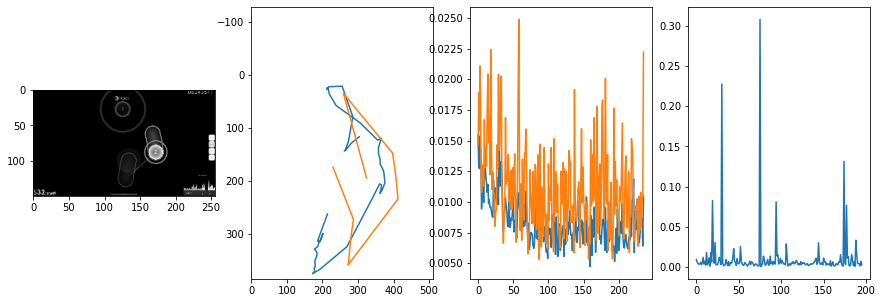


 242 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0280                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01134452850460455
outliers: 41
retrain: 4                 
val: 50/50 loss: 0.0035                                    
pred: 0.08404476940631866 0.13984070718288422
gt: 0.12013891339302063 0.03226986154913902
(66, 21)


<Figure size 1080x360 with 0 Axes>

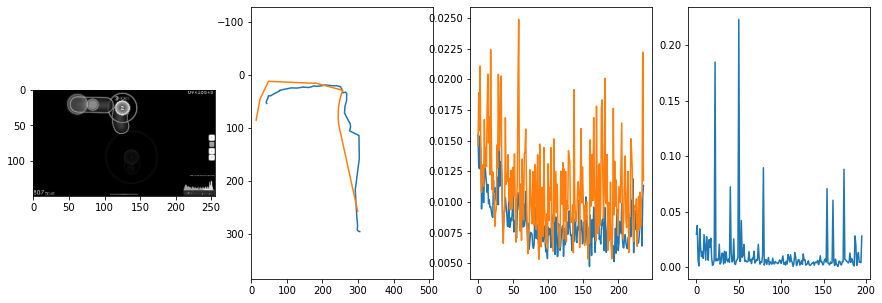


 243 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.99it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010222603973210315
outliers: 23
retrain: 4                 
val: 50/50 loss: 0.0151                                    
pred: 0.25853580236434937 0.8055940270423889
gt: 0.3991308808326721 0.7821745276451111
(109, 108)


<Figure size 1080x360 with 0 Axes>

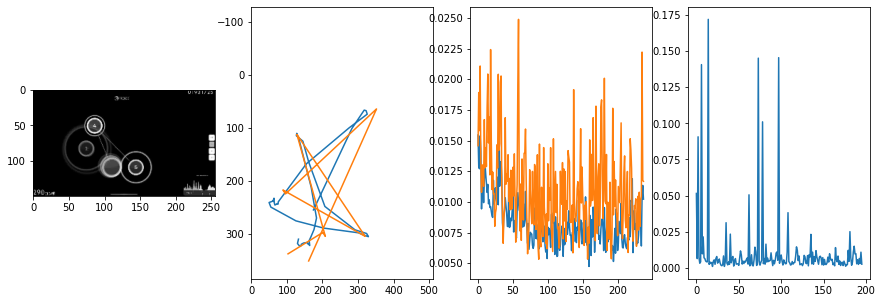


 244 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.28it/s  0.0038                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007405946037152364
outliers: 23
retrain: 4                 
val: 50/50 loss: 0.0105                                    
pred: 0.7177008390426636 0.6199344396591187
gt: 0.47940096259117126 0.8267012238502502
(122, 114)


<Figure size 1080x360 with 0 Axes>

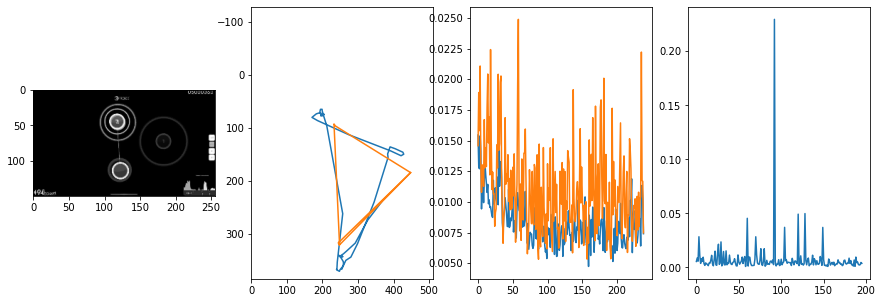


 245 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.16it/s  0.0033                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007442969628384014
outliers: 37
retrain: 4                 
val: 50/50 loss: 0.0057                                    
pred: 0.2719057500362396 0.7300373315811157
gt: 0.2819375991821289 0.6780001521110535
(91, 96)


<Figure size 1080x360 with 0 Axes>

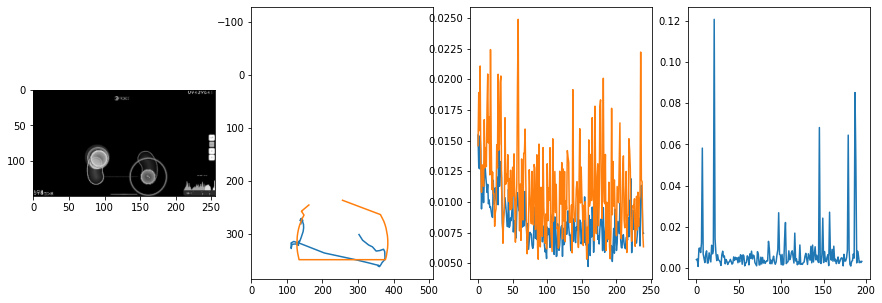


 246 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0017                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00910445014982988
outliers: 45
retrain: 4                 
val: 50/50 loss: 0.0075                                    
pred: 0.4062928557395935 0.4878326654434204
gt: 0.3046647310256958 0.5702559351921082
(95, 84)


<Figure size 1080x360 with 0 Axes>

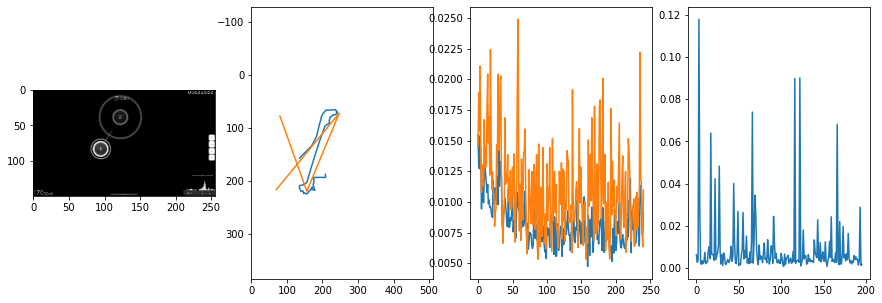


 247 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.92it/s  0.0100                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008781530214631003
outliers: 25
retrain: 4                 
val: 50/50 loss: 0.0102                                    
pred: 0.7212395668029785 0.08589223027229309
gt: 0.6818259954452515 0.3566422164440155
(153, 59)


<Figure size 1080x360 with 0 Axes>

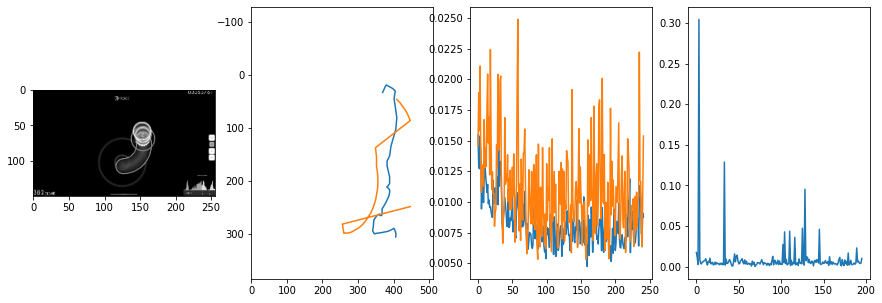


 248 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.05it/s  0.0012                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006528030502448353
outliers: 30
retrain: 4                 
val: 50/50 loss: 0.0021                                    
pred: 0.12116386741399765 0.8352842330932617
gt: 0.06473422795534134 0.9138309359550476
(58, 124)


<Figure size 1080x360 with 0 Axes>

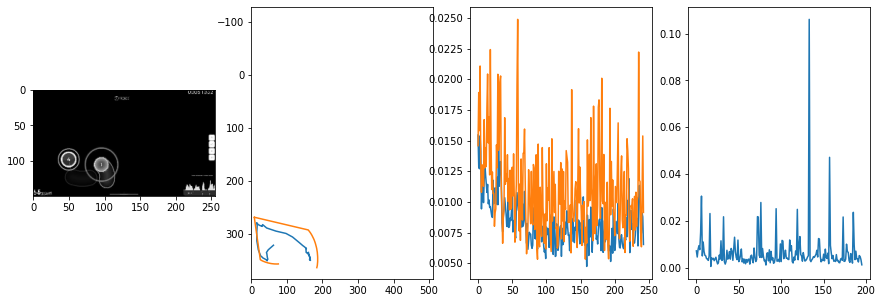


 249 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.84it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0069637332896806525
outliers: 47
retrain: 4                 
val: 50/50 loss: 0.0011                                    
pred: 0.298036128282547 0.8945448398590088
gt: 0.32622623443603516 0.8593315482139587
(98, 117)


<Figure size 1080x360 with 0 Axes>

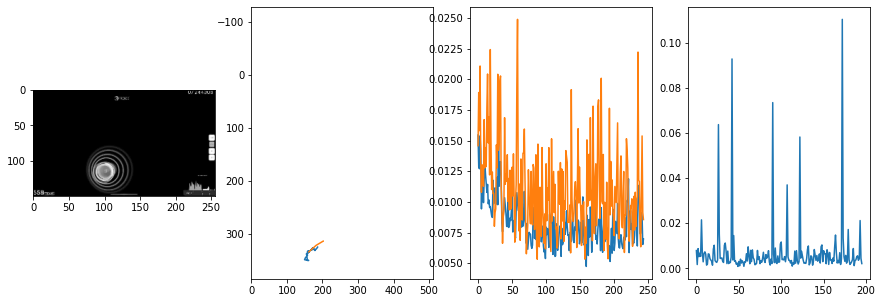


 250 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.22it/s  0.0050                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008189487345700809
outliers: 36
retrain: 4                 
val: 50/50 loss: 0.0033                                    
pred: 0.8838193416595459 0.51481032371521
gt: 0.9256508350372314 0.2405955195426941
(191, 45)


<Figure size 1080x360 with 0 Axes>

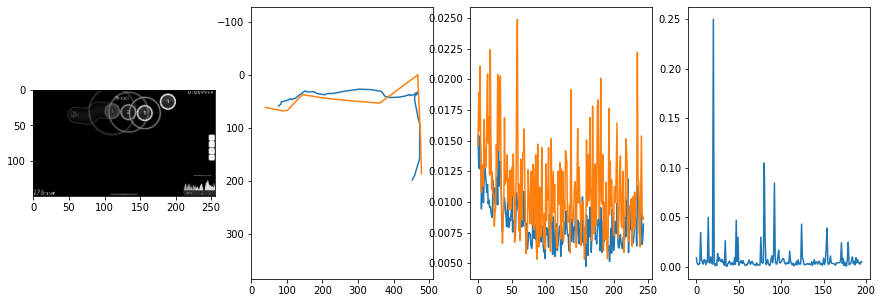


 251 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.17it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009008797892067601
outliers: 30
retrain: 4                 
val: 50/50 loss: 0.0021                                    
pred: 0.8132164478302002 0.4613865613937378
gt: 0.5683595538139343 0.299479216337204
(136, 52)


<Figure size 1080x360 with 0 Axes>

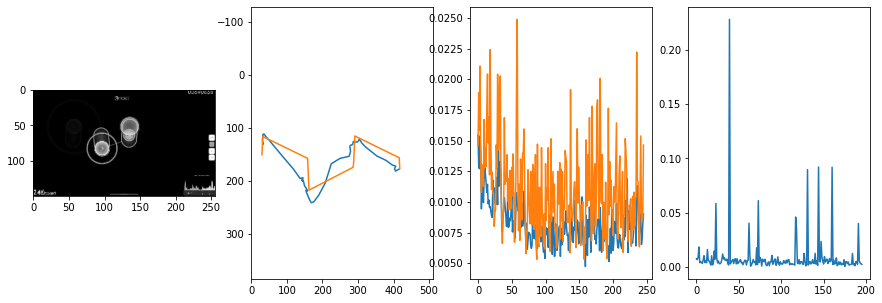


 252 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0033                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007900679208414287
outliers: 37
retrain: 4                 
val: 50/50 loss: 0.0061                                    
pred: 0.7039662599563599 0.43626391887664795
gt: 0.7851460576057434 0.412312775850296
(169, 65)


<Figure size 1080x360 with 0 Axes>

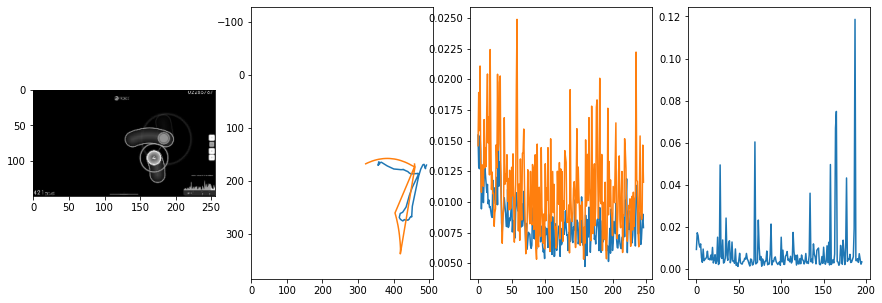


 253 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0073                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005636245431170599
outliers: 17
retrain: 4                 
val: 50/50 loss: 0.0089                                    
pred: 0.23068897426128387 0.5968117117881775
gt: 0.3125 0.8749949336051941
(96, 119)


<Figure size 1080x360 with 0 Axes>

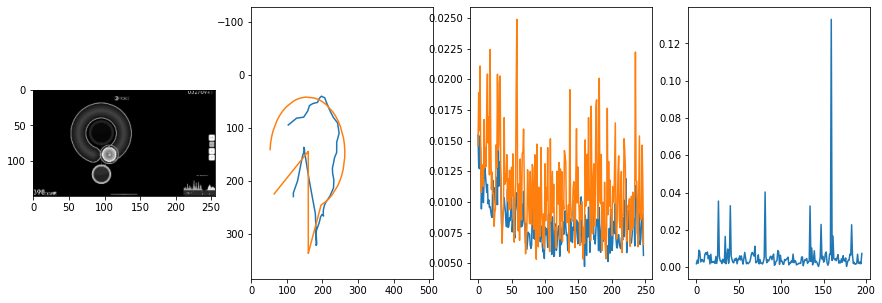


 254 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0037                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006665299262564002
outliers: 59
retrain: 4                 
val: 50/50 loss: 0.0022                                    
pred: 0.7919431328773499 0.5963906049728394
gt: 0.7131239175796509 0.7668859362602234
(158, 107)


<Figure size 1080x360 with 0 Axes>

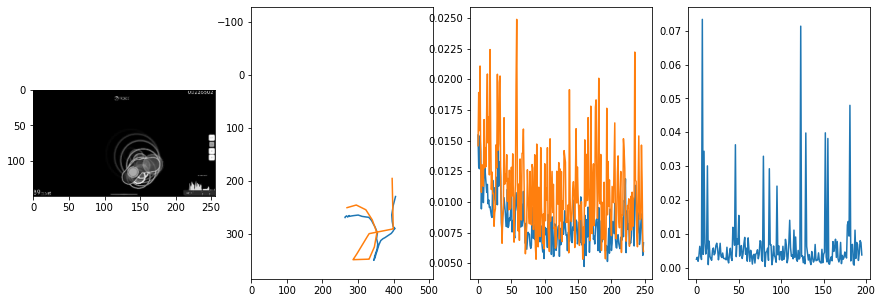


 255 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.99it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005995916241568475
outliers: 41
retrain: 4                 
val: 50/50 loss: 0.0080                                    
pred: 0.8673286437988281 0.11050236970186234
gt: 0.888671875 0.2057291716337204
(185, 41)


<Figure size 1080x360 with 0 Axes>

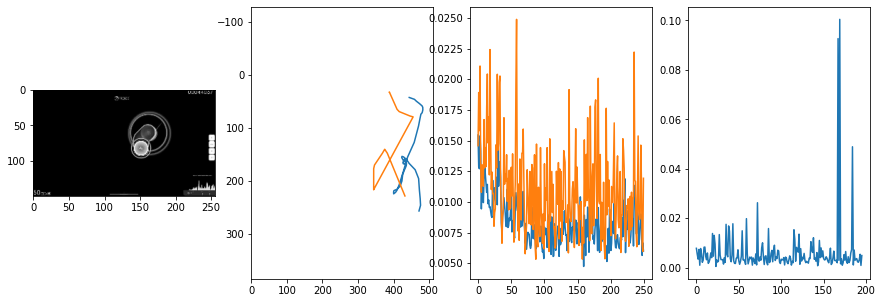


 256 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0009                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007217451980829296
outliers: 44
retrain: 4                 
val: 50/50 loss: 0.0037                                    
pred: 0.29714906215667725 0.3898427486419678
gt: 0.423828125 0.265625
(113, 48)


<Figure size 1080x360 with 0 Axes>

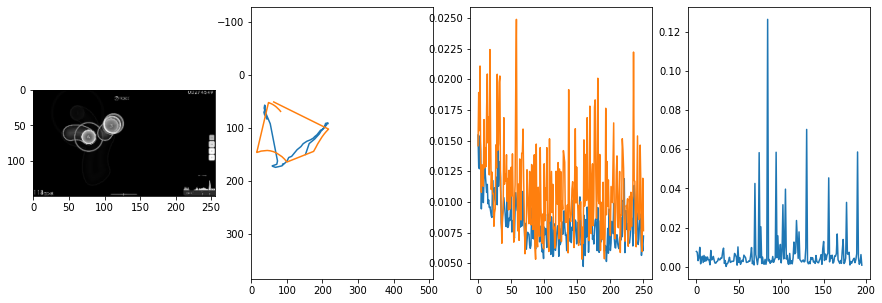


 257 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0084                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005879025280592032
outliers: 29
retrain: 4                 
val: 50/50 loss: 0.0077                                    
pred: 0.5277921557426453 0.6066192984580994
gt: 0.5000055432319641 0.500026524066925
(125, 76)


<Figure size 1080x360 with 0 Axes>

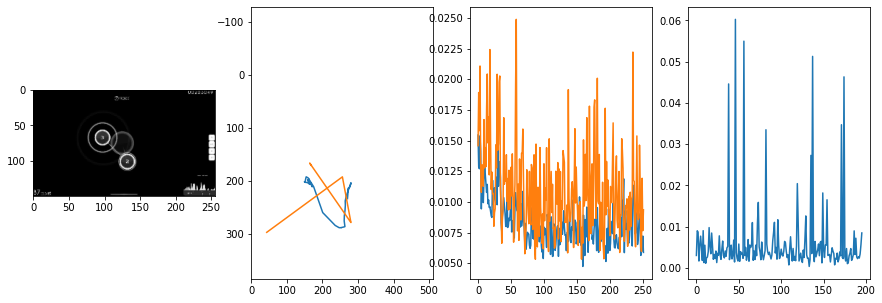


 258 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.93it/s  0.0032                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00729570332564157
outliers: 47
retrain: 4                 
val: 50/50 loss: 0.0040                                    
pred: 0.5187150835990906 0.5425567626953125
gt: 0.556387186050415 0.6247392296791077
(134, 90)


<Figure size 1080x360 with 0 Axes>

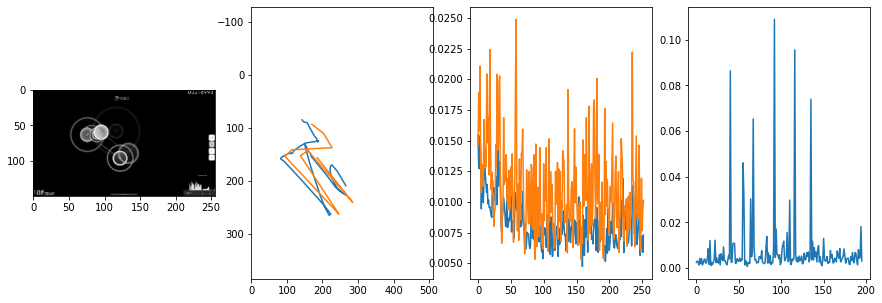


 259 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0009                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007217921039840321
outliers: 35
retrain: 4                 
val: 50/50 loss: 0.0036                                    
pred: 0.2513970732688904 0.23784080147743225
gt: 0.240234375 0.0520833320915699
(85, 24)


<Figure size 1080x360 with 0 Axes>

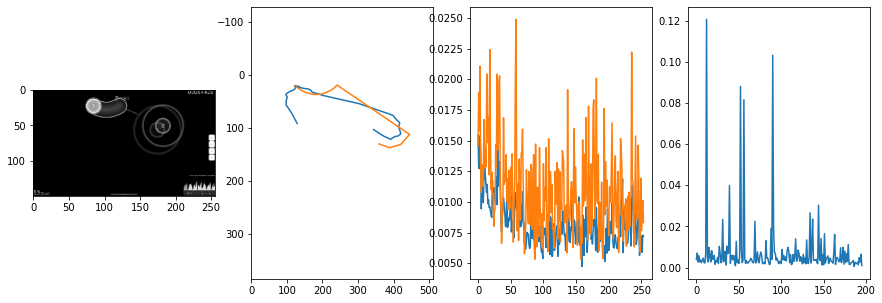


 260 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.95it/s  0.0019                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005900177328932879
outliers: 28
retrain: 4                 
val: 50/50 loss: 0.0043                                    
pred: 0.108986496925354 0.7842386960983276
gt: 0.21093787252902985 0.880207359790802
(80, 120)


<Figure size 1080x360 with 0 Axes>

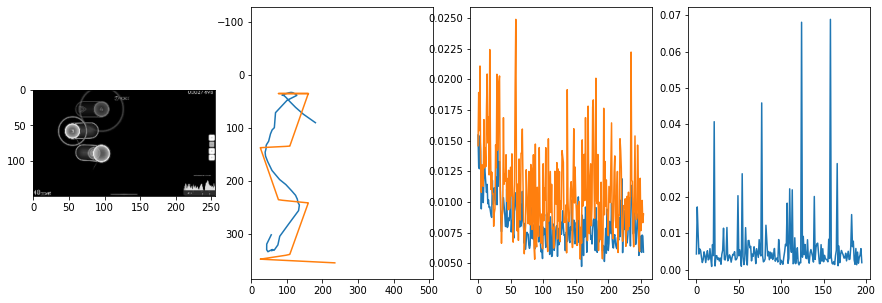


 261 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0059                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0068618231298573015
outliers: 52
retrain: 4                 
val: 50/50 loss: 0.0145                                    
pred: 0.6875932812690735 0.19625580310821533
gt: 0.6791093945503235 0.20756250619888306
(153, 42)


<Figure size 1080x360 with 0 Axes>

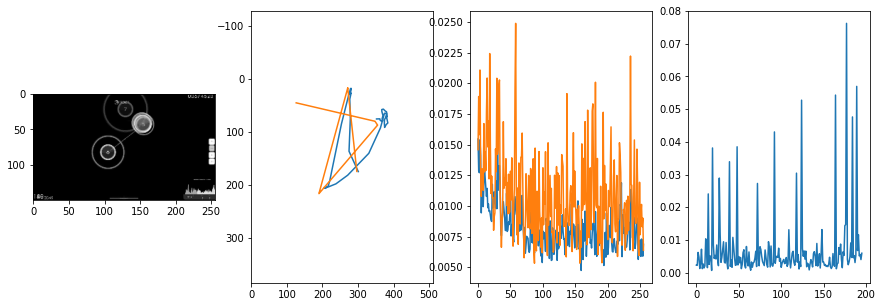


 262 of 262
2478.469758272171 secs


In [27]:
start = time.time()

epochs = 128
loss_thresh = 0.0003
rnum_min = 4
trainVNRecurse()

end = time.time()
print(end - start, 'secs')

In [28]:
print(best_loss)
torch.save(best_weights, model_path + str(epoch_cum) + '.pt')

0.005331002291641198


# Test Model

In [29]:
import os
import cv2
import torch
import torchvision.transforms as transforms

In [42]:
vn.load_state_dict(torch.load(model_path + str(262) + '.pt'))

<All keys matched successfully>

In [30]:
#osud = '../ex/beatmaps/567301 LamazeP - Spam Jack'
#osuf = 'LamazeP - Spam Jack (OsuToothbrush) [SPAM].osu'
#osud = '../ex/beatmaps/252981 DJ Okawari - Flower Dance (Short Ver)'
#osuf = 'DJ Okawari - Flower Dance (Short Ver.) (-Hanayuki-) [Relax].osu'
#osud = '../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku'
#osuf = 'sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-\'s Hard].osu'
#osud = '../demo/beatmaps/835194 Mili - Vulnerability'
#osuf = 'Mili_-_Vulnerability_IceKalt_Saturnalizes_Insane.osu'
#osud = '../demo/beatmaps/653534 Panda Eyes - ILY'
#osuf = 'Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu'
osud = '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun'
osuf = 'Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu'

In [31]:
osr = OSR(osud, osuf, sample_rate=sample_rate, hop_size=hop_size, hidden=True, vtmp='../demo/vids/')

In [32]:
osr.queue_vid()

'../demo/vids/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osuhdn.avi'

In [33]:
video_path = os.path.join('../demo/vids/', osuf + '.avi')

In [34]:
vn.to(device)
vn.init_hidden(1)
vn.eval()

VN(
  (convB1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convC1): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPC1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (lstmA): LSTM(19456, 256, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=256, out_features=256, bias=True)
  (normA): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (linearB): Linear(in_features=256, out_features=32, bias=True)
  (normB): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
  (linearC): Linear(in_features=32, out_features=2, bias=True)
)

In [43]:
start = time.time()

transform = transforms.ToTensor()
frames = []
vc = cv2.VideoCapture(video_path)
p = []
while True:
    r, f = vc.read()
    if r is False:
        break
    f = cv2.resize(f, (0,0), fx=scale, fy=scale)
    f = cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
    F = transform(f).to(device)
    with torch.no_grad():
        P = vn(F.unsqueeze(0).unsqueeze(0))
    p.append(P.squeeze(0).squeeze(0).cpu().detach().numpy())
    
end = time.time()
print(end - start, 'secs')

8.386222124099731 secs


In [44]:
np.save('predVN.npy', p)

# Create Replay Video

In [45]:
from IPython.display import Video

In [46]:
eosud = osud.replace('/', '\/')

In [47]:
!sed -i "s/Beatmap path.*/Beatmap path\": \"$eosud\/$osuf\",/" data.json
!sed -i "s/Output path.*/Output path\": \"videoVN.mp4\",/" data.json

In [48]:
!python create_replayVN.py predVN.npy 50

2022-04-12 12:01:21,977:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-12 12:01:21,977:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'videoVN.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7f8893cb03d0>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb'

In [49]:
Video("videoVN.mp4")

In [84]:
!sed -i "s/Output path.*/Output path\": \"video.mp4\",/" data.json

In [85]:
!python create_replay.py predHN.npy predVN.npy 50 0.5

2022-04-09 22:00:10,213:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-09 22:00:10,213:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '../demo/beatmaps/653534 Panda Eyes - ILY/Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'video.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7f721b89b640>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb': [200, 214, 229], 'Alpha': 0

In [70]:
Video("video.mp4")